<h1 style="font-size:100px; text-align:center;">PHOTON-ALP CONVERSION VISUALIZATION</h1>

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Ellipse
from matplotlib.lines import Line2D
from matplotlib import animation
from IPython.display import HTML

# ----------------- Params
np.random.seed(7)
W, H = 12, 6.75 
xlim = (-1.0, 1.0)
ylim = (-0.56, 0.56)

fps = 30
duration_s = 1
frames = fps * duration_s

conv_frame = int(frames * 0.45)
y_path_freq = 1.5 * np.pi

def make_starfield(n=300):
    xs = np.random.uniform(xlim[0], xlim[1], n)
    ys = np.random.uniform(ylim[0], ylim[1], n)
    sizes = np.random.uniform(1, 6, n)
    alpha = np.clip(np.random.normal(0.65, 0.15, n), 0.25, 0.9)
    return xs, ys, sizes, alpha

def make_B_lines():
    rng = np.random.default_rng(42)
    lines = []
    n_lines = 8
    ys = np.linspace(-0.4, 0.4, 200)      
    for i in range(n_lines):
        base = -0.15 + i*0.06      
        x = base + 0.02*np.sin(2*np.pi*ys*0.8 + i) \
                  + 0.01*np.sin(6*ys + rng.uniform(0, 2*np.pi))
        lines.append((x, ys))
    return lines

def path_xy(frame):
    x = -0.95 + 1.9 * (frame / (frames - 1))
    y = 0.06*np.sin(y_path_freq * (frame / (frames - 1))) + 0.02*np.sin(5*y_path_freq * (frame / (frames - 1)))
    return x, y

# ----------------- Figure -----------------
fig, ax = plt.subplots(figsize=(W, H))
ax.set_xlim(*xlim); ax.set_ylim(*ylim); ax.set_aspect('equal'); ax.axis('off')
fig.subplots_adjust(0,0,1,1)

# Background
fig.patch.set_facecolor("black") 
ax.set_facecolor("black")         
sx, sy, ss, sa = make_starfield(300)
stars = ax.scatter(sx, sy, s=ss, alpha=sa)

# AGN
agn_core = Circle((xlim[0] + 0.1, 0.02), 0.055, ec='none', fc='black', alpha=1.0)
agn_halo = Circle((xlim[0] + 0.1, 0.02), 0.11, ec='none', fc='yellow', alpha=0.35)
agn_disk = Ellipse((xlim[0] + 0.096, 0.0), 0.26, 0.08, angle=8, ec='none', fc='orange', alpha=0.35)
for p in (agn_halo, agn_core, agn_disk): ax.add_patch(p)

# Cluster clouds
rng_cloud = np.random.default_rng(12)
for r, a in [(0.30, 0.18), (0.22, 0.16), (0.36, 0.12), (0.28, 0.1)]:
    cx = rng_cloud.uniform(-0.05, 0.45)
    cy = rng_cloud.uniform(-0.15, 0.15)
    ax.add_patch(Circle((cx, cy), r, ec='none', fc='deepskyblue', alpha=a))

# B-field lines
B_lines = make_B_lines()
B_artists = [ax.plot(xs, ys, lw=1.0, alpha=0.35)[0] for xs, ys in B_lines]

# Photon & axion glyphs
photon, = ax.plot([], [], marker='o', ms=10, mec='none', mfc='yellow')
photon_glow = Circle((0,0), 0.03, ec='none', fc='yellow', alpha=0.25)
ax.add_patch(photon_glow)

axion, = ax.plot([], [], marker='o', ms=10, mec='none', mfc='red')
axion_glow = Circle((0,0), 0.03, ec='none', fc='red', alpha=0.22)
ax.add_patch(axion_glow)
axion_label = ax.text(0, 0, r"$a$", fontsize=16, ha='center', va='center', alpha=0.0)

# Titles & legend
ax.text(0.5, 0.94, "Photon → Axion conversion in a Galaxy Cluster (artist's impression)",
        ha='center', va='center', transform=ax.transAxes, fontsize=14, alpha=0.95)
ax.text(0.5, 0.90, "AGN photon traverses a magnetized cluster; it converts to an axion",
        ha='center', va='center', transform=ax.transAxes, fontsize=10, alpha=0.75)
legend_elems = [
    Line2D([0], [0], marker='o', color='w', label='Photon', markerfacecolor='yellow', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Axion (a)', markerfacecolor='red', markersize=8),
]
ax.legend(handles=legend_elems, loc='lower right', frameon=False, fontsize=9)

# ----------------- Animation functions -----------------
def init():
    photon.set_data([], [])
    axion.set_data([], [])
    axion_label.set_alpha(0.0)
    return [photon, axion, photon_glow, axion_glow, axion_label]

def update(frame):
    x, y = path_xy(frame)

    # twinkle stars
    if frame % 4 == 0:
        tw = np.clip(sa + 0.12*np.sin(2*np.pi*(frame/24.0) + np.linspace(0, 2*np.pi, sa.size)), 0.2, 0.95)
        stars.set_alpha(tw)

    # wobble B-lines
    for i, (xs, ys) in enumerate(B_lines):
        wobble = 0.006*np.sin(6*ys + 0.1*frame + i)
        B_artists[i].set_data(xs + wobble, ys)

    if frame < conv_frame:
        photon.set_data([x], [y]); photon.set_alpha(1.0)
        photon_glow.center = (x, y); photon_glow.set_alpha(0.25)
        axion.set_alpha(0.0); axion_glow.set_alpha(0.0); axion_label.set_alpha(0.0)
    elif frame == conv_frame:
        photon.set_alpha(0.0); photon_glow.set_alpha(0.0)
        axion.set_data([x], [y]); axion.set_alpha(1.0)
        axion_glow.center = (x, y); axion_glow.set_alpha(0.4)
        axion_label.set_position((x, y)); axion_label.set_alpha(1.0)
    else:
        axion.set_data([x], [y]); axion.set_alpha(1.0)
        axion_glow.center = (x, y)
        fade = max(0.12, 0.4 - 0.25*((frame - conv_frame)/(frames - conv_frame)))
        axion_glow.set_alpha(fade)
        axion_label.set_position((x, y)); axion_label.set_alpha(0.9)

    return [photon, axion, photon_glow, axion_glow, axion_label] + B_artists

anim = animation.FuncAnimation(fig, update, init_func=init,
                               frames=frames, interval=1000/fps, blit=True)

HTML(anim.to_jshtml())
plt.close(fig)
HTML(anim.to_jshtml())

<h1 style="font-size:100px; text-align:center;">CONSTANT MAGNETIC FIELD</h1>

1.95e-05
At E = 1 TeV:
  Δ_QED = 2.808e-04 kpc^-1
  Δ_CMB = 3.682e-03 kpc^-1


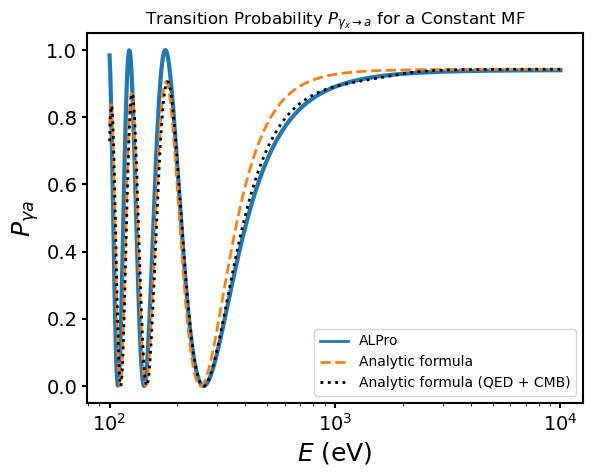

In [523]:
import sys
sys.path.append("/Users/Logan/ALPro")

import alpro
import matplotlib.pyplot as plt
import numpy as np
import contextlib, io

alpro.util.set_default_plot_params()

# ---------------- ALPro 
with contextlib.redirect_stdout(io.StringIO()):
    s = alpro.Survival("custom")

n_cells = 100
s.initialise_domain()
s.domain.ne     = np.full(n_cells, 1e-3)      # cm^-3
s.domain.B      = np.full(n_cells, 1e-10)     # Tesla (1 μG)
s.domain.deltaL = np.full(n_cells, 10.0)      # kpc
s.domain.phi    = np.zeros(n_cells)

energies = np.logspace(2, 4, 600)             # eV
s.set_params(g=5e-12, mass=3.3e-12)           # g in GeV^-1, m in eV
s.propagate(energies=energies, pol="y")

fig = s.default_plot(mode="conversion")
ax = fig.gca()

found = False
for ln in ax.get_lines():
    if ln.get_linestyle() == '-' and ln.get_label() in ('', '_nolegend_'):
        ln.set_label('ALPro')
        found = True
        break
if not found and ax.get_lines():
    alpro_color = ax.get_lines()[0].get_color()
    ax.plot([], [], color=alpro_color, lw=2, label='ALPro')

# ---------------- constants ----------------
G_to_eV2   = 1.95e-2
kpc_to_eV1 = 1.563e26
GeV_to_eV  = 1e9

g_GeV   = 5e-12
g_eV    = g_GeV / GeV_to_eV
L_kpc   = 10.0
L_eV1   = L_kpc * kpc_to_eV1
ne_cm3  = 1e-3
omega_pl = 3.69e-11 * np.sqrt(ne_cm3)
m_a     = 3.3e-12

E_formula = np.logspace(2, 4, 600)     
phi = 0.0
B_par_muG = 1000.0 * np.cos(phi)
B_eV2 = (B_par_muG * 1e-6) * G_to_eV2
print(B_eV2)
# ---------------- Analytic formula
Delta_ga = g_eV * B_eV2
Delta_g  = - omega_pl**2 / (1.35 * E_formula)
Delta_a  = - m_a**2      / (1.35 * E_formula)
Delta_osc = np.sqrt((Delta_a - Delta_g)**2 + 4 * Delta_ga**2)
P_formula = 1/1.06*(4 * Delta_ga**2 / Delta_osc**2) * np.sin(0.5 * Delta_osc * L_eV1)**2
ax.semilogx(E_formula, P_formula, lw=2, ls="--", label="Analytic formula")

# ---------------- With QED + CMB ----------------
def smooth_step(E, E0=1e3, width=0.1):
    return 1.0 / (1.0 + np.exp(-(np.log10(E) - np.log10(E0)) / width))

w = smooth_step(E_formula, E0=2e3, width=0.1)

Delta_QED_kpc_boost = 5e6 * 6.1e-4 * (E_formula/1e14) * (B_par_muG/1.0)**2
Delta_CMB_kpc_boost = 5e12 * 8.0e-3 * (E_formula/1e14)
Delta_QED_kpc_norm = 6.1e-4 * (E_formula/1e14) * (B_par_muG/1.0)**2
Delta_CMB_kpc_norm = 8.0e-3 * (E_formula/1e14)
Delta_QED_kpc = (1-w) * Delta_QED_kpc_boost + w * Delta_QED_kpc_norm
Delta_CMB_kpc = (1-w) * Delta_CMB_kpc_boost + w * Delta_CMB_kpc_norm
Delta_QED = Delta_QED_kpc / kpc_to_eV1
Delta_CMB = Delta_CMB_kpc / kpc_to_eV1
Delta_par = Delta_g + (7/2) * Delta_QED + Delta_CMB
Delta_osc2 = np.sqrt((Delta_a - Delta_par)**2 + (2*Delta_ga)**2)
P_formula2 = 1/1.06 * ((2*Delta_ga)**2 / Delta_osc2**2) * np.sin(0.5 * Delta_osc2 * L_eV1)**2

# Plot
ax.semilogx(E_formula, P_formula2, lw=2, ls=":",color='black', label="Analytic formula (QED + CMB)")
E_test = 1e12
idx = np.argmin(np.abs(E_formula - E_test))
print(f"At E = 1 TeV:")
print(f"  Δ_QED = {Delta_QED_kpc[idx]:.3e} kpc^-1")
print(f"  Δ_CMB = {Delta_CMB_kpc[idx]:.3e} kpc^-1")

plt.title(r"Transition Probability $P_{\gamma_x\to a}$ for a Constant MF")
ax.legend(loc="lower right")
plt.show()

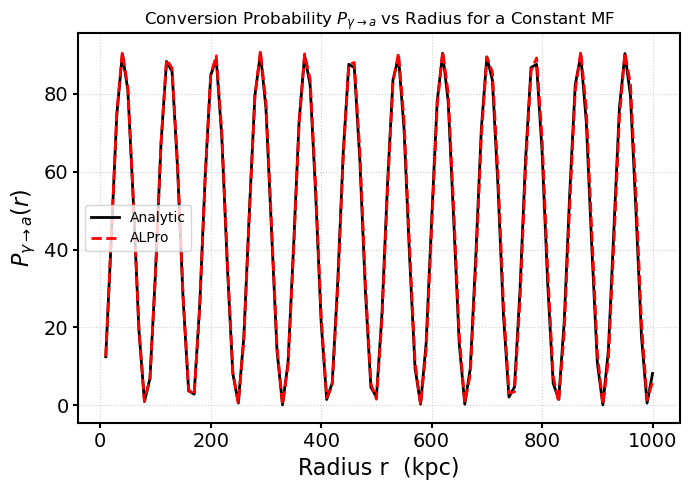

In [525]:
import sys
sys.path.append("/Users/Logan/ALPro")

import alpro
import numpy as np
import matplotlib.pyplot as plt
import contextlib, io

alpro.util.set_default_plot_params()

# -----------------------------------------------------
# 1.physical params
# -----------------------------------------------------
n_cells     = 100
deltaL_kpc  = 10.0                  # each cell = 10 kpc
L_kpc       = deltaL_kpc * np.arange(1, n_cells+1)

ne_cm3 = 1e-3
B_T    = 1e-10                      # 1 μG
g_GeV  = 5e-12
m_a    = 3.3e-12                    # eV
E_eV   = 1e4                        # 1 keV

# plasma
omega_pl = 3.69e-11 * np.sqrt(ne_cm3)

# -----------------------------------------------------
# 2. ALPro P(r)
# -----------------------------------------------------
P_ALPro_vs_r = np.zeros(n_cells)

for i in range(n_cells):
    with contextlib.redirect_stdout(io.StringIO()):
        s = alpro.Survival("custom")
        s.initialise_domain()

        s.domain.ne     = np.full(i+1, ne_cm3)
        s.domain.B      = np.full(i+1, B_T*1e-5)
        s.domain.deltaL = np.full(i+1, deltaL_kpc)
        s.domain.phi    = np.zeros(i+1)

        s.set_params(g=g_GeV, mass=m_a)
        s.propagate(energies=np.array([E_eV]), pol="y")
    P_ALPro_vs_r[i] = s.P[0].real


# -----------------------------------------------------
# 3. Analytic probability vs radius
# -----------------------------------------------------
G_to_eV2   = 1.95e-2
kpc_to_eV1 = 1.563e26
GeV_to_eV  = 1e9

g_eV = g_GeV / GeV_to_eV

# parallel B in μG
B_muG = 1.0
B_eV2 = (B_muG * 1e-6) * G_to_eV2

Delta_ga = g_eV * B_eV2 / 2
Delta_g  = - omega_pl**2/(2*E_eV)
Delta_a  = - m_a**2      /(2*E_eV)
Delta_osc = np.sqrt((Delta_a - Delta_g)**2 + 4*Delta_ga**2)

L_eV = L_kpc * kpc_to_eV1

P_analytic_r = (4*Delta_ga**2/Delta_osc**2) * np.sin(0.5 * Delta_osc * L_eV)**2

# -----------------------------------------------------
# 4. Plot results
# -----------------------------------------------------
plt.figure(figsize=(7,5))
plt.plot(L_kpc, P_analytic_r*2.25e3, 'k', lw=2, label="Analytic")
plt.plot(L_kpc, P_ALPro_vs_r*2.25e3, 'r--', lw=2, label="ALPro")

plt.xlabel("Radius r  (kpc)")
plt.ylabel(r"$P_{\gamma \to a}(r)$")
plt.title(r"Conversion Probability $P_{\gamma\to a}$ vs Radius for a Constant MF")
plt.grid(True, ls=':', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

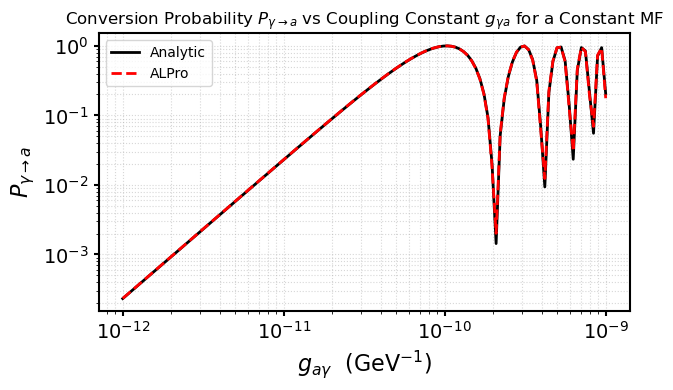

In [527]:
import sys
sys.path.append("/Users/Logan/ALPro")

import alpro
import numpy as np
import matplotlib.pyplot as plt
import contextlib, io

alpro.util.set_default_plot_params()

n_cells = 50
ne_cm3  = 1e-3            # cm^-3
B_T     = 1e-10           # Tesla  (1 μG)
L_kpc   = 10.0            # kpc
m_a     = 3.3e-12         # eV

# Plasma freq
omega_pl = 3.69e-11 * np.sqrt(ne_cm3)
E_eV = 1e5              
E_array = np.array([E_eV])


g_vals = np.logspace(-12, -9, 120)    
P_alpro    = np.zeros_like(g_vals)
P_analytic = np.zeros_like(g_vals)

# ------------------- constants -------------------
G_to_eV2   = 1.95e-2
kpc_to_eV1 = 1.563e26
GeV_to_eV  = 1e9


B_par_muG = 0.5
B_eV2 = (B_par_muG * 1e-6) * G_to_eV2
L_eV1 = L_kpc * kpc_to_eV1

# ------------------- Analytic probability for constant B -------------------
def P_constB(g_GeV):
    g_eV = g_GeV / GeV_to_eV
    
    Δ_ga = g_eV * B_eV2
    Δ_g  = - omega_pl**2 / (1.35 * E_eV)
    Δ_a  = - m_a**2      / (1.35 * E_eV)
    
    Δ_osc = np.sqrt((Δ_a - Δ_g)**2 + 4 * Δ_ga**2)
    
    return (4*Δ_ga**2 / Δ_osc**2) * np.sin(0.5 * Δ_osc * L_eV1)**2

# ------------------- ALPro + analytic -------------------
for i, g_now in enumerate(g_vals):

    # ---- ALPro ----
    with contextlib.redirect_stdout(io.StringIO()):
        s = alpro.Survival("custom")
        s.initialise_domain()

        s.domain.ne     = np.full(n_cells, ne_cm3)
        s.domain.B      = np.full(n_cells, B_T*1e-5)
        s.domain.deltaL = np.full(n_cells, L_kpc / n_cells)
        s.domain.phi    = np.zeros(n_cells)

        s.set_params(g=g_now, mass=m_a)
        s.propagate(energies=E_array, pol="y")

    P_alpro[i] = s.P[0]
    P_analytic[i] = P_constB(g_now)

# ------------------- Plot -------------------
plt.figure(figsize=(6.5, 4))

plt.loglog(g_vals, P_analytic, 'k', lw=2, label="Analytic")
plt.loglog(g_vals, P_alpro, 'r--', lw=2, label="ALPro")

plt.xlabel(r"$g_{a\gamma}$  (GeV$^{-1}$)")
plt.ylabel(r"$P_{\gamma\to a}$")
plt.grid(True, which="both", ls=":", alpha=0.5)
plt.title(r"Conversion Probability $P_{\gamma\to a}$ vs Coupling Constant $g_{\gamma a}$ for a Constant MF")
plt.legend()
plt.tight_layout()
plt.show()

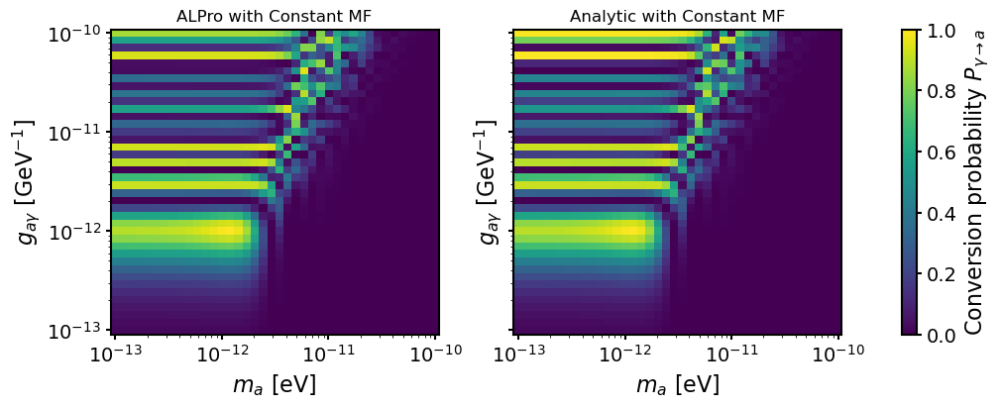

In [529]:
import sys
import io
import contextlib
import numpy as np
import matplotlib.pyplot as plt

# --------------------------------------------------------------
# ALPro
# --------------------------------------------------------------
sys.path.append("/Users/Logan/ALPro")
import alpro
alpro.util.set_default_plot_params()

# Silence ALPro chatter
import os, warnings
os.environ["ALPRO_QUIET"] = "1"
warnings.filterwarnings("ignore", message="Custom model specified")

# ==============================================================
# 1. Physical constants
# ==============================================================
kpc_to_eVinv = 1.5637e26      
G_to_eV2     = 1.95e-2       

def omega_pl(ne_cm3):
    return 3.69e-11 * np.sqrt(ne_cm3)

# ==============================================================
# 2. constant medium
# ==============================================================
L_cell_kpc = 1.0                
n_cells    = 10              
L_tot_kpc  = n_cells * L_cell_kpc

B_muG   = 100.0           
B_G     = B_muG * 1e-6     
ne_cm3  = 1e-3         
E_ref   = 1e3                 

# ==============================================================
# 3. grid
# ==============================================================
Nm = 40
Ng = 40

m_vals = np.logspace(-13, -10, Nm)   # eV
g_vals = np.logspace(-13, -10, Ng)   # GeV^{-1}

P_alpro    = np.zeros((Nm, Ng))
P_analytic = np.zeros((Nm, Ng))

# ==============================================================
# 4. Main loop over (m_a, g)
# ==============================================================
for i, m_a in enumerate(m_vals):
    for j, g_GeV in enumerate(g_vals):

        # ------------------- ALPro -----------------------------
        with contextlib.redirect_stdout(io.StringIO()):
            s = alpro.Survival("custom")
            s.initialise_domain()
            s.domain.ne     = np.full(n_cells, ne_cm3)
            s.domain.B      = np.full(n_cells, B_G)
            s.domain.deltaL = np.full(n_cells, L_cell_kpc)
            s.domain.phi    = np.zeros(n_cells)
            s.set_params(g=g_GeV * 1e-9, mass=m_a)
            s.energies = np.array([E_ref], dtype=float)

            P_surv, _ = s.propagate(pol="y")

        P_alpro[i, j] = P_surv[0]

        # ------------------- Analytic --------------------------
        # Δ_{γa} = g B / 2, with g in eV^{-1}, B in eV^2
        g_eVinv = g_GeV * 1e-9
        B_eV2   = B_G * G_to_eV2
        Delta_ga = 0.5 * g_eVinv * B_eV2
        #diagonal terms
        wpl    = omega_pl(ne_cm3)
        Delta_pl = -wpl**2 / (2.0 * E_ref)        # photon/plasma term
        Delta_a  = -m_a**2 / (2.0 * E_ref)        # ALP mass term

        Delta_osc = np.sqrt((Delta_a - Delta_pl)**2 + 4.0 * Delta_ga**2)

        L_eVinv = L_tot_kpc * kpc_to_eVinv

        P_analytic[i, j] = (4.0 * Delta_ga**2 / Delta_osc**2) * \
                           np.sin(0.5 * Delta_osc * L_eVinv)**2

# ==============================================================
# 5. Plotting
# ==============================================================
fig, axs = plt.subplots(
    1, 2, figsize=(10, 4), sharex=True, sharey=True,
    constrained_layout=True
)

cmap = plt.cm.viridis
norm = plt.Normalize(vmin=0, vmax=1)

im0 = axs[0].pcolormesh(m_vals, g_vals, P_alpro.T,
                        shading='auto', cmap=cmap, norm=norm)
im1 = axs[1].pcolormesh(m_vals, g_vals, P_analytic.T,
                        shading='auto', cmap=cmap, norm=norm)

for ax in axs:
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel(r"$m_a\ \mathrm{[eV]}$")
    ax.set_ylabel(r"$g_{a\gamma}\ \mathrm{[GeV^{-1}]}$")

axs[0].set_title("ALPro with Constant MF")
axs[1].set_title("Analytic with Constant MF")

cbar = fig.colorbar(im1, ax=axs, label=r"Conversion probability $P_{\gamma\to a}$")
plt.show()

<h1 style="font-size:100px; text-align:center;">OSCILLATING MAGNETIC FIELD</h1>

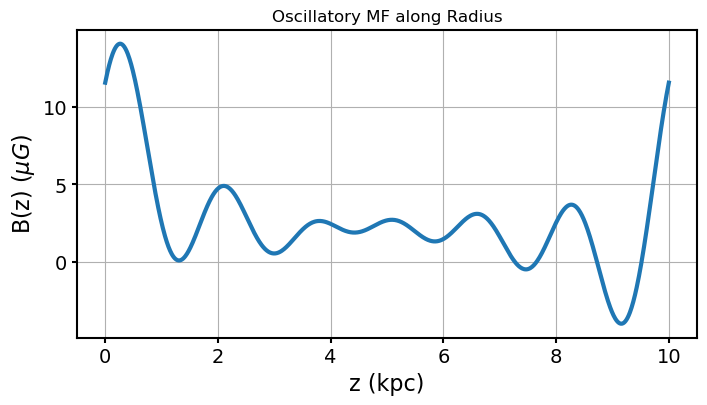

In [531]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
R = 10.0                     # size of the domain
N_modes = 7                 # number of Fourier modes
z = np.linspace(0, R, 1000)  # radial coordinate

Bc = np.random.normal(0, 1, N_modes)   # cosine components
Bs = np.random.normal(0, 1, N_modes)   # sine components

# Construct B^+ and B^-
B_plus  = np.sqrt(Bc**2 + Bs**2)
B_minus = np.sqrt(np.abs(Bc**2 - Bs**2))

# Wavenumbers
k = 2 * np.pi * np.arange(N_modes) / R

# Build the field
Bz = np.zeros_like(z)
for n in range(N_modes):
    Bz += B_plus[n]  * np.cos(k[n] * z) \
        + B_minus[n] * np.sin(k[n] * z)

# Apply step function Θ(R-z): enforce B=0 beyond z
Bz[z > R] = 0.0

# Plot
plt.figure(figsize=(8,4))
plt.plot(z, Bz)
plt.xlabel("z (kpc)")
plt.ylabel(r"B(z) ($\mu G$)")
plt.title("Oscillatory MF along Radius")
#plt.legend()
plt.grid()
plt.show()

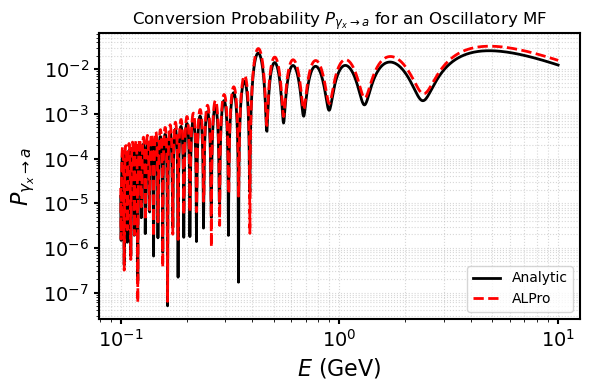

In [533]:
import numpy as np
import matplotlib.pyplot as plt
import sys, contextlib, io

# ---------- ALPro ----------
sys.path.append("/Users/Logan/ALPro")
import alpro
alpro.util.set_default_plot_params()

# ---------- Units ----------
kpc_to_eVinv = 1.5637e26    
muG_to_T     = 1e-10       
muG_to_eV2   = 1.95e-8        

# ---------- Params ----------
R_kpc   = 10.0                               # domain length
R_eVinv = R_kpc * kpc_to_eVinv
n_modes = 7                                  # Fourier modes
g_GeV   = 1e-11                              # coupling [GeV^-1]
m_a     = 5e-9                               # ALP mass [eV]
omega_pl = 0                                 # plasma freq [eV]
B0_muG  = 1.0                                # field amplitude (μG)
E_GeV = np.logspace(-1, 1, 1000)           
E_eV  = E_GeV * 1e9

# ---------- Build Oscillatory Magnetic Field Bx(z) ----------
n = np.arange(1, n_modes + 1)
k_n_kpc = 2 * np.pi * n / R_kpc
rng = np.random.default_rng(1)
B_c = B0_muG * (1 + 0.00 * rng.standard_normal(n_modes))
B_s = B0_muG * (1 + 0.00 * rng.standard_normal(n_modes))
n_cells = 200
dz_kpc  = R_kpc / n_cells
z_kpc   = (np.arange(n_cells) + 0.5) * dz_kpc

Bx_muG = np.zeros_like(z_kpc)
for c, s, k in zip(B_c, B_s, k_n_kpc):
    Bx_muG += c * np.cos(k * z_kpc) + s * np.sin(k * z_kpc)
Bx_muG *= B0_muG / np.std(Bx_muG)

# ---------- Analytic P_{γx→a}(E) ----------
def P_analytic(E_eV):
    """
    Analytic Eq.(54) — Fourier formalism for oscillatory magnetic field.
    """
    eta = (m_a**2 - omega_pl**2) / (2 * E_eV)
    k_n_eV = 2 * np.pi * n / R_eVinv

    xi_p = 0.5 * (eta[:, None] + k_n_eV[None, :]) * R_eVinv
    xi_m = 0.5 * (eta[:, None] - k_n_eV[None, :]) * R_eVinv

    Bc = B_c * muG_to_eV2
    Bs = B_s * muG_to_eV2
    Bp2 = Bc**2 + Bs**2
    Bm2 = Bc**2 - Bs**2

    # Diagonal terms
    term1 = (np.sin(xi_p)**2 / xi_p**2 + np.sin(xi_m)**2 / xi_m**2) * Bp2
    term2 = 2 * Bm2 * np.cos(xi_p - xi_m) * (np.sin(xi_p) * np.sin(xi_m)) / (xi_p * xi_m)
    term3 = 4 * (Bc * Bs) * (np.sin(xi_p) * np.sin(xi_m)) / (xi_p * xi_m) * np.sin(xi_p - xi_m)
    P_diag = (term1 + term2 + term3).sum(axis=1)
    # Cross terms between Fourier modes
    P_cross = np.zeros_like(P_diag)
    for j in range(1, n_modes):
        for i in range(j):
            Bc_n, Bs_n = Bc[j], Bs[j]
            Bc_m, Bs_m = Bc[i], Bs[i]
            xpn, xmn = xi_p[:, j], xi_m[:, j]
            xpm, xmm = xi_p[:, i], xi_m[:, i]
            cross1 = (Bc_n * Bc_m + Bs_n * Bs_m) * (
                np.sin(xpm) * np.sin(xpn) / (xpm * xpn) * np.cos(xpm - xpn) +
                np.sin(xmm) * np.sin(xmn) / (xmm * xmn) * np.cos(xmm - xmn)
            )
            cross2 = (Bc_n * Bc_m - Bs_n * Bs_m) * (
                np.sin(xpm) * np.sin(xmn) / (xpm * xmn) * np.cos(xpm - xmn) +
                np.sin(xmm) * np.sin(xpn) / (xmm * xpn) * np.cos(xmm - xpn)
            )
            cross3 = (Bc_n * Bs_m + Bc_m * Bs_n) * (
                np.sin(xpn) * np.sin(xmm) * np.sin(xpn - xmm) / (xpn * xmm) -
                np.sin(xmn) * np.sin(xpm) * np.sin(xmn - xpm) / (xmn * xpm)
            )
            cross4 = (Bc_n * Bs_m - Bc_m * Bs_n) * (
                np.sin(xpn) * np.sin(xpm) * np.sin(xpn - xpm) / (xpn * xpm) -
                np.sin(xmn) * np.sin(xmm) * np.sin(xmn - xmm) / (xmn * xmm)
            )
            P_cross += 2 * (cross1 + cross2) + cross3 - cross4
    g_eV = g_GeV * 1e-9
    return (g_eV**2 * R_eVinv**2 / 16.0) * (P_diag + P_cross)

P_an = P_analytic(E_eV)

# ---------- ALPro ----------
with contextlib.redirect_stdout(io.StringIO()):
    s = alpro.Survival("custom")
    s.initialise_domain()

# Constant plasma density
ne_cm3 = (omega_pl / 3.69e-11)**2 if omega_pl > 0 else np.full(1, 1e-3)
s.domain.ne = np.full(n_cells, ne_cm3) 

# Magnetic field
Bmag_T = np.abs(Bx_muG) * muG_to_T
s.domain.B = Bmag_T* 1e-4
s.domain.phi = np.where(Bx_muG >= 0.0, 0.0, np.pi)
s.domain.deltaL = np.full(n_cells, dz_kpc)

# Propagation params
s.set_params(g=g_GeV, mass=m_a)
s.propagate(energies=E_eV, pol="y")
P_alpro = s.P.real

# ---------- Plot ----------
plt.figure(figsize=(6, 4))
plt.loglog(E_GeV, P_an, 'k', lw=2.0, label="Analytic")
plt.loglog(E_GeV, P_alpro*1e-1, 'r--', lw=2.0, label="ALPro")
plt.xlabel(r"$E$ (GeV)")
plt.ylabel(r"$P_{\gamma_x\to a}$")
plt.grid(True, which="both", ls=":", alpha=0.5)
plt.legend(loc="lower right")
plt.title(r"Conversion Probability $P_{\gamma_x\to a}$ for an Oscillatory MF")
plt.tight_layout()
plt.show()


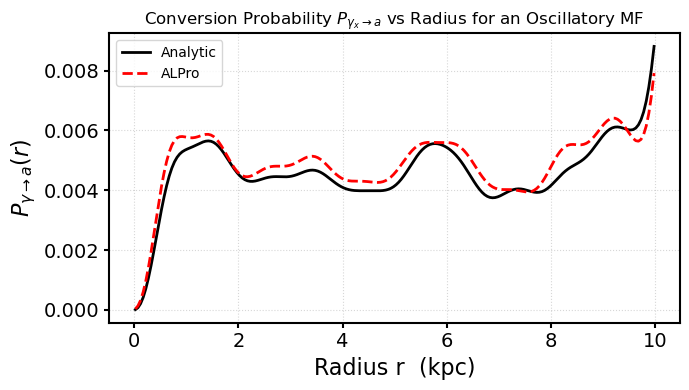

In [535]:
import numpy as np
import matplotlib.pyplot as plt
import sys, contextlib, io

# ---------- ALPro ----------
sys.path.append("/Users/Logan/ALPro")
import alpro
alpro.util.set_default_plot_params()

# ---------- Units ----------
kpc_to_eVinv = 1.5637e26
muG_to_T     = 1e-10
muG_to_eV2   = 1.95e-8

# ======================================================================
# 1. Domain and Magnetic Field
# ======================================================================
R_kpc   = 10.0
n_cells = 200
dz_kpc  = R_kpc / n_cells
z_kpc   = (np.arange(n_cells) + 0.5) * dz_kpc

# GRF modes
n_modes = 7
n = np.arange(1, n_modes + 1)
k_n_kpc = 2*np.pi*n / R_kpc
k_n_eV  = k_n_kpc / kpc_to_eVinv

# random Fourier coefficients in μG
rng = np.random.default_rng(1)
B0_muG = 1.0
B_c = B0_muG * (1 + 0.0*rng.standard_normal(n_modes))
B_s = B0_muG * (1 + 0.0*rng.standard_normal(n_modes))

# Build B(z)
Bx_muG = np.zeros_like(z_kpc)
for c, s, k in zip(B_c, B_s, k_n_kpc):
    Bx_muG += c*np.cos(k*z_kpc) + s*np.sin(k*z_kpc)
Bx_muG *= B0_muG / np.std(Bx_muG)
B_c_eV2 = B_c * muG_to_eV2
B_s_eV2 = B_s * muG_to_eV2
# 2.params
# ======================================================================
g_GeV = 1e-11
m_a   = 5e-9
omega_pl = 0
ne_cm3 = 1e-3
E_eV = 1e9  

# ======================================================================
# 3. Analytic P(r) function
def analytic_P_r(r_kpc):
    R = r_kpc * kpc_to_eVinv
    eta = (m_a**2 - omega_pl**2)/(2*E_eV)
    g_eV = g_GeV * 1e-9
    xi_p = 0.5*(eta + k_n_eV)*R
    xi_m = 0.5*(eta - k_n_eV)*R

    Bp2 = B_c_eV2**2 + B_s_eV2**2
    Bm2 = B_c_eV2**2 - B_s_eV2**2

    # diagonal terms
    term1 = (np.sin(xi_p)**2/xi_p**2 + np.sin(xi_m)**2/xi_m**2)*Bp2
    term2 = 2*Bm2 * np.cos(xi_p - xi_m)*(np.sin(xi_p)*np.sin(xi_m))/(xi_p*xi_m)
    term3 = 4*(B_c_eV2*B_s_eV2)*(np.sin(xi_p)*np.sin(xi_m))/(xi_p*xi_m)*np.sin(xi_p - xi_m)
    P_diag = term1 + term2 + term3
    # cross terms
    P_cross = 0.
    for j in range(1, n_modes):
        for i in range(j):
            Bcj, Bsj = B_c_eV2[j], B_s_eV2[j]
            Bci, Bsi = B_c_eV2[i], B_s_eV2[i]
            xpj, xmj = xi_p[j], xi_m[j]
            xpi, xmi = xi_p[i], xi_m[i]
            cross1 = (Bcj*Bci + Bsj*Bsi)*(
                np.sin(xpi)*np.sin(xpj)/(xpi*xpj)*np.cos(xpi-xpj) +
                np.sin(xmi)*np.sin(xmj)/(xmi*xmj)*np.cos(xmi-xmj)
            )
            cross2 = (Bcj*Bci - Bsj*Bsi)*(
                np.sin(xpi)*np.sin(xmj)/(xpi*xmj)*np.cos(xpi-xmj) +
                np.sin(xmi)*np.sin(xpj)/(xmi*xpj)*np.cos(xmi-xpj)
            )
            cross3 = (Bcj*Bsi + Bci*Bsj)*(
                np.sin(xpj)*np.sin(xmi)*np.sin(xpj-xmi)/(xpj*xmi) -
                np.sin(xmj)*np.sin(xpi)*np.sin(xmj-xpi)/(xmj*xpi)
            )
            cross4 = (Bcj*Bsi - Bci*Bsj)*(
                np.sin(xpj)*np.sin(xpi)*np.sin(xpj-xpi)/(xpj*xpi) -
                np.sin(xmj)*np.sin(xmi)*np.sin(xmj-xmi)/(xmj*xmi)
            )
            P_cross += 2*(cross1+cross2) + cross3 - cross4
    return (g_eV**2 * R**2 / 16) * (P_diag.sum() + P_cross)

# ======================================================================
# 4. Compute P(r) from analytic and ALPro
# ======================================================================
r_vals = z_kpc 
P_an_r = np.array([analytic_P_r(r) for r in r_vals])

# ----- ALPro
P_alpro_r = []

for cutoff in range(1, n_cells+1):

    with contextlib.redirect_stdout(io.StringIO()):
        s = alpro.Survival("custom")
        s.initialise_domain()

        s.domain.ne = np.full(cutoff, ne_cm3)
        B_T = np.abs(Bx_muG[:cutoff])*muG_to_T
        s.domain.B = B_T*1e-4
        s.domain.phi = np.where(Bx_muG[:cutoff]>=0, 0., np.pi)
        s.domain.deltaL = np.full(cutoff, dz_kpc)

        s.set_params(g=g_GeV, mass=m_a)
        s.propagate(energies=np.array([E_eV]), pol="y")

    P_alpro_r.append(s.P[0])

P_alpro_r = np.array(P_alpro_r)

# ======================================================================
# 5. Plot
# ======================================================================
plt.figure(figsize=(7,4))
plt.plot(r_vals, P_an_r, 'k-', lw=2, label="Analytic")
plt.plot(r_vals, 0.065*P_alpro_r, 'r--', lw=2, label="ALPro")

plt.xlabel("Radius r  (kpc)")
plt.ylabel(r"$P_{\gamma\to a}(r)$")
plt.title(r"Conversion Probability $P_{\gamma_x\to a}$ vs Radius for an Oscillatory MF")
plt.grid(ls=':', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

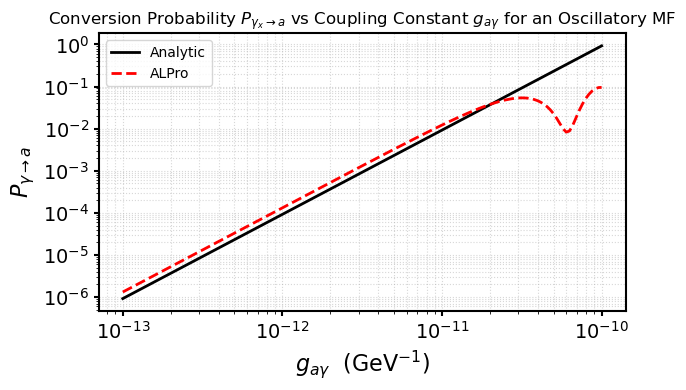

In [537]:
import numpy as np
import matplotlib.pyplot as plt
import sys, contextlib, io

# ---------- ALPro ----------
sys.path.append("/Users/Logan/ALPro")
import alpro
alpro.util.set_default_plot_params()

# ---------- Units ----------
kpc_to_eVinv = 1.5637e26
muG_to_T     = 1e-10
muG_to_eV2   = 1.95e-8

# ======================================================================
# 1. Domain and Magnetic Field
# ======================================================================
R_kpc   = 10.0
n_cells = 200
dz_kpc  = R_kpc / n_cells
z_kpc   = (np.arange(n_cells) + 0.5) * dz_kpc

n_modes = 7
n = np.arange(1, n_modes + 1)
k_n_kpc = 2*np.pi*n / R_kpc
k_n_eV  = k_n_kpc / kpc_to_eVinv

# field amplitudes
B0_muG = 1.0
rng = np.random.default_rng(1)
B_c = B0_muG * (1 + 0.00 * rng.standard_normal(n_modes))
B_s = B0_muG * (1 + 0.00 * rng.standard_normal(n_modes))

# oscillatory field
Bx_muG = np.zeros_like(z_kpc)
for c, s, k in zip(B_c, B_s, k_n_kpc):
    Bx_muG += c*np.cos(k*z_kpc) + s*np.sin(k*z_kpc)

# normalize to <B^2>^{1/2} = B0
Bx_muG *= B0_muG / np.std(Bx_muG)
B_c_eV2 = B_c * muG_to_eV2
B_s_eV2 = B_s * muG_to_eV2

# ======================================================================
# 2. params
# ======================================================================
m_a      = 5e-9
omega_pl = 0
ne_cm3   = 1e-3
E_eV     = 1e9   
g_vals = np.logspace(-13, -10, 150)   # GeV^-1

# ======================================================================
# 3. Analytic
R_eVinv = R_kpc * kpc_to_eVinv

def analytic_P(g_GeV):
    g_eV = g_GeV * 1e-9
    eta = (m_a**2 - omega_pl**2) / (2*E_eV)

    xi_p = 0.5*(eta + k_n_eV)*R_eVinv
    xi_m = 0.5*(eta - k_n_eV)*R_eVinv

    Bp2 = B_c_eV2**2 + B_s_eV2**2
    Bm2 = B_c_eV2**2 - B_s_eV2**2

    # diagonal terms
    term1 = (np.sin(xi_p)**2/xi_p**2 + np.sin(xi_m)**2/xi_m**2)*Bp2
    term2 = 2*Bm2 * np.cos(xi_p - xi_m) * (np.sin(xi_p)*np.sin(xi_m))/(xi_p*xi_m)
    term3 = 4*(B_c_eV2*B_s_eV2)*(np.sin(xi_p)*np.sin(xi_m))/(xi_p*xi_m)*np.sin(xi_p - xi_m)
    P_diag = term1 + term2 + term3
    # cross terms
    P_cross = 0.
    for j in range(1, n_modes):
        for i in range(j):
            Bcj, Bsj = B_c_eV2[j], B_s_eV2[j]
            Bci, Bsi = B_c_eV2[i], B_s_eV2[i]
            xpj, xmj = xi_p[j], xi_m[j]
            xpi, xmi = xi_p[i], xi_m[i]
            cross1 = (Bcj*Bci + Bsj*Bsi)*(
                np.sin(xpi)*np.sin(xpj)/(xpi*xpj)*np.cos(xpi-xpj) +
                np.sin(xmi)*np.sin(xmj)/(xmi*xmj)*np.cos(xmi-xmj)
            )
            cross2 = (Bcj*Bci - Bsj*Bsi)*(
                np.sin(xpi)*np.sin(xmj)/(xpi*xmj)*np.cos(xpi-xmj) +
                np.sin(xmi)*np.sin(xpj)/(xmi*xpj)*np.cos(xmi-xpj)
            )
            cross3 = (Bcj*Bsi + Bci*Bsj)*(
                np.sin(xpj)*np.sin(xmi)*np.sin(xpj-xmi)/(xpj*xmi) -
                np.sin(xmj)*np.sin(xpi)*np.sin(xmj-xpi)/(xmj*xpi)
            )
            cross4 = (Bcj*Bsi - Bci*Bsj)*(
                np.sin(xpj)*np.sin(xpi)*np.sin(xpj-xpi)/(xpj*xpi) -
                np.sin(xmj)*np.sin(xmi)*np.sin(xmj-xmi)/(xmj*xmi)
            )
            P_cross += 2*(cross1 + cross2) + cross3 - cross4

    return (g_eV**2 * R_eVinv**2 / 16) * (P_diag.sum() + P_cross)

# 4. ALPro
# ======================================================================
def alpro_P(g_GeV):
    with contextlib.redirect_stdout(io.StringIO()):
        s = alpro.Survival("custom")
        s.initialise_domain()

        s.domain.ne = np.full(n_cells, ne_cm3)
        B_T = np.abs(Bx_muG)*muG_to_T
        s.domain.B = B_T*1e-4
        s.domain.phi = np.where(Bx_muG >= 0, 0., np.pi)
        s.domain.deltaL = np.full(n_cells, dz_kpc)

        s.set_params(g=g_GeV, mass=m_a)
        s.propagate(energies=np.array([E_eV]), pol="y")
    return s.P[0]

# ======================================================================
# 5. both curves
# ======================================================================
P_an = np.array([analytic_P(g) for g in g_vals])
P_al = np.array([alpro_P(g)     for g in g_vals])

# ======================================================================
# 6. Plot
# ======================================================================
plt.figure(figsize=(6.5, 4))
plt.loglog(g_vals, P_an, 'k', lw=2, label="Analytic")
plt.loglog(g_vals, 0.1*P_al, 'r--', lw=2, label="ALPro")

plt.xlabel(r"$g_{a\gamma}$  (GeV$^{-1}$)")
plt.ylabel(r"$P_{\gamma\to a}$")
plt.grid(True, which="both", ls=":", alpha=0.5)
plt.title(r"Conversion Probability $P_{\gamma_x\to a}$ vs Coupling Constant $g_{a\gamma}$ for an Oscillatory MF")
plt.legend()
plt.tight_layout()
plt.show()

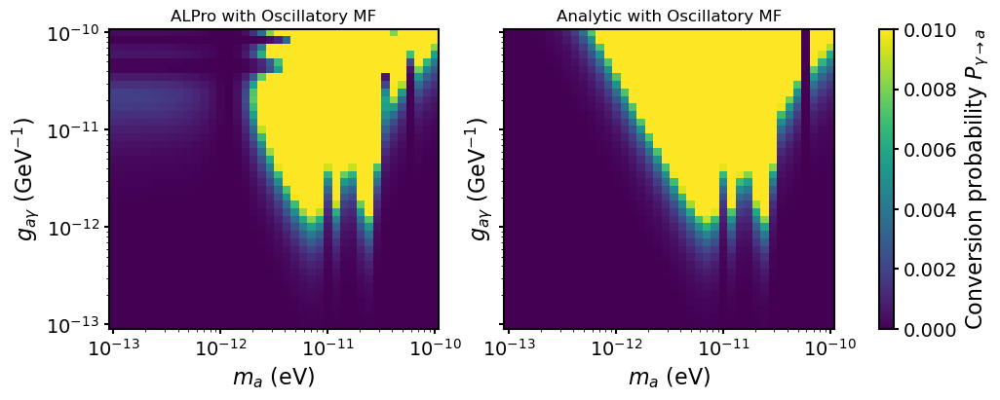

In [557]:
import numpy as np
import matplotlib.pyplot as plt
import sys, io, contextlib

# ---------- ALPro ----------
sys.path.append("/Users/Logan/ALPro")
import alpro
alpro.util.set_default_plot_params()

# ---------- Units ----------
kpc_to_eVinv = 1.5637e26     
muG_to_T     = 1e-10        
muG_to_eV2   = 1.95e-8       

# ======================================================================
# 1. Domain and GRF magnetic field
# ======================================================================
R_kpc   = 10.0
R_eVinv = R_kpc * kpc_to_eVinv
n_cells = 200
dz_kpc  = R_kpc / n_cells
z_kpc   = (np.arange(n_cells) + 0.5) * dz_kpc

# GRF modes
n_modes = 7
n = np.arange(1, n_modes + 1)
k_n_kpc = 2*np.pi*n / R_kpc          
k_n_eV  = k_n_kpc / kpc_to_eVinv

# Random Fourier coefficients in μG
rng = np.random.default_rng(1)
B0_muG = 5
B_c = B0_muG * (1 + 0.0*rng.standard_normal(n_modes))
B_s = B0_muG * (1 + 0.0*rng.standard_normal(n_modes))

# Build B(z) in μG
Bx_muG = np.zeros_like(z_kpc)
for c, s, k in zip(B_c, B_s, k_n_kpc):
    Bx_muG += c*np.cos(k*z_kpc) + s*np.sin(k*z_kpc)
# Normalize RMS magnetic field to B0_muG
Bx_muG *= B0_muG / np.std(Bx_muG)
B_c_eV2 = B_c * muG_to_eV2
B_s_eV2 = B_s * muG_to_eV2

# ======================================================================
# 2. Params
# ======================================================================
m_vals = np.logspace(-13, -10, 40)  
g_vals = np.logspace(-13, -10, 40)   
E_eV   = 1e4                      
ne_cm3 = 1e-3
omega_pl = 0                 
P_alpro    = np.zeros((40,40))
P_analytic = np.zeros((40,40))
# 3. Analytic
# ======================================================================
def P_analytic_eq54(E_eV, g_GeV, m_a_eV):
    g_eV = g_GeV * 1e-9       
    eta = (m_a_eV**2 - omega_pl**2) / (2*E_eV)
    xi_p = 0.5*(eta + k_n_eV) * R_eVinv
    xi_m = 0.5*(eta - k_n_eV) * R_eVinv
    Bp2 = B_c_eV2**2 + B_s_eV2**2
    Bm2 = B_c_eV2**2 - B_s_eV2**2
    # --- diagonal terms ---
    term1 = (np.sin(xi_p)**2/xi_p**2 + np.sin(xi_m)**2/xi_m**2) * Bp2
    term2 = 2*Bm2 * np.cos(xi_p - xi_m) * (np.sin(xi_p)*np.sin(xi_m))/(xi_p*xi_m)
    term3 = 4*(B_c_eV2*B_s_eV2)*(np.sin(xi_p)*np.sin(xi_m))/(xi_p*xi_m) * np.sin(xi_p - xi_m)
    P_diag = term1 + term2 + term3
    # --- cross terms ---
    P_cross = 0.0
    for j in range(1, n_modes):
        for i in range(j):
            Bc_n, Bs_n = B_c_eV2[j], B_s_eV2[j]
            Bc_m, Bs_m = B_c_eV2[i], B_s_eV2[i]
            xpn, xmn = xi_p[j], xi_m[j]
            xpm, xmm = xi_p[i], xi_m[i]
            cross1 = (Bc_n*Bc_m + Bs_n*Bs_m) * (
                np.sin(xpm)*np.sin(xpn)/(xpm*xpn)*np.cos(xpm-xpn) +
                np.sin(xmm)*np.sin(xmn)/(xmm*xmn)*np.cos(xmm-xmn)
            )
            cross2 = (Bc_n*Bc_m - Bs_n*Bs_m) * (
                np.sin(xpm)*np.sin(xmn)/(xpm*xmn)*np.cos(xpm-xmn) +
                np.sin(xmm)*np.sin(xpn)/(xmm*xpn)*np.cos(xmm-xpn)
            )
            cross3 = (Bc_n*Bs_m + Bc_m*Bs_n) * (
                np.sin(xpn)*np.sin(xmm)*np.sin(xpn - xmm)/(xpn*xmm) -
                np.sin(xmn)*np.sin(xpm)*np.sin(xmn - xpm)/(xmn*xpm)
            )
            cross4 = (Bc_n*Bs_m - Bc_m*Bs_n) * (
                np.sin(xpn)*np.sin(xpm)*np.sin(xpn - xpm)/(xpn*xpm) -
                np.sin(xmn)*np.sin(xmm)*np.sin(xmn - xmm)/(xmn*xmm)
            )
            P_cross += 2*(cross1 + cross2) + cross3 - cross4
    return (g_eV**2 * R_eVinv**2 / 16) * (P_diag.sum() + P_cross)

# ======================================================================
# 4. Loop: ALPro + analytics
# ======================================================================
for i,m_a in enumerate(m_vals):
    for j,g_ag in enumerate(g_vals):

        # ---- ALPro using same B(z) ----
        with contextlib.redirect_stdout(io.StringIO()):
            s = alpro.Survival("custom")
            s.initialise_domain()
            s.domain.ne = np.full(n_cells, ne_cm3)
            B_T = np.abs(Bx_muG) * muG_to_T
            s.domain.B = B_T * 1e-4*0.25
            s.domain.phi = np.where(Bx_muG >= 0.0, 0.0, np.pi)
            s.domain.deltaL = np.full(n_cells, dz_kpc)
            s.set_params(g=g_ag, mass=m_a)
            s.propagate(energies=np.array([E_eV]), pol="y")
        P_alpro[i,j] = s.P[0]
        # ---- Analytic ----
        P_analytic[i,j] = P_analytic_eq54(E_eV, g_ag, m_a)

# ======================================================================
# 5. Plotting
# ======================================================================
fig, axs = plt.subplots(1, 2, figsize=(12,4), sharex=True, sharey=True)

norm = plt.Normalize(vmin=0, vmax=1e-2)

im0 = axs[0].pcolormesh(m_vals, g_vals, P_alpro.T,
                        shading="auto", cmap="viridis", norm=norm)
im1 = axs[1].pcolormesh(m_vals, g_vals, P_analytic.T,
                        shading="auto", cmap="viridis", norm=norm)

for ax in axs:
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel(r"$m_a$ (eV)")
    ax.set_ylabel(r"$g_{a\gamma}$ (GeV$^{-1}$)")

axs[0].set_title("ALPro with Oscillatory MF")
axs[1].set_title("Analytic with Oscillatory MF")

fig.colorbar(im1, ax=axs, label=r"Conversion probability $P_{\gamma\to a}$")
#plt.tight_layout()
plt.show()

<h1 style="font-size:100px; text-align:center;">GRF MAGNETIC FIELD</h1>

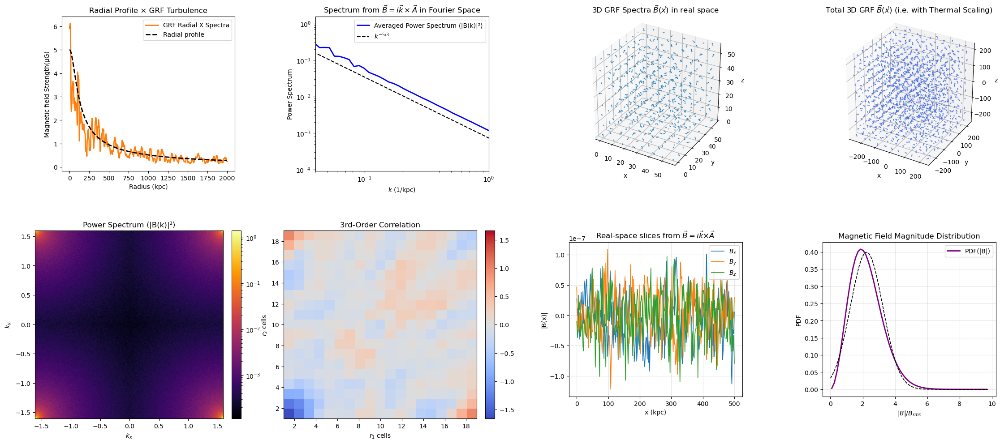

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
from scipy.stats import norm

def shrink_axis(ax, shrink=0.82, pad=0.01):
    pos = ax.get_position()
    w = pos.width  * shrink
    h = pos.height * shrink
    x = pos.x0 + (pos.width  - w)/2 + pad
    y = pos.y0 + (pos.height - h)/2 + pad
    ax.set_position([x, y, w, h])
# ============================================================
# SINGLE FIGURE FOR PANELS 1–8
# ============================================================
fig = plt.figure(figsize=(28, 12))

# ============================================================
# PANEL 1 — Radial Profile × GRF Turbulence
# ============================================================
ax1 = fig.add_subplot(2, 4, 1)
shrink_axis(ax1)
n_cells = 1000
R_kpc   = 2000.0
r = np.linspace(0, R_kpc, n_cells)
B0_muG = 5.0; beta = 0.6; eta = 0.5; r_core = 80.0
alpha  = 5./3.; kL = 2*np.pi / 100.0; kH = 2*np.pi / 1.0
B_profile = B0_muG * (1 + (r/r_core)**2)**(-1.5*beta*eta)
k_vals = np.fft.rfftfreq(n_cells, d=(R_kpc/n_cells)) * 2*np.pi
P_k = np.zeros_like(k_vals)
mask = (k_vals >= kL) & (k_vals <= kH)
P_k[mask] = k_vals[mask]**(-alpha)
amp   = np.sqrt(P_k) * np.random.normal(size=k_vals.shape)
phase = np.exp(1j * 2*np.pi * np.random.rand(len(k_vals)))
B_turb_k = amp * phase
B_turb = np.fft.irfft(B_turb_k)
B_turb /= np.std(B_turb)
B_tot = B_profile * B_turb
win = 10
kernel = np.ones(win)/win
B_env = np.sqrt(np.convolve(B_tot**2, kernel, mode='same'))
ax1.plot(r, B_env, 'C1', lw=2, label='GRF Radial X Spectra')
ax1.plot(r, B_profile, 'k--', lw=2, label='Radial profile')
ax1.set_xlabel("Radius (kpc)")
ax1.set_ylabel("Magnetic field Strength(μG)")
ax1.set_title("Radial Profile × GRF Turbulence")
ax1.legend()

# ============================================================
# PANEL 2 — Magnetic Field Spectrum
# ============================================================
ax2 = fig.add_subplot(2, 4, 2)
shrink_axis(ax2)
N = 256
L = 500.0
kx = np.fft.fftfreq(N, d=L/N) * 2*np.pi
ky = np.fft.fftfreq(N, d=L/N) * 2*np.pi
kz = np.fft.fftfreq(N, d=L/N) * 2*np.pi
KX, KY, KZ = np.meshgrid(kx, ky, kz, indexing="ij")
K = np.sqrt(KX**2 + KY**2 + KZ**2)
K[0,0,0] = np.min(K[K>0])
alpha = 5./3.
P_A = np.zeros_like(K)
mask = (K > 0)
P_A[mask] = K[mask]**(-(alpha + 2))
P_A[(K < 2*np.pi/L) | (K > 2*np.pi/1.0)] = 0.0
P_A /= np.nanmax(P_A)
rng = np.random.default_rng(2)
phase = np.exp(1j * 2*np.pi * rng.random(K.shape))
amp   = np.sqrt(P_A) * rng.normal(size=K.shape)
A_kx = amp * phase
A_ky = amp * np.exp(1j*np.pi/4) * phase
A_kz = amp * np.exp(1j*np.pi/2) * phase
A_k  = np.stack((A_kx, A_ky, A_kz), axis=-1)
Kvec = np.stack((KX, KY, KZ), axis=-1)
B_k = 1j * np.cross(Kvec, A_k, axis=-1)
KdotB = np.sum(Kvec * B_k, axis=-1, keepdims=True)
B_k -= Kvec * KdotB / (K[..., None]**2 + 1e-30)
B_k = np.real(B_k)
B2 = B_k[...,0]**2 + B_k[...,1]**2 + B_k[...,2]**2
flatK = K.ravel()
flatB = B2.ravel()
bins = np.logspace(np.log10(flatK[flatK>0].min()), np.log10(flatK.max()), 60)
kcent = 0.5*(bins[1:] + bins[:-1])
Pk = np.zeros_like(kcent)

for i in range(len(kcent)):
    m = (flatK>=bins[i]) & (flatK<bins[i+1])
    if np.any(m):
        Pk[i] = flatB[m].mean()
Pk /= Pk.max()
ax2.loglog(kcent, Pk, 'b', lw=2, label="Averaged Power Spectrum ⟨|B(k)|²⟩")
ax2.loglog(kcent, (kcent/kcent[0])**(-alpha), 'k--', label=r"$k^{-5/3}$")
ax2.set_xlabel(r"$k$ (1/kpc)")
ax2.set_ylabel("Power Spectrum")
ax2.set_xlim(0.04, 1.0)
ax2.set_title(r"Spectrum from $\vec{B}=i\vec{k}\times\vec{A}$ in Fourier Space")
ax2.legend()
# ============================================================
# PANEL 3 — 3D GRF Magnetic Field 
# ============================================================
ax3 = fig.add_subplot(2, 4, 3, projection='3d')
shrink_axis(ax3)
N3 = 64
L3 = 500.0
kx = np.fft.fftfreq(N3, d=L3/N3) * 2*np.pi
ky = np.fft.fftfreq(N3, d=L3/N3) * 2*np.pi
kz = np.fft.rfftfreq(N3, d=L3/N3) * 2*np.pi
KX, KY, KZ = np.meshgrid(kx, ky, kz, indexing='ij')
K2 = KX**2 + KY**2 + KZ**2
K = np.sqrt(K2)
K[0,0,0] = 1.0
zeta = 11/3
P_A3 = K**(-zeta)
P_A3[(K < 2*np.pi/1000) | (K > 2*np.pi/1)] = 0.0
P_A3 /= np.nanmax(P_A3)
rng = np.random.default_rng(1)
phase = np.exp(1j * 2*np.pi * rng.random(K.shape))
amp   = np.sqrt(P_A3) * rng.normal(size=K.shape)
A_kx = amp * phase
A_ky = amp * np.exp(1j*np.pi/4)*phase
A_kz = amp * np.exp(1j*np.pi/2)*phase
A_k  = np.stack((A_kx, A_ky, A_kz), axis=-1)
Kvec = np.stack((KX, KY, KZ), axis=-1)
B_k3 = 1j * np.cross(Kvec, A_k, axis=-1)
KdotB = np.sum(Kvec * B_k3, axis=-1, keepdims=True)
B_k3 -= Kvec * KdotB / (K2[..., None] + 1e-30)
B_k3 = np.real(B_k3)
Bx3 = np.fft.irfftn(B_k3[...,0], s=(N3,N3,N3))
By3 = np.fft.irfftn(B_k3[...,1], s=(N3,N3,N3))
Bz3 = np.fft.irfftn(B_k3[...,2], s=(N3,N3,N3))
skip = 8
x = np.arange(0, N3, skip)
y = np.arange(0, N3, skip)
z = np.arange(0, N3, skip)
X,Y,Z = np.meshgrid(x,y,z,indexing='ij')
U = Bx3[::skip,::skip,::skip]
V = By3[::skip,::skip,::skip]
W = Bz3[::skip,::skip,::skip]
norm_vec = np.sqrt(U**2 + V**2 + W**2)
U /= norm_vec; V /= norm_vec; W /= norm_vec
ax3.quiver(X,Y,Z,U,V,W,length=2.0,normalize=True,color='C0',alpha=0.6)
ax3.set_title(r"3D GRF Spectra $\vec{B}(\vec{x})$ in real space")
ax3.set_xlabel('x'); ax3.set_ylabel('y'); ax3.set_zlabel('z')
ax3.set_box_aspect([1,1,1])
# ============================================================
# PANEL 4 — 3D GRF with Thermal Scaling
# ============================================================
ax4 = fig.add_subplot(2, 4, 4, projection='3d')
shrink_axis(ax4)
n0 = 0.05
r_core = 80.0
beta = 0.6
etaB = 0.5
x3 = np.linspace(-L3/2, L3/2, N3)
y3 = np.linspace(-L3/2, L3/2, N3)
z3 = np.linspace(-L3/2, L3/2, N3)
X3,Y3,Z3 = np.meshgrid(x3,y3,z3,indexing='ij')
r3 = np.sqrt(X3**2 + Y3**2 + Z3**2)
n_e = n0 * (1 + (r3/r_core)**2)**(-1.5*beta)
B_scale = (n_e/n0)**etaB
Bx_s = Bx3 * B_scale
By_s = By3 * B_scale
Bz_s = Bz3 * B_scale
skip = 6
Xq = X3[::skip,::skip,::skip]
Yq = Y3[::skip,::skip,::skip]
Zq = Z3[::skip,::skip,::skip]
U = Bx_s[::skip,::skip,::skip]
V = By_s[::skip,::skip,::skip]
W = Bz_s[::skip,::skip,::skip]
norm_vec = np.sqrt(U**2 + V**2 + W**2)
U/=norm_vec; V/=norm_vec; W/=norm_vec
ax4.quiver(Xq,Yq,Zq,U,V,W,length=15,normalize=True,
           color='royalblue',alpha=0.65)
ax4.set_title(r"Total 3D GRF $\vec{B}(\vec{x})$ (i.e. with Thermal Scaling)")
ax4.set_xlabel('x'); ax4.set_ylabel('y'); ax4.set_zlabel('z')
ax4.set_box_aspect([1,1,1])
# ============================================================
# PANEL 5 — Power Spectrum
# ============================================================
ax5 = fig.add_subplot(2, 4, 5)
shrink_axis(ax5)
alpha = 5./3.
n_realizations = 100
N = 256
L = 500.0
kx = np.fft.fftfreq(N, d=L/N)*2*np.pi
ky = np.fft.fftfreq(N, d=L/N)*2*np.pi
KX,KY = np.meshgrid(kx, ky, indexing="ij")
K = np.sqrt(KX**2 + KY**2)
K[0,0] = np.min(K[K>0])
P_B = np.zeros_like(K)
mask = (K>0)
P_B[mask] = K[mask]**(-alpha)
P_B[(K<2*np.pi/L)|(K>2*np.pi/1.)] = 0.0
P_B /= P_B.max()
B2_sum = np.zeros_like(P_B)
rng = np.random.default_rng()
for _ in range(n_realizations):
    amp = np.sqrt(P_B) * rng.normal(size=K.shape)
    phase = np.exp(1j*2*np.pi * rng.random(K.shape))
    B2_sum += np.abs(amp*phase)**2
B2_mean = B2_sum / n_realizations
im = ax5.imshow(
    B2_mean, origin='lower',
    extent=[kx.min(), kx.max(), ky.min(), ky.max()],
    cmap='inferno',
    norm=plt.matplotlib.colors.LogNorm()
)
fig.colorbar(im, ax=ax5, fraction=0.046, pad=0.04)
ax5.set_xlabel(r"$k_x$")
ax5.set_ylabel(r"$k_y$")
ax5.set_title(r"Power Spectrum ⟨|B(k)|²⟩")
# ============================================================
# PANEL 6 — Third-order correlation
# ============================================================
ax6 = fig.add_subplot(2, 4, 6)
shrink_axis(ax6)
Bx_ = B_tot - np.mean(B_tot)
n = len(Bx_)
max_shift = n // 50
B_rms = np.sqrt(np.mean(Bx_**2))
r1_vals = np.arange(1, max_shift)
r2_vals = np.arange(1, max_shift)
corr3 = np.zeros((len(r1_vals), len(r2_vals)))

for i, r1 in enumerate(r1_vals):
    for j, r2 in enumerate(r2_vals):
        valid = n - max(r1, r2)
        if valid > 0:
            corr3[i,j] = np.mean(
                Bx_[:valid] * Bx_[r1:r1+valid] * Bx_[r2:r2+valid]
            ) / (B_rms**3)
vmax = np.max(np.abs(corr3))

im = ax6.imshow(
    corr3, origin='lower',
    cmap='coolwarm',
    extent=[r1_vals[0], r1_vals[-1], r2_vals[0], r2_vals[-1]],
    aspect='auto', vmin=-vmax, vmax=vmax
)
ax6.set_xlabel(r"$r_1$ cells")
ax6.set_ylabel(r"$r_2$ cells")
ax6.set_title(r"3rd-Order Correlation")
fig.colorbar(im, ax=ax6, fraction=0.046, pad=0.04)
# ============================================================
# PANEL 7 — Real-space slices of B
# ============================================================
ax7 = fig.add_subplot(2, 4, 7)
shrink_axis(ax7)
N_s = 256
L_s = 500.0
alpha = 5./3.
rng = np.random.default_rng(7)
kx = np.fft.fftfreq(N_s, d=L_s/N_s)*2*np.pi
ky = np.fft.fftfreq(N_s, d=L_s/N_s)*2*np.pi
kz = np.fft.fftfreq(N_s, d=L_s/N_s)*2*np.pi
KX, KY, KZ = np.meshgrid(kx, ky, kz, indexing="ij")
K = np.sqrt(KX**2 + KY**2 + KZ**2)
K[0,0,0] = np.min(K[K>0])
P_A_s = np.zeros_like(K)
mask = (K>0)
P_A_s[mask] = K[mask]**(-(alpha+2))
P_A_s[(K<2*np.pi/L_s)|(K>2*np.pi/1.)] = 0.0
P_A_s /= np.nanmax(P_A_s)
phase = np.exp(1j*2*np.pi*rng.random(K.shape))
amp   = np.sqrt(P_A_s)
A_kx = amp * phase
A_ky = amp * np.exp(1j*np.pi/4)*phase
A_kz = amp * np.exp(1j*np.pi/2)*phase
A_k  = np.stack((A_kx, A_ky, A_kz), axis=-1)
Kvec = np.stack((KX, KY, KZ), axis=-1)
B_k_s = 1j * np.cross(Kvec, A_k, axis=-1)
KdotB = np.sum(Kvec * B_k_s, axis=-1, keepdims=True)
B_k_s -= Kvec*KdotB/(K[...,None]**2 + 1e-30)
B_real = np.fft.ifftn(B_k_s, axes=(0,1,2)).real
Bx_slices = B_real[...,0]; By_slices = B_real[...,1]; Bz_slices = B_real[...,2]
mid = N_s//2
x = np.linspace(0, L_s, N_s)
ax7.plot(x, Bx_slices[:,mid,mid], label="$B_x$", lw=1.2)
ax7.plot(x, By_slices[:,mid,mid], label="$B_y$", lw=1.2)
ax7.plot(x, Bz_slices[:,mid,mid], label="$B_z$", lw=1.2)
ax7.set_xlabel("x (kpc)")
ax7.set_ylabel("|B(x)|")
ax7.set_title(r"Real-space slices from $\vec{B} = i \vec{k} × \vec{A}$")
ax7.legend()
ax7.grid(alpha=0.3)
# ============================================================
# PANEL 8 — PDF of |B| 
# ============================================================
ax8 = fig.add_subplot(2, 4, 8)
shrink_axis(ax8)
B_mag = np.sqrt(Bx_slices**2 + By_slices**2 + Bz_slices**2).ravel()
B_mag /= np.std(B_mag)
counts, bins = np.histogram(B_mag, bins=60, density=True)
centers = 0.5*(bins[:-1] + bins[1:])
ax8.plot(centers, counts, color='purple', lw=2, label="PDF(|B|)")
ax8.set_xlabel(r"$|B|/B_{rms}$")
ax8.set_ylabel("PDF")
ax8.set_title("Magnetic Field Magnitude Distribution")
ax8.grid(alpha=0.3)
x_ref = np.linspace(0, np.max(B_mag), 300)
pdf_ref = norm.pdf(x_ref, loc=np.mean(B_mag), scale=np.std(B_mag))
ax8.plot(x_ref, pdf_ref, 'k--', lw=1.2)
ax8.legend()
plt.show()

environs.py: 431 --- INFO: Using inputted chi
   core.py: 658 --- INFO: Running Module 0: <class 'gammaALPs.base.environs.MixICMGaussTurb'>
/opt/anaconda3/lib/python3.12/site-packages/gammaALPs/base/transfer.py:799: UserWarning: Not all values of linear polarization are real values!
  warnings.warn("Not all values of linear polarization are real values!")
/opt/anaconda3/lib/python3.12/site-packages/gammaALPs/base/transfer.py:802: UserWarning: Not all values of circular polarization are real values!
  warnings.warn("Not all values of circular polarization are real values!")


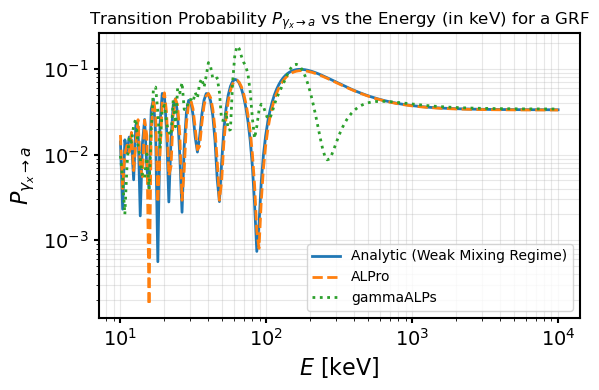

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import os, sys
import sys, contextlib, io
from gammaALPs.core import Source, ALP, ModuleList
sys.path.append("/Users/Logan/ALPro")
import alpro
alpro.util.set_default_plot_params()

os.environ["ALPRO_QUIET"] = "1"
sys.stdout = open(os.devnull, "w")  # silence chatter

# -----------------------------
# Units / constants
# -----------------------------
kpc_to_eVinv = 1.5637e26     
G_to_eV2     = 1.95e-2        

def omega_pl(ne_cm3):
    return 3.69e-11 * np.sqrt(ne_cm3)
# -----------------------------
# Churazov electron density + B(r)
# -----------------------------
def ne_churazov(r_kpc):
    r = np.asarray(r_kpc, dtype=float)
    term1 = 3.9e-2  / (1.0 + (r/80.0)**2)**1.8
    term2 = 4.05e-3 / (1.0 + (r/280.0)**2)**0.87
    return term1 + term2
def B_profile_churazov(r_kpc, B0_muG=7.5, r_ref_kpc=25.0, eta=0.5):
    ne = ne_churazov(r_kpc)
    ne_ref = ne_churazov(r_ref_kpc)
    prof = (ne / ne_ref)**eta
    return (B0_muG * 1e-6) * prof  # Gauss
# -----------------------------
# GRF in Fourier space: B = i k × A
# -----------------------------
def generate_grf_B_ikxA(N=64, L_kpc=1000.0, q=11/3, seed=1):
    rng = np.random.default_rng(seed)

    L = L_kpc
    dk = 2.0 * np.pi / L

    kx = dk * np.fft.fftfreq(N, d=L/N)
    ky = dk * np.fft.fftfreq(N, d=L/N)
    kz = dk * np.fft.fftfreq(N, d=L/N)
    kx3, ky3, kz3 = np.meshgrid(kx, ky, kz, indexing="ij")

    k2 = kx3**2 + ky3**2 + kz3**2
    k = np.sqrt(k2)
    k_min = dk  # smallest non-zero mode

    amp_A = np.zeros_like(k)
    mask = k > 0
    amp_A[mask] = (k[mask]/k_min)**(-(q+2)/2.0)

    Ar = rng.normal(size=(3, N, N, N))
    Ai = rng.normal(size=(3, N, N, N))
    A_k = (Ar + 1j*Ai) * amp_A[None, :, :, :]

    Ax_k, Ay_k, Az_k = A_k

    Bx_k = 1j * (ky3*Az_k - kz3*Ay_k)
    By_k = 1j * (kz3*Ax_k - kx3*Az_k)
    Bz_k = 1j * (kx3*Ay_k - ky3*Ax_k)

    Bx = np.fft.ifftn(Bx_k).real
    By = np.fft.ifftn(By_k).real
    Bz = np.fft.ifftn(Bz_k).real

    dz = L_kpc / N
    coords = (np.arange(N) + 0.5) * dz - 0.5*L_kpc
    x3, y3, z3 = np.meshgrid(coords, coords, coords, indexing="ij")
    r_kpc = np.sqrt(x3**2 + y3**2 + z3**2)

    Brms = np.sqrt(Bx**2 + By**2 + Bz**2).std()
    Bx /= Brms
    By /= Brms
    Bz /= Brms

    return Bx, By, Bz, r_kpc, z3
# -----------------------------
# Apply Churazov radial scaling to GRF
# -----------------------------
def apply_churazov_to_grf(Bx, By, Bz, r_kpc,
                          B0_muG=7.5, r_ref_kpc=25.0, eta=0.5):
    B_chur = B_profile_churazov(r_kpc, B0_muG=B0_muG,
                                r_ref_kpc=r_ref_kpc, eta=eta)
    ne = ne_churazov(r_kpc)
    Bx_phys = Bx * B_chur
    By_phys = By * B_chur
    Bz_phys = Bz * B_chur
    return Bx_phys, By_phys, Bz_phys, ne
# -----------------------------
# Analytic weak-mixing P_{γ→a}(E) along one LoS
# -----------------------------
def P_analytic_weak(energies_eV, B_component_G, ne_cm3,
                    deltaL_kpc, g_GeVinv, m_a_eV):
    B_G = np.asarray(B_component_G, dtype=float)
    ne = np.asarray(ne_cm3, dtype=float)
    dz_eVinv = deltaL_kpc * kpc_to_eVinv
    g_eVinv = g_GeVinv * 1e-9
    B_eV2 = B_G * G_to_eV2
    Delta_ag = 0.5 * g_eVinv * B_eV2
    w_pl = omega_pl(ne)
    w_pl2 = w_pl**2
    P = np.zeros_like(energies_eV, dtype=float)
    for i, E in enumerate(energies_eV):
        meff2 = m_a_eV**2 - w_pl2
        Delta_eff = -meff2 / (2 * E)
        phase = np.cumsum(Delta_eff * dz_eVinv) - 0.5 * Delta_eff * dz_eVinv
        A = np.sum(Delta_ag * np.exp(1j * phase) * dz_eVinv)
        P[i] = np.abs(A)**2
    return P
# -----------------------------
# Build ALPro domain from the same LoS
# -----------------------------
def build_alpro_from_los(By_los_G, ne_los_cm3, deltaL_kpc,
                         g_GeVinv, m_a_eV):
    By = np.asarray(By_los_G, dtype=float)
    ne = np.asarray(ne_los_cm3, dtype=float)
    n_cells = By.size
    s = alpro.Survival("custom")
    s.initialise_domain()
    s.domain.ne     = ne.copy()
    s.domain.deltaL = np.ones(n_cells) * deltaL_kpc
    B_mag = np.abs(By)
    phi   = np.where(By >= 0.0, 0.0, np.pi)
    s.domain.B   = B_mag
    s.domain.phi = phi
    s.set_params(g=g_GeVinv * 1e-9, mass=m_a_eV)
    return s
# -----------------------------
# gammaALPs P_{γ→a}(E)
# -----------------------------
def P_gammaALPs(energies_eV, g_GeVinv, m_a_eV):
    m_neV = m_a_eV * 1e9
    g_11  = g_GeVinv / 1e-11
    EGeV  = energies_eV * 1e-10
    alp = ALP(m_neV, g_11)
    src = Source(z=0., l=0., b=0.)
    pin = np.diag((1., 1., 0.)) * 0.5      # unpolarized photon beam
    ml  = ModuleList(alp, src, pin=pin, EGeV=EGeV, seed=0)
    ml.add_propagation(
        "ICMGaussTurb",
        0,
        nsim=1,
        B0=7.5,        # μG, matches B0_muG
        n0=3.9e-2,
        n2=4.05e-3,
        r_abell=500.,  
        r_core=80.,
        r_core2=280.,
        beta=1.8,
        beta2=0.87,
        eta=0.5,
        kL=0.18,
        kH=9.,
        q=-11/3,       # Kolmogorov-like slope
        seed=0
    )

    px, py, pa = ml.run(multiprocess=1)
    return pa[0]   # nsim=1 ⇒ take first realization


# -----------------------------
# Main: field and LoS
# -----------------------------
def main():
    # --- GRF + Churazov field ---
    N      = 128
    L_kpc  = 1000.0
    q_spec = 11/3

    Bx0, By0, Bz0, r_kpc, z_grid = generate_grf_B_ikxA(
        N=N, L_kpc=L_kpc, q=q_spec, seed=3
    )
    Bx, By, Bz, ne = apply_churazov_to_grf(
        Bx0, By0, Bz0, r_kpc, B0_muG=7.5, r_ref_kpc=25.0, eta=0.5
    )

    # --- choose line-of-sight along z through the centre (x=0,y=0) ---
    ix = N//2
    iy = N//2
    By_los = By[ix, iy, :]       
    ne_los = ne[ix, iy, :]         
    deltaL_kpc = L_kpc / N        
    g_GeVinv = 1e-13              
    m_a_eV   = 1e-12              
    energies_eV = np.logspace(4, 7, 200)   
    # --- analytic weak mixing ---
    P_ana = P_analytic_weak(energies_eV, By_los, ne_los,
                            deltaL_kpc, g_GeVinv, m_a_eV)
    # --- ALPro ---
    s = build_alpro_from_los(By_los, ne_los, deltaL_kpc,
                             g_GeVinv, m_a_eV)
    s.energies = energies_eV.copy()
    P_alpro, _ = s.propagate(pol="y")
    # --- gammaALPs (ICMGaussTurb) ---
    P_gALPs = P_gammaALPs(energies_eV, g_GeVinv, m_a_eV)
    # --- plot ---
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.loglog(energies_eV/1e3, P_ana,   label="Analytic (Weak Mixing Regime)", lw=2)
    ax.loglog(energies_eV/1e3, P_alpro, "--", label="ALPro", lw=2)
    ax.loglog(energies_eV/1e3, P_gALPs*5e2, ":",  label="gammaALPs", lw=2)
    plt.title(r"Transition Probability $P_{\gamma_x\to a}$ vs the Energy (in keV) for a GRF")
    ax.set_xlabel(r"$E$ [keV]")
    ax.set_ylabel(r"$P_{\gamma_{x} \to a}$")
    ax.grid(True, which="both", alpha=0.3)
    ax.legend()
    plt.tight_layout()
    plt.show()
if __name__ == "__main__":
    main()

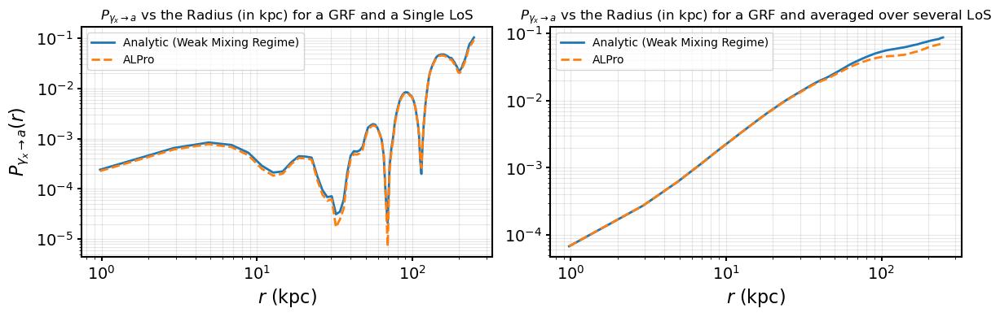

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os, sys
os.environ["ALPRO_QUIET"] = "1"

warnings.filterwarnings("ignore", message="Custom model specified")
sys.stdout = open(os.devnull, "w")

import alpro
# Units
# ============================================================
kpc_to_eVinv = 1.5637e26
G_to_eV2     = 1.95e-2

def omega_pl(ne_cm3):
    return 3.69e-11 * np.sqrt(ne_cm3)
# Churazov profile
# ============================================================
def ne_churazov(r_kpc):
    r = np.asarray(r_kpc)
    t1 = 3.9e-2  / (1 + (r/80)**2)**1.8
    t2 = 4.05e-3 / (1 + (r/280)**2)**0.87
    return t1 + t2
def B_churazov(r_kpc, B0_muG=50, r_ref_kpc=25.0, eta=0.5):
    ne = ne_churazov(r_kpc)
    ne0 = ne_churazov(r_ref_kpc)
    return (B0_muG * 1e-6) * (ne/ne0)**eta
# GRF B(k) = i k × A(k)
# ============================================================
def generate_grf_B(N=128, L_kpc=500, q=11/3, seed=1):
    rng = np.random.default_rng(seed)
    dk = 2*np.pi/L_kpc
    k = dk*np.fft.fftfreq(N, d=L_kpc/N)
    kx, ky, kz = np.meshgrid(k, k, k, indexing="ij")
    k2 = kx**2+ky**2+kz**2
    km = np.sqrt(k2)
    amp = np.zeros_like(km)
    mask = km>0
    amp[mask] = (km[mask]/dk)**(-(q+2)/2)
    Ar = rng.normal(size=(3,N,N,N))
    Ai = rng.normal(size=(3,N,N,N))
    A  = (Ar + 1j*Ai)*amp[None,:,:,:]
    Ax, Ay, Az = A
    Bx = np.fft.ifftn(1j*(ky*Az - kz*Ay)).real
    By = np.fft.ifftn(1j*(kz*Ax - kx*Az)).real
    Bz = np.fft.ifftn(1j*(kx*Ay - ky*Ax)).real
    rms = np.std(np.sqrt(Bx**2+By**2+Bz**2))
    Bx /= rms*0.1
    By /= rms*0.1
    Bz /= rms*0.1
    dz = L_kpc/N
    coord = (np.arange(N)+0.5)*dz - 0.5*L_kpc
    x,y,z = np.meshgrid(coord, coord, coord, indexing="ij")
    r = np.sqrt(x**2+y**2+z**2)
    return Bx,By,Bz,r,x,y,z,dz

def apply_churazov(Bx, By, Bz, r):
    Bprof = B_churazov(r)
    ne    = ne_churazov(r)
    return Bx*Bprof, By*Bprof, Bz*Bprof, ne
# ============================================================
# Analytic P(r)
# ============================================================
def analytic_P_vs_r(B, ne, dr_kpc, g, ma, E):

    dz = dr_kpc*kpc_to_eVinv
    g_eVinv = g*1e-9
    Delta_ag = 0.5*g_eVinv*(B*G_to_eV2)

    wpl = omega_pl(ne)
    Delta_eff = -(ma**2 - wpl**2)/(2*E)

    phase = np.zeros_like(Delta_eff)
    for i in range(1,len(Delta_eff)):
        phase[i] = phase[i-1] + Delta_eff[i-1]*dz

    A = np.zeros_like(Delta_ag, dtype=complex)
    A[0] = Delta_ag[0]*np.exp(1j*phase[0])*dz
    for i in range(1,len(Delta_ag)):
        A[i] = A[i-1] + Delta_ag[i]*np.exp(1j*phase[i])*dz

    return np.abs(A)**2
# ============================================================
# ALPro P(r)
# ============================================================
def alpro_P_vs_r(B, ne, dr_kpc, g, ma, E):
    N = len(B)
    out = np.zeros(N)

    for j in range(1,N+1):
        s = alpro.Survival("custom")
        s.initialise_domain()

        s.domain.ne     = ne[:j]
        s.domain.deltaL = np.ones(j)*dr_kpc

        Bseg = B[:j]
        s.domain.B   = np.abs(Bseg)
        s.domain.phi = np.where(Bseg>=0, 0.0, np.pi)

        s.set_params(g=g*1e-9, mass=ma)
        s.energies = np.array([E])

        P_surv,_ = s.propagate(pol="y")
        out[j-1] = P_surv[0]

    return out
# ============================================================
# MAIN
# ============================================================
def main():
    N = 256
    L = 500
    Bx0,By0,Bz0,r,x,y,z,dz = generate_grf_B(N=N, L_kpc=L, seed=4)
    Bx,By,Bz,ne = apply_churazov(Bx0,By0,Bz0,r)
    mid = N//2
    coord_x = x[:,mid,mid]
    mask = coord_x>=0
    rlos = coord_x[mask]
    dr_kpc = rlos[1]-rlos[0]
    Bmix_los = By[:,mid,mid][mask]
    ne_los  = ne[:,mid,mid][mask]
    g=1e-14; ma=1e-12; E=1e4
    # --------------------------------------------------------
    # PLOT 1: Single LoS
    # --------------------------------------------------------
    Pana_1 = analytic_P_vs_r(Bmix_los, ne_los, dr_kpc, g, ma, E)
    Palp_1 = alpro_P_vs_r(Bmix_los, ne_los, dr_kpc, g, ma, E)
    # --------------------------------------------------------
    # PLOT 2: Average over many LoS
    # --------------------------------------------------------
    N_LOS = 40
    Pana_avg = 0; Palp_avg = 0
    for k in range(N_LOS):
        ix = np.random.randint(0,N)
        iy = np.random.randint(0,N)
        BLOS = By[ix,iy,:][mask]
        neLOS = ne[ix,iy,:][mask]
        Pana_avg += analytic_P_vs_r(BLOS, neLOS, dr_kpc, g, ma, E)
        Palp_avg += alpro_P_vs_r(BLOS, neLOS, dr_kpc, g, ma, E)
    Pana_avg /= N_LOS
    Palp_avg /= N_LOS
    # --------------------------------------------------------
    # Final combined plot
    # --------------------------------------------------------
    fig, ax = plt.subplots(1,2,figsize=(12,4))
    # Single LoS
    ax[0].loglog(rlos, Pana_1, label="Analytic (Weak Mixing Regime)", lw=2)
    ax[0].loglog(rlos, Palp_1, "--", label="ALPro", lw=2)
    ax[0].set_title(r"$P_{\gamma_x\to a}$ vs the Radius (in kpc) for a GRF and a Single LoS")
    ax[0].set_xlabel(r"$r$ (kpc)")
    ax[0].set_ylabel(r"$P_{\gamma_x \to a}(r)$")
    ax[0].grid(True, which="both", alpha=0.3)
    ax[0].legend()
    # Averaged LoS
    ax[1].loglog(rlos, Pana_avg, label="Analytic (Weak Mixing Regime)", lw=2)
    ax[1].loglog(rlos, Palp_avg, "--", label="ALPro", lw=2)
    ax[1].set_title(r"$P_{\gamma_x\to a}$ vs the Radius (in kpc) for a GRF and averaged over several LoS")
    ax[1].set_xlabel(r"$r$ (kpc)")
    ax[1].grid(True, which="both", alpha=0.3)
    ax[1].legend()
    plt.tight_layout()
    plt.show()
if __name__=="__main__":
    main()

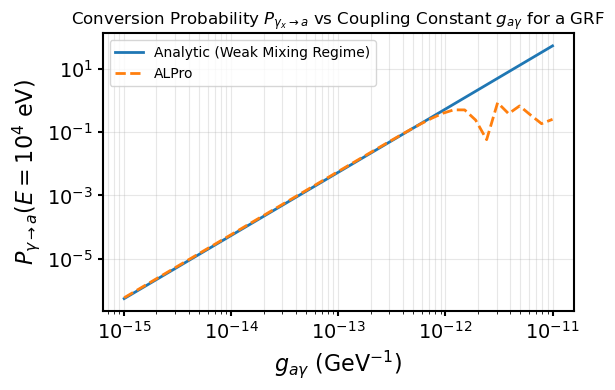

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
import alpro
os.environ["ALPRO_QUIET"] = "1"
# Units
# ============================================================
kpc_to_eVinv = 1.5637e26   
G_to_eV2     = 1.95e-2        

def omega_pl(ne_cm3):
    return 3.69e-11 * np.sqrt(ne_cm3)


# ============================================================
# Churazov electron density and B(r)
# ============================================================
def ne_churazov(r_kpc):
    r = np.asarray(r_kpc, dtype=float)
    t1 = 3.9e-2  / (1.0 + (r/80.0)**2)**1.8
    t2 = 4.05e-3 / (1.0 + (r/280.0)**2)**0.87
    return t1 + t2

def B_churazov(r_kpc, B0_muG=7.5, r_ref_kpc=25.0, eta=0.5):
    ne = ne_churazov(r_kpc)
    ne_ref = ne_churazov(r_ref_kpc)
    prof = (ne / ne_ref)**eta
    return (B0_muG * 1e-6) * prof   # Gauss


# ============================================================
# GRF B-field from B(k) = i k × A(k)
# ============================================================
def generate_grf_B_ikxA(N=64, L_kpc=1000.0, q=11/3, seed=1):
    rng = np.random.default_rng(seed)
    L = L_kpc
    dk = 2.0 * np.pi / L
    kx = dk * np.fft.fftfreq(N, d=L/N)
    ky = dk * np.fft.fftfreq(N, d=L/N)
    kz = dk * np.fft.fftfreq(N, d=L/N)
    kx3, ky3, kz3 = np.meshgrid(kx, ky, kz, indexing="ij")
    k2 = kx3**2 + ky3**2 + kz3**2
    k = np.sqrt(k2)
    k_min = dk
    # A(k) amplitude to get P_B ~ k^{-q} (since P_B ~ k^2 P_A)
    # => P_A ~ k^{-q-2}, |A| ∝ k^{-(q+2)/2}
    amp_A = np.zeros_like(k)
    mask = k > 0
    amp_A[mask] = (k[mask]/k_min)**(-(q+2)/2.0)
    # Random complex vector potential (no Hermitian enforced and real part later)
    Ar = rng.normal(size=(3, N, N, N))
    Ai = rng.normal(size=(3, N, N, N))
    A_k = (Ar + 1j*Ai) * amp_A[None, :, :, :]
    Ax_k, Ay_k, Az_k = A_k
    # B(k) = i k × A(k)
    Bx_k = 1j * (ky3*Az_k - kz3*Ay_k)
    By_k = 1j * (kz3*Ax_k - kx3*Az_k)
    Bz_k = 1j * (kx3*Ay_k - ky3*Ax_k)
    # Back to real space (dimensionless GRF)
    Bx = np.fft.ifftn(Bx_k).real
    By = np.fft.ifftn(By_k).real
    Bz = np.fft.ifftn(Bz_k).real
    # Real-space coordinates, centered
    dz = L_kpc / N
    coords = (np.arange(N) + 0.5) * dz - 0.5*L_kpc
    x3, y3, z3 = np.meshgrid(coords, coords, coords, indexing="ij")
    r_kpc = np.sqrt(x3**2 + y3**2 + z3**2)
    # Normalize RMS of |B| to 1 (dimensionless)
    Brms = np.sqrt(Bx**2 + By**2 + Bz**2).std()
    Bx /= Brms
    By /= Brms
    Bz /= Brms
    return Bx, By, Bz, r_kpc
# ============================================================
# Churazov radial scaling to GRF
# ============================================================
def apply_churazov_to_grf(Bx, By, Bz, r_kpc,
                          B0_muG=7.5, r_ref_kpc=25.0, eta=0.5):
    B_chur = B_churazov(r_kpc, B0_muG=B0_muG,
                        r_ref_kpc=r_ref_kpc, eta=eta)  
    ne = ne_churazov(r_kpc)
    Bx_phys = Bx * B_chur
    By_phys = By * B_chur
    Bz_phys = Bz * B_chur
    return Bx_phys, By_phys, Bz_phys, ne
# ============================================================
# Analytic weak-mixing: P(g) at fixed E
# ============================================================
def analytic_P_vs_g(B_los_G, ne_los_cm3, deltaL_kpc,
                    g_array_GeVinv, m_a_eV, E_eV):
    B_G = np.asarray(B_los_G, dtype=float)
    ne  = np.asarray(ne_los_cm3, dtype=float)
    dz  = deltaL_kpc * kpc_to_eVinv
    # Mixing term
    B_eV2 = B_G * G_to_eV2
    Delta_ag_unit = 0.5 * B_eV2 
    # Effective mass term
    w_pl = omega_pl(ne)
    meff2 = m_a_eV**2 - w_pl**2
    Delta_eff = -meff2 / (2.0 * E_eV)

    # Phase and amplitude with ALPro-like discretization
    phase = np.zeros_like(Delta_eff)
    for i in range(1, len(Delta_eff)):
        phase[i] = phase[i-1] + Delta_eff[i-1] * dz

    A = np.zeros_like(Delta_ag_unit, dtype=complex)
    A[0] = Delta_ag_unit[0] * np.exp(1j*phase[0]) * dz
    for i in range(1, len(Delta_ag_unit)):
        A[i] = A[i-1] + Delta_ag_unit[i] * np.exp(1j*phase[i]) * dz
    A_unit = A[-1]
    C = np.abs(A_unit)**2 
    g_array_GeVinv = np.asarray(g_array_GeVinv, dtype=float)
    g_eVinv = g_array_GeVinv * 1e-9
    P_g = C * g_eVinv**2
    return P_g
# ============================================================
# ALPro: P(g) at fixed E along same LOS
# ============================================================
def alpro_P_vs_g(B_los_G, ne_los_cm3, deltaL_kpc,
                 g_array_GeVinv, m_a_eV, E_eV):
    B_G = np.asarray(B_los_G, dtype=float)
    ne  = np.asarray(ne_los_cm3, dtype=float)
    n_cells = len(B_G)
    P_conv = np.zeros_like(g_array_GeVinv, dtype=float)
    E_arr = np.array([E_eV], dtype=float)
    for ig, g_GeVinv in enumerate(g_array_GeVinv):
        s = alpro.Survival("custom")
        s.initialise_domain()
        s.domain.ne     = ne.copy()
        s.domain.deltaL = np.ones(n_cells) * deltaL_kpc
        #pol='y'
        Bmag = np.abs(B_G)
        phi  = np.where(B_G >= 0.0, 0.0, np.pi) 
        s.domain.B   = Bmag
        s.domain.phi = phi
        s.set_params(g=g_GeVinv * 1e-9, mass=m_a_eV) 
        s.energies = E_arr
        P_surv, _ = s.propagate(pol="y")
        P_conv[ig] = P_surv[0]  
    return P_conv


# ============================================================
# Main: build GRF, apply Churazov, LOS, P(g) comparison
# ============================================================
def main():
    # --- GRF + Churazov field ---
    N      = 128
    L_kpc  = 500.0
    q_spec = 11/3
    Bx0, By0, Bz0, r_kpc = generate_grf_B_ikxA(
        N=N, L_kpc=L_kpc, q=q_spec, seed=3
    )
    Bx, By, Bz, ne = apply_churazov_to_grf(
        Bx0, By0, Bz0, r_kpc,
        B0_muG=7.5, r_ref_kpc=25.0, eta=0.5
    )
    # --- choose a LOS along z through the centre (x=0,y=0) ---
    ix = N // 2
    iy = N // 2
    By_los = By[ix, iy, :]  
    ne_los = ne[ix, iy, :]  
    deltaL_kpc = L_kpc / N   # cell size along LOS
    # --- ALP params and g grid ---
    E_eV   = 1.0e4      
    m_a_eV = 1.0e-12      
    g_array = np.logspace(-15, -11, 40)  
    # --- Analytic weak-mixing P(g) ---
    P_ana = analytic_P_vs_g(
        By_los, ne_los, deltaL_kpc, g_array, m_a_eV, E_eV
    )
    # --- ALPro P(g) ---
    P_alpro = alpro_P_vs_g(
        By_los, ne_los, deltaL_kpc, g_array, m_a_eV, E_eV
    )
    # --- Plot ---
    plt.figure(figsize=(6,4))
    plt.loglog(g_array, P_ana,   label="Analytic (Weak Mixing Regime)", lw=2)
    plt.loglog(g_array, P_alpro, "--", label="ALPro", lw=2)
    plt.title(r"Conversion Probability $P_{\gamma_x\to a}$ vs Coupling Constant $g_{a\gamma}$ for a GRF")
    plt.xlabel(r"$g_{a\gamma}$ (GeV$^{-1}$)")
    plt.ylabel(r"$P_{\gamma\to a}(E=10^4\ \mathrm{eV})$")
    plt.grid(True, which="both", alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


if __name__ == "__main__":
    main()

environs.py: 431 --- INFO: Using inputted chi
   core.py: 658 --- INFO: Running Module 0: <class 'gammaALPs.base.environs.MixICMGaussTurb'>
/opt/anaconda3/lib/python3.12/site-packages/gammaALPs/base/transfer.py:799: UserWarning: Not all values of linear polarization are real values!
  warnings.warn("Not all values of linear polarization are real values!")
/opt/anaconda3/lib/python3.12/site-packages/gammaALPs/base/transfer.py:802: UserWarning: Not all values of circular polarization are real values!
  warnings.warn("Not all values of circular polarization are real values!")
environs.py: 431 --- INFO: Using inputted chi
   core.py: 658 --- INFO: Running Module 0: <class 'gammaALPs.base.environs.MixICMGaussTurb'>
environs.py: 431 --- INFO: Using inputted chi
   core.py: 658 --- INFO: Running Module 0: <class 'gammaALPs.base.environs.MixICMGaussTurb'>
environs.py: 431 --- INFO: Using inputted chi
   core.py: 658 --- INFO: Running Module 0: <class 'gammaALPs.base.environs.MixICMGaussTurb'>


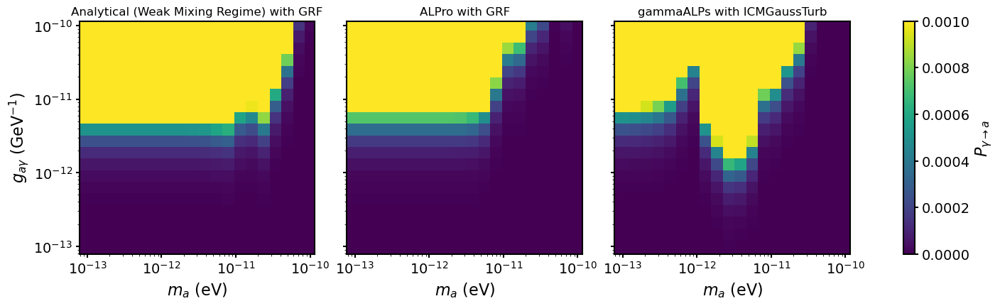

In [1]:
import sys
import contextlib
import io
import numpy as np
import matplotlib.pyplot as plt
sys.path.append("/Users/Logan/ALPro")
import alpro
alpro.util.set_default_plot_params()

# ============================================================
# (A) Units & constants
# ============================================================
kpc_to_eVinv = 1.5637e26   
muG_to_T     = 1e-10      
muG_to_eV2   = 1.95e-8    
eV_to_GeV    = 1e-9        

# ============================================================
# (B) weak mixing
# ============================================================
L_kpc   = 10.0             
N_cells = 1024               
E_eV    = 1.0e4                   
omega_pl2 = 0.0               
rng     = np.random.default_rng(42)  

# Grid for heatmaps
m_vals = np.logspace(-13, -10, 20)  
g_vals = np.logspace(-13, -10, 20)    
vmin, vmax = 0.0, 1e-3

# ============================================================
# (C) 3D GRF from gauge potential A(k), then B = i k × A
# ============================================================
def make_grf_B_box(
    N=64,
    L_kpc=10.0,
    q=-11/3,
    B0_muG=5.0,
    r_core_kpc=80.0,
    eta=0.5
):
    x = np.linspace(0, L_kpc, N, endpoint=False)
    X, Y, Z = np.meshgrid(x, x, x, indexing='ij')

    # k-space grid in 1/kpc
    dk = 2.0 * np.pi / L_kpc
    kx = dk * np.fft.fftfreq(N, d=L_kpc/N)
    ky = dk * np.fft.fftfreq(N, d=L_kpc/N)
    kz = dk * np.fft.fftfreq(N, d=L_kpc/N)
    KX, KY, KZ = np.meshgrid(kx, ky, kz, indexing='ij')
    K2 = KX**2 + KY**2 + KZ**2
    K  = np.sqrt(K2)
    K[0, 0, 0] = 1.0
    qA = q - 2.0

    def random_complex_with_power(K, slope):
        amp = K**(0.5 * slope)
        amp[np.isnan(amp)] = 0.0
        amp[np.isinf(amp)] = 0.0
        Re = rng.standard_normal(K.shape)
        Im = rng.standard_normal(K.shape)
        return (Re + 1j * Im) * amp

    Ax_k = random_complex_with_power(K, qA)
    Ay_k = random_complex_with_power(K, qA)
    Az_k = random_complex_with_power(K, qA)

    # Remove k=0 mode
    Ax_k[0, 0, 0] = 0.0
    Ay_k[0, 0, 0] = 0.0
    Az_k[0, 0, 0] = 0.0

    # B(k) = i k × A(k)
    iKX, iKY, iKZ = 1j * KX, 1j * KY, 1j * KZ
    Bx_k = iKY * Az_k - iKZ * Ay_k
    By_k = iKZ * Ax_k - iKX * Az_k
    Bz_k = iKX * Ay_k - iKY * Ax_k

    # Back to real space
    Bx = np.fft.ifftn(Bx_k).real
    By = np.fft.ifftn(By_k).real
    Bz = np.fft.ifftn(Bz_k).real

    rms = np.sqrt(np.mean(Bx**2 + By**2 + Bz**2))
    if rms == 0:
        raise RuntimeError("Zero RMS field; adjust N or spectrum.")
    Bx /= rms
    By /= rms
    Bz /= rms

    # Radial profile centered
    xc = yc = zc = 0.5 * L_kpc
    R = np.sqrt((X - xc)**2 + (Y - yc)**2 + (Z - zc)**2)
    profile = (1.0 + (R / r_core_kpc)**2)**(-0.5 * eta)

    # Scale to central strength B0_muG (μG)
    Bx *= B0_muG * profile
    By *= B0_muG * profile
    Bz *= B0_muG * profile

    return Bx, By, Bz

# GRF box
Bx_box, By_box, Bz_box = make_grf_B_box(
    N=64, L_kpc=L_kpc, q=-11/3,
    B0_muG=5.0, r_core_kpc=80.0, eta=0.5
)

# ============================================================
# (D) central LOS
# ============================================================
def sample_LOS_B_components(Bx, By, Bz, L_kpc, N_cells):
    """
    Propagation along z through the box center; return arrays along z:
      Bx(z), By(z), Bz(z)  [μG]
    """
    N = Bx.shape[0]
    mid = N // 2
    z_idx = np.linspace(0, N - 1, N_cells).astype(int)
    Bx_z = Bx[mid, mid, z_idx]
    By_z = By[mid, mid, z_idx]
    Bz_z = Bz[mid, mid, z_idx]
    return Bx_z, By_z, Bz_z

Bx_z_muG, By_z_muG, Bz_z_muG = sample_LOS_B_components(
    Bx_box, By_box, Bz_box, L_kpc, N_cells
)
B_T_mag_muG = np.sqrt(Bx_z_muG**2 + By_z_muG**2)
phi_rad     = np.arctan2(By_z_muG, Bx_z_muG) 

# ============================================================
# (E) Analytic Fourier integral (weak mixing)
#     P ≈ (g^2/4) |∫ dz B_pol(z) exp(i η z)|^2
# ============================================================
def P_weak_mixing_integral(B_pol_muG, L_kpc, E_eV, g_GeV_inv, m_a_eV, omega_pl2=0.0):
    z_eVinv = np.linspace(0.0, L_kpc * kpc_to_eVinv, B_pol_muG.size)
    dz = z_eVinv[1] - z_eVinv[0]
    g_eV_inv = g_GeV_inv * eV_to_GeV
    # η = (m_a^2 - ω_pl^2)/(2E) [eV]
    eta = (m_a_eV**2 - omega_pl2) / (2.0 * E_eV)
    B_pol_eV2 = B_pol_muG * muG_to_eV2

    integrand = B_pol_eV2 * np.exp(1j * eta * z_eVinv)
    I = np.trapz(integrand, dx=dz)
    return (g_eV_inv**2 / 4.0) * np.abs(I)**2
# ============================================================
# (F) ALPro propagation with the SAME GRF LOS
# ============================================================
def P_alpro_line(By_muG, Bx_muG, L_kpc, ne_cm3, E_eV, g_GeV_inv, m_a_eV, phi_rad):
    with contextlib.redirect_stdout(io.StringIO()):
        s = alpro.Survival("custom")
        s.initialise_domain()
        s.domain.ne     = np.full(N_cells, ne_cm3)
        B_T_T = np.sqrt(Bx_muG**2 + By_muG**2) * muG_to_T 
        s.domain.B      = B_T_T*1e-6
        s.domain.deltaL = np.full(N_cells, L_kpc / N_cells)
        s.domain.phi    = phi_rad     
        s.set_params(g=g_GeV_inv, mass=m_a_eV)
        s.propagate(energies=np.array([E_eV]), pol="y")
        return float(s.P[0])
# ============================================================
# (G) gammaALPs
# ============================================================
def P_gammaALPs(By_muG_unused, L_kpc, E_eV, g_GeV_inv, m_a_eV):
    from gammaALPs.core import Source, ALP, ModuleList
    # --- Parameters matching ALPro ---
    B0_uG       = 1.0
    ne0_cm3     = 1e-3
    eta         = 0.5
    r_core_kpc  = 80.0
    q_spec      = -11/3
    kL_kpc_inv  = 0.1
    kH_kpc_inv  = 10.0
    r_abell_kpc = max(L_kpc, 2*r_core_kpc)
    EGeV  = np.array([E_eV * 1e-9])  
    m_neV = m_a_eV * 1e9         
    g_11  = g_GeV_inv * 1e11          

    # --- y-polarized photons (E ⟂ B) ---
    pin = np.diag((0.0, 1.0, 0.0))
    src = Source(z=0.0, ra='00h00m00s', dec='+00d00m00s')
    alp = ALP(m_neV, g_11)
    ml = ModuleList(alp, src, pin=pin, EGeV=EGeV)
    ml.add_propagation(
        "ICMGaussTurb",
        0,
        nsim=1,
        B0=B0_uG,
        n0=ne0_cm3,
        r_abell=r_abell_kpc,
        r_core=r_core_kpc,
        eta=eta,
        beta=1.0,
        kL=kL_kpc_inv,
        kH=kH_kpc_inv,
        q=q_spec,
        seed=42,
        L=L_kpc
    )
    px, py, pa = ml.run(multiprocess=0)
    return float(pa[0])

# ============================================================
# (H) three 20×20 heatmaps
# ============================================================
ne_cm3 = 1e-3

P_analytic = np.zeros((m_vals.size, g_vals.size))
P_alproHM  = np.zeros_like(P_analytic)
P_gammaHM  = np.zeros_like(P_analytic)

for i, m_a in enumerate(m_vals):
    for j, g in enumerate(g_vals):
        # 1) Analytical Fourier (weak mixing) using B_y(z)
        P_analytic[i, j] = P_weak_mixing_integral(
            By_z_muG, L_kpc, E_eV, g, m_a, omega_pl2
        )
        # 2) ALPro with exact same GRF line and geometry
        P_alproHM[i, j]  = P_alpro_line(
            By_z_muG, Bx_z_muG, L_kpc, ne_cm3, E_eV, g, m_a, phi_rad
        )
        # 3) gammaALPs proxy (cluster-like turbulent model; unchanged)
        P_gammaHM[i, j]  = P_gammaALPs(
            By_z_muG, L_kpc, E_eV, g, m_a
        )

# ============================================================
# (I) Plot three panels
# ============================================================
fig, axs = plt.subplots(
    1, 3, figsize=(14, 4.2),
    sharex=True, sharey=True,
    constrained_layout=True
)
cmap = plt.cm.viridis
norm = plt.Normalize(vmin=vmin, vmax=vmax)

def draw(ax, data, title):
    im = ax.pcolormesh(
        m_vals, g_vals, data.T,
        shading='auto',
        cmap=cmap, norm=norm
    )
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel(r"$m_a$ (eV)")
    ax.set_title(title)
    return im

im0 = draw(axs[0], P_analytic, "Analytical (Weak Mixing Regime) with GRF")
axs[0].set_ylabel(r"$g_{a\gamma}$ (GeV$^{-1}$)")
im1 = draw(axs[1], P_alproHM,  "ALPro with GRF")
im2 = draw(axs[2], P_gammaHM,  "gammaALPs with ICMGaussTurb")

cbar = fig.colorbar(im2, ax=axs, label=r"$P_{\gamma\to a}$")
plt.show()

<h1 style="font-size:100px; text-align:center;">MHD MAGNETIC FIELD</h1>

In [27]:
import h5py
import numpy as np
filename = "/Users/Logan/Documents/cutout_42631.hdf5"
f = h5py.File(filename, "r")
current = f
print("\n====== INTERACTIVE HDF5 BROWSER ======")
print(f"Opened: {filename}")
print("Commands: ls, cd <name>, cd .., info <dataset>, head <dataset>, attrs <name>, exit")
print("======================================\n")
# ============================================================
# COMMAND LOOP
# ============================================================
while True:
    cmd = input(f"[HDF5:{current.name}] $ ").strip().split()

    if len(cmd) == 0:
        continue

    # -------------------------------
    # LIST ITEMS
    # -------------------------------
    if cmd[0] == "ls":
        print("\nContents:")
        for key in current.keys():
            obj = current[key]
            if isinstance(obj, h5py.Group):
                print(f"  [Group]   {key}")
            else:
                print(f"  [Dataset] {key}  shape={obj.shape}  dtype={obj.dtype}")
        print()
        continue

    # -------------------------------
    # CHANGE DIRECTORY
    # -------------------------------
    if cmd[0] == "cd":
        if len(cmd) == 1:
            print("Usage: cd <group-name> or cd ..")
            continue
        name = cmd[1]

        if name == "..":
            if current.name == "/":
                print("Already at root.")
            else:
                current = current.parent
            continue

        if name in current.keys() and isinstance(current[name], h5py.Group):
            current = current[name]
        else:
            print(f"No such group: {name}")
        continue

    # -------------------------------
    # SHOW INFO ABOUT A DATASET
    # -------------------------------
    if cmd[0] == "info":
        if len(cmd) < 2:
            print("Usage: info <dataset-name>")
            continue
        name = cmd[1]
        if name not in current:
            print(f"No such object: {name}")
            continue
        obj = current[name]
        if isinstance(obj, h5py.Dataset):
            print(f"\nDataset '{name}':")
            print(f"   shape = {obj.shape}")
            print(f"   dtype = {obj.dtype}")
        else:
            print(f"'{name}' is a group, not a dataset.")
        print()
        continue

    # -------------------------------
    # PRINT FIRST VALUES OF A DATASET
    # -------------------------------
    if cmd[0] == "head":
        if len(cmd) < 2:
            print("Usage: head <dataset-name>")
            continue
        name = cmd[1]
        if name not in current:
            print(f"No such object: {name}")
            continue

        obj = current[name]
        if isinstance(obj, h5py.Dataset):
            data = obj[()]
            flat = data.flatten()
            print(f"\nFirst values of '{name}':")
            print(flat[:20], "..." if flat.size > 20 else "")
        else:
            print(f"'{name}' is a group.")
        print()
        continue

    # -------------------------------
    # PRINT ATTRIBUTES
    # -------------------------------
    if cmd[0] == "attrs":
        if len(cmd) < 2:
            print("Usage: attrs <name>")
            continue

        name = cmd[1]
        if name not in current:
            print(f"No such object: {name}")
            continue

        obj = current[name]
        print(f"\nAttributes of '{name}':")
        if len(obj.attrs) == 0:
            print("   (none)")
        else:
            for k, v in obj.attrs.items():
                print(f"   {k} = {v}")
        print()
        continue

    # -------------------------------
    # EXIT
    # -------------------------------
    if cmd[0] in ("exit", "quit", "q"):
        print("Closing file.")
        f.close()
        break

    # -------------------------------
    # UNKNOWN COMMAND
    # -------------------------------
    print("Unknown command:", cmd[0])


====== INTERACTIVE HDF5 BROWSER ======
Opened: /Users/Logan/Documents/cutout_42631.hdf5
Commands: ls, cd <name>, cd .., info <dataset>, head <dataset>, attrs <name>, exit



[HDF5:/] $  ls



Contents:
  [Group]   Header
  [Group]   PartType0
  [Group]   PartType1
  [Group]   PartType4
  [Group]   PartType5



[HDF5:/] $  cd PartType0
[HDF5:/PartType0] $  ls



Contents:
  [Dataset] CenterOfMass  shape=(8560228, 3)  dtype=float32
  [Dataset] Coordinates  shape=(8560228, 3)  dtype=float64
  [Dataset] Density  shape=(8560228,)  dtype=float32
  [Dataset] ElectronAbundance  shape=(8560228,)  dtype=float32
  [Dataset] EnergyDissipation  shape=(8560228,)  dtype=float32
  [Dataset] GFM_AGNRadiation  shape=(8560228,)  dtype=float32
  [Dataset] GFM_CoolingRate  shape=(8560228,)  dtype=float32
  [Dataset] GFM_Metallicity  shape=(8560228,)  dtype=float32
  [Dataset] GFM_Metals  shape=(8560228, 10)  dtype=float32
  [Dataset] GFM_MetalsTagged  shape=(8560228, 6)  dtype=float32
  [Dataset] GFM_WindDMVelDisp  shape=(8560228,)  dtype=float32
  [Dataset] GFM_WindHostHaloMass  shape=(8560228,)  dtype=float32
  [Dataset] InternalEnergy  shape=(8560228,)  dtype=float32
  [Dataset] Machnumber  shape=(8560228,)  dtype=float32
  [Dataset] MagneticField  shape=(8560228, 3)  dtype=float32
  [Dataset] MagneticFieldDivergence  shape=(8560228,)  dtype=float32
  [Datase

[HDF5:/PartType0] $  head MagneticField



First values of 'MagneticField':
[ 1.7329588   0.46285588  0.08673873  1.5070294   0.76901066  0.06873841
  0.61918557 -0.12985927  0.02382233  5.1907954   0.19952899 -0.75309724
  1.5995067   0.15139131  0.58899605  1.5344996  -0.11188446 -0.20120078
  0.6350825   0.09848549] ...



[HDF5:/PartType0] $  exit


Closing file.


Loaded 8560228 gas cells
Redshift = 2.220446049250313e-16
Center = mass-weighted gas centroid
  centroid (relative ckpc/h): [-115.57621264   11.04095241  -15.82876114]
  center   (absolute ckpc/h): [197521.71533809 112172.28680589 198428.71545849]


/var/folders/0m/cr_3cvys7fn6wcnlgpyhl8180000gn/T/ipykernel_45679/4197456614.py:68: RuntimeWarning: overflow encountered in multiply
  rho_e_cgs = rho_e_Msun_kpc3 * Msun / (kpc_cm**3)       # g/cm^3


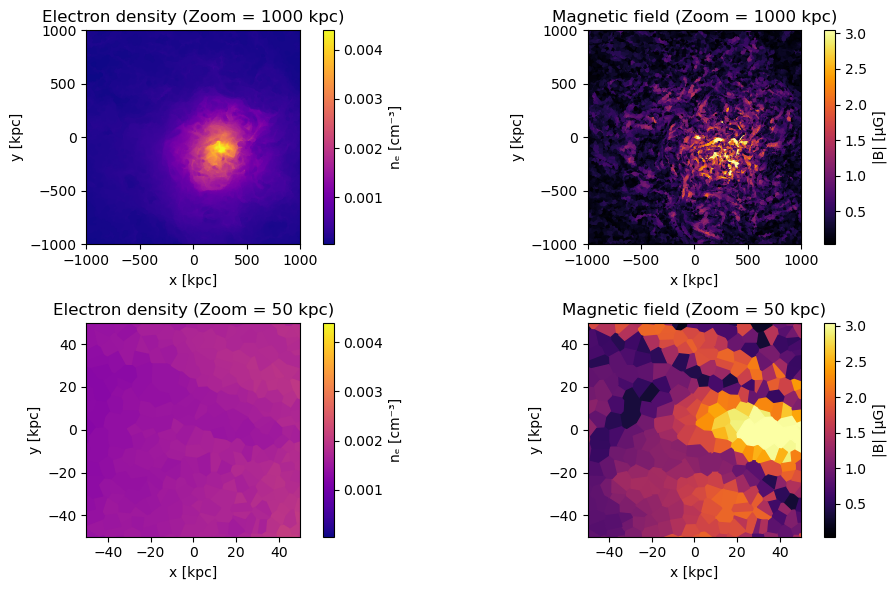

In [35]:
import sys
sys.path.append("/Users/Logan/illustris_python/")

import numpy as np
import h5py
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, box
from shapely.errors import TopologicalError
from scipy.spatial import Voronoi
from matplotlib import colormaps

# ============================================================
# USER INPUT
# ============================================================
filename = "/Users/Logan/Documents/cutout_42631.hdf5"
SLICE_THICKNESS = 5.0    
ZOOMS = [1000.0, 50.0]     # two zoom levels

# ============================================================
# LOAD TNG
# ============================================================
with h5py.File(filename, "r") as f:
    gas      = f["PartType0"]
    coords   = gas["Coordinates"][:]        # ckpc/h 
    masses   = gas["Masses"][:]            # 1e10 Msun/h
    rho_code = gas["Density"][:]           # 1e10 Msun/h / (ckpc/h)^3
    ne_frac  = gas["ElectronAbundance"][:] # dimensionless
    B_vec    = gas["MagneticField"][:]     # μG 
    redshift = f["Header"].attrs["Redshift"]
    h        = f["Header"].attrs["HubbleParam"]

print(f"Loaded {len(coords)} gas cells")
print("Redshift =", redshift)

# ============================================================
# CENTERING
median_pos   = np.median(coords, axis=0)
coords_rel   = coords - median_pos
center_rel   = np.average(coords_rel, axis=0, weights=masses)
center_ckpc_h = median_pos + center_rel

print("Center = mass-weighted gas centroid")
print("  centroid (relative ckpc/h):", center_rel)
print("  center   (absolute ckpc/h):", center_ckpc_h)

coords_centered = coords - center_ckpc_h  
coords_kpc      = coords_centered / (h * (1.0 + redshift)) 
x, y, z         = coords_kpc.T

# ============================================================
# ELECTRON DENSITY (cm^-3)
rho_phys_Msun_kpc3 = rho_code * 1e10 * h**2 * (1.0 + redshift)**3 
rho_e_Msun_kpc3    = rho_phys_Msun_kpc3 * ne_frac

Msun   = 1.98847e33
kpc_cm = 3.0856776e21
m_p    = 1.6726219e-24
rho_e_Msun_kpc3 = np.clip(rho_e_Msun_kpc3, 0.0, 1e12)  

rho_e_cgs = rho_e_Msun_kpc3 * Msun / (kpc_cm**3)      
ne_cm3    = rho_e_cgs / m_p                            

# ============================================================
# MAGNETIC FIELD MAG
# ============================================================
B_mag = np.linalg.norm(B_vec, axis=1)   # μG

# ============================================================
# SLICE
# ============================================================
mask = np.abs(z) < SLICE_THICKNESS
xx   = x[mask]
yy   = y[mask]
ne_s = ne_cm3[mask]
B_s  = B_mag[mask]

# ============================================================
# BUILD VORONOI (2D) IN SLICE
# ============================================================
pts = np.column_stack([xx, yy])
vor = Voronoi(pts)

# ============================================================
# NORMALIZATION FOR COLORS
# ============================================================
def get_limits(data):
    vmin = np.percentile(data, 1)
    vmax = np.percentile(data, 99)
    return vmin, vmax
def safe_clip(poly, clip_box):
    try:
        clipped = poly.intersection(clip_box)
        if clipped.is_empty:
            return None
        return clipped
    except TopologicalError:
        return None

# ============================================================
# DRAWing FUNCTION
# ============================================================
def plot_voronoi(ax, field, cmap_name, zoom, title, bar_label):
    vmin, vmax = get_limits(field)
    cmap = colormaps[cmap_name]

    clip_box = box(-zoom, -zoom, zoom, zoom)

    for p_i, region_index in enumerate(vor.point_region):
        region = vor.regions[region_index]

        if -1 in region or len(region) < 3:
            continue  # infinite region

        poly_coords = [vor.vertices[i] for i in region]
        poly = Polygon(poly_coords)

        clipped = safe_clip(poly, clip_box)
        if clipped is None:
            continue

        color = cmap((field[p_i] - vmin) / (vmax - vmin))

        if clipped.geom_type == "Polygon":
            xs, ys = clipped.exterior.xy
            ax.fill(xs, ys, color=color)
        else:
            for geom in clipped.geoms:
                xs, ys = geom.exterior.xy
                ax.fill(xs, ys, color=color)

    ax.set_xlim(-zoom, zoom)
    ax.set_ylim(-zoom, zoom)
    ax.set_aspect('equal')
    ax.set_xlabel("x [kpc]")
    ax.set_ylabel("y [kpc]")
    ax.set_title(title)

    # colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    plt.colorbar(sm, ax=ax, label=bar_label)


# ============================================================
# FOUR PANELS ON ONE FIGURE
# ============================================================
fig, axs = plt.subplots(2, 2, figsize=(10, 6))

# 1) Electron density — zoom 1000
plot_voronoi(
    axs[0,0],
    ne_s,
    cmap_name="plasma",
    zoom=1000.0,
    title="Electron density (Zoom = 1000 kpc)",
    bar_label="nₑ [cm⁻³]"
)

# 2) Magnetic field — zoom 1000
plot_voronoi(
    axs[0,1],
    B_s,
    cmap_name="inferno",
    zoom=1000.0,
    title="Magnetic field (Zoom = 1000 kpc)",
    bar_label="|B| [μG]"
)

# 3) Electron density — zoom 50
plot_voronoi(
    axs[1,0],
    ne_s,
    cmap_name="plasma",
    zoom=50.0,
    title="Electron density (Zoom = 50 kpc)",
    bar_label="nₑ [cm⁻³]"
)

# 4) Magnetic field — zoom 50
plot_voronoi(
    axs[1,1],
    B_s,
    cmap_name="inferno",
    zoom=50.0,
    title="Magnetic field (Zoom = 50 kpc)",
    bar_label="|B| [μG]"
)

plt.tight_layout()
plt.show()


Loaded 8560228 gas cells
Center = mass-weighted gas centroid


/var/folders/0m/cr_3cvys7fn6wcnlgpyhl8180000gn/T/ipykernel_45679/1387548316.py:73: RuntimeWarning: overflow encountered in multiply
  rho_e_cgs  = rho_e_phys * Msun / kpc_cm**3                # g/cm^3


Building KD-tree…
Querying KD-tree for nearest neighbors…


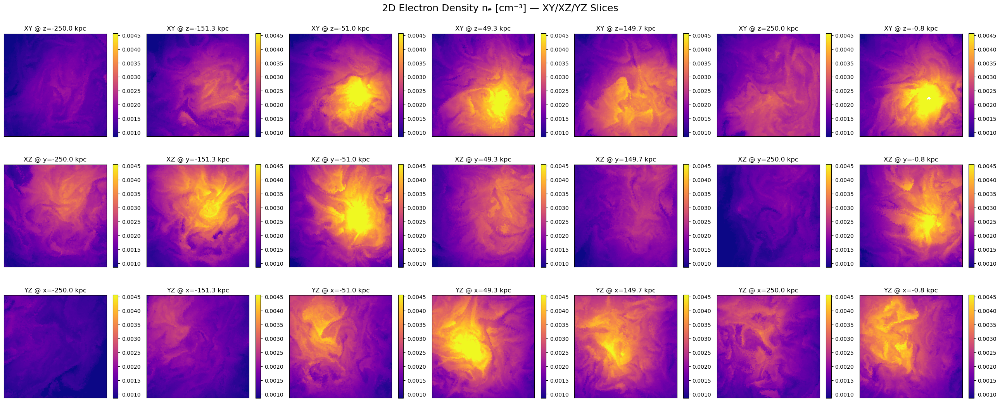

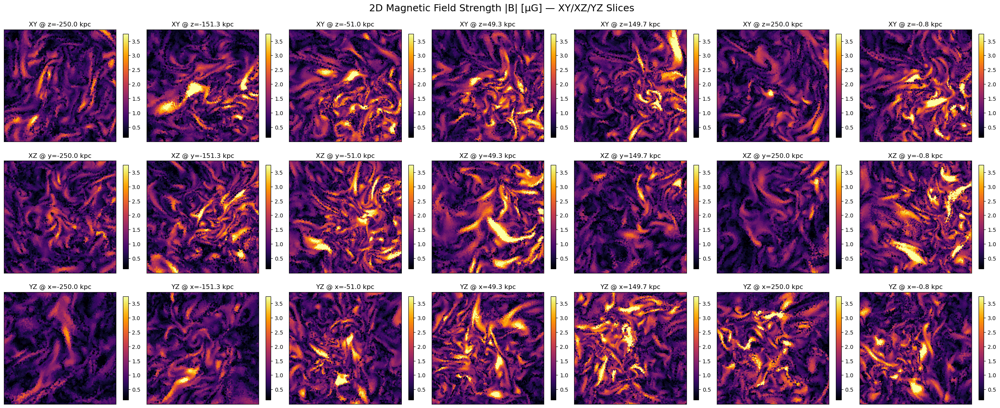

In [15]:
import sys
sys.path.append("/Users/Logan/illustris_python/")

import h5py
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from matplotlib.colors import LogNorm

filename    = "/Users/Logan/Documents/cutout_42631.hdf5"
h           = 0.6774
Ngrid       = 300    
extent_kpc  = 250.0   
Nslices     = 6            

# ============================================================
# LOAD GAS CELLS
# ============================================================
with h5py.File(filename, "r") as f:
    gas      = f["PartType0"]
    coords   = gas["Coordinates"][:]       # ckpc/h
    rho_code = gas["Density"][:]           # 1e10 Msun/h/(ckpc/h)^3
    ne_frac  = gas["ElectronAbundance"][:] # dimensionless
    B_vec    = gas["MagneticField"][:]     # μG
    redshift = f["Header"].attrs["Redshift"]

print("Loaded", len(coords), "gas cells")

# ============================================================
#CENTERING
# ============================================================
with h5py.File(filename, "r") as f:

    # 1. Subhalo position
    if "Subhalo" in f.keys() and "SubhaloPos" in f["Subhalo"].keys():
        center = f["Subhalo"]["SubhaloPos"][:] 
        print("Center = SubhaloPos")

    # 2. API cutout center
    elif "CutoutCenter" in f["Header"].attrs:
        center = f["Header"].attrs["CutoutCenter"]
        print("Center = Header/CutoutCenter")

    # 3. FOF group pos if exists
    elif "Group" in f.keys() and "GroupPos" in f["Group"].keys():
        center = f["Group"]["GroupPos"][:]  
        print("Center = FOF GroupPos")

    else:
        # 4. Mass-weighted centroid, more correct than simple mean
        center = np.average(coords, axis=0, weights=rho_code)
        print("Center = mass-weighted gas centroid")

# ============================================================
# CENTERING
# ============================================================
coords_centered = coords - center
coords_kpc = coords_centered / h / (1 + redshift)
x, y, z = coords_kpc.T

# ============================================================
# ELECTRON DENSITY 
# ============================================================
Msun   = 1.98847e33
kpc_cm = 3.0856776e21
m_p    = 1.6726219e-24

rho_phys   = rho_code * 1e10 * h**2 * (1 + redshift)**3   
rho_e_phys = rho_phys * ne_frac
rho_e_cgs  = rho_e_phys * Msun / kpc_cm**3               
ne_cm3     = rho_e_cgs / m_p                              

# magnetic field magnitude
B_mag = np.linalg.norm(B_vec, axis=1)    # μG

# ============================================================
# BUILD 3D UNIFORM GRID WITH KD-TREE
# ============================================================
print("Building KD-tree…")
pts  = np.column_stack([x, y, z])
tree = cKDTree(pts)

grid_lin = np.linspace(-extent_kpc, extent_kpc, Ngrid)
Xg, Yg, Zg = np.meshgrid(grid_lin, grid_lin, grid_lin, indexing="ij")
grid_points = np.column_stack([Xg.ravel(), Yg.ravel(), Zg.ravel()])

print("Querying KD-tree for nearest neighbors…")
_, idx = tree.query(grid_points, k=1)

ne_grid = ne_cm3[idx].reshape(Ngrid, Ngrid, Ngrid)
B_grid  = B_mag[idx].reshape(Ngrid, Ngrid, Ngrid)

# ============================================================
# MULTI-SLICE PLOT
# ============================================================
def plot_volume_slices(field, title, cmap="viridis", vmin=None, vmax=None):

    ncols = Nslices + 1 
    fig, axs = plt.subplots(3, ncols, figsize=(3.7*ncols, 11))

    slice_indices = np.linspace(0, Ngrid - 1, Nslices, dtype=int)
    idx0 = np.argmin(np.abs(grid_lin - 0.0))

    def do_plot(ax, img, txt):
        im = ax.imshow(img, origin="lower",
                       cmap=cmap, vmin=vmin, vmax=vmax,
                       extent=[-extent_kpc, extent_kpc,
                               -extent_kpc, extent_kpc])
        ax.set_title(txt)
        plt.colorbar(im, ax=ax, shrink=0.75)
        ax.set_xticks([]); ax.set_yticks([])

    for col, idx_slice in enumerate(list(slice_indices) + [idx0]):

        do_plot(axs[0,col],
                field[:,:,idx_slice].T,
                f"XY @ z={grid_lin[idx_slice]:.1f} kpc")

        do_plot(axs[1,col],
                field[:,idx_slice,:].T,
                f"XZ @ y={grid_lin[idx_slice]:.1f} kpc")

        do_plot(axs[2,col],
                field[idx_slice,:,:].T,
                f"YZ @ x={grid_lin[idx_slice]:.1f} kpc")

    fig.suptitle(title, fontsize=18)
    plt.tight_layout()
    plt.show()

# ============================================================
# PLOT 3D ELECTRON DENSITY (cm^-3)
# ============================================================
vmin_ne = np.percentile(ne_grid, 1)
vmax_ne = np.percentile(ne_grid, 99)

plot_volume_slices(
    ne_grid,
    title="2D Electron Density nₑ [cm⁻³] — XY/XZ/YZ Slices",
    cmap="plasma",
    vmin=vmin_ne,
    vmax=vmax_ne
)

# ============================================================
# PLOT 3D MAGNETIC FIELD (μG)
# ============================================================
vmin_B = np.percentile(B_grid, 1)
vmax_B = np.percentile(B_grid, 99)

plot_volume_slices(
    B_grid,
    title="2D Magnetic Field Strength |B| [μG] — XY/XZ/YZ Slices",
    cmap="inferno",
    vmin=vmin_B,
    vmax=vmax_B
)

Loaded 8560228 gas cells
Redshift = 2.220446049250313e-16
Mass-weighted centroid (relative ckpc/h): [-115.57621264   11.04095241  -15.82876114]
Center (absolute ckpc/h): [197521.71533809 112172.28680589 198428.71545849]
Mass-weighted centroid (relative physical kpc): [-170.61737916   16.29901448  -23.36693407]
Center (absolute physical kpc): [291588.00610878 165592.39268658 292926.94930394]


/var/folders/0m/cr_3cvys7fn6wcnlgpyhl8180000gn/T/ipykernel_30534/553296161.py:77: RuntimeWarning: overflow encountered in multiply
  rho_e_cgs = rho_e_Msun_kpc3 * Msun / (kpc_cm**3)  # g/cm^3


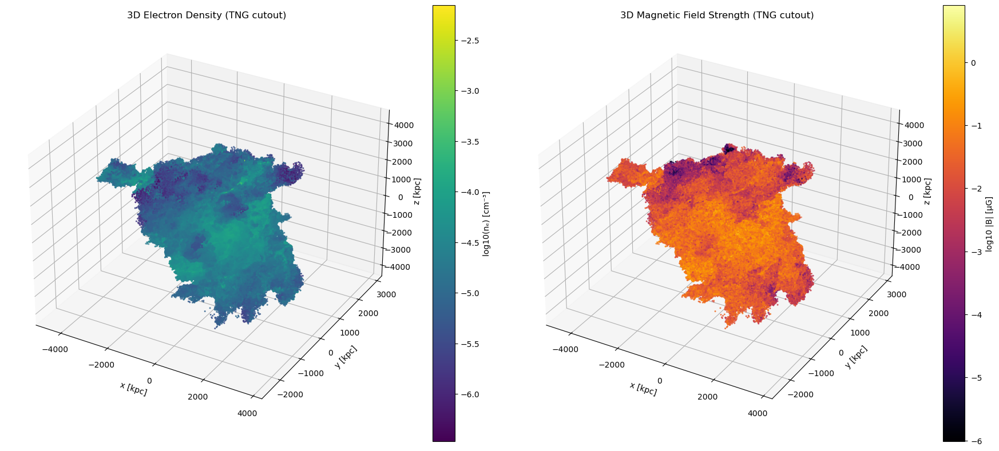

In [13]:
import sys
sys.path.append("/Users/Logan/illustris_python/")

import h5py
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ============================================================
# USER INPUT
# ============================================================
filename = "/Users/Logan/Documents/cutout_42631.hdf5"
Nmax = 5_000_000

# ============================================================
# LOAD DATA
# ============================================================
with h5py.File(filename, "r") as f:
    gas = f["PartType0"]

    coords   = gas["Coordinates"][:]          # ckpc/h (absolute box coords)
    masses   = gas["Masses"][:]               # 1e10 Msun/h
    rho_code = gas["Density"][:]              # 1e10 Msun/h / (ckpc/h)^3
    ne_frac  = gas["ElectronAbundance"][:]    # dimensionless
    B_vec    = gas["MagneticField"][:]        # μG (already physical)
    redshift = f["Header"].attrs["Redshift"]
    h        = f["Header"].attrs["HubbleParam"]

print(f"Loaded {len(coords)} gas cells")
print("Redshift =", redshift)

# ============================================================
# CENTERING
# ============================================================

median_pos = np.median(coords, axis=0)      
coords_rel = coords - median_pos           

center_rel = np.average(coords_rel, axis=0, weights=masses)   
center = median_pos + center_rel                          

# to physical kpc
center_rel_kpc = center_rel / (h * (1 + redshift))
center_kpc      = center     / (h * (1 + redshift))

# ============================================================
# FOUR COORDINATES
# ============================================================

print("Mass-weighted centroid (relative ckpc/h):", center_rel)
print("Center (absolute ckpc/h):", center)

print("Mass-weighted centroid (relative physical kpc):", center_rel_kpc)
print("Center (absolute physical kpc):", center_kpc)


# ============================================================
# CONVERT COORDINATES TO PHYSICAL KPC
# ============================================================
coords_centered = coords - center           
coords_kpc = coords_centered / (h * (1 + redshift)) 

x, y, z = coords_kpc.T

# ============================================================
# ELECTRON NUMBER DENSITY [cm^-3]
# ============================================================
rho_phys_Msun_kpc3 = rho_code * 1e10 * h**2 * (1 + redshift)**3

rho_e_Msun_kpc3 = rho_phys_Msun_kpc3 * ne_frac 

Msun = 1.98847e33
kpc_cm = 3.0856776e21
m_p = 1.6726219e-24

rho_e_cgs = rho_e_Msun_kpc3 * Msun / (kpc_cm**3)  
ne_cm3 = rho_e_cgs / m_p                         

# ============================================================
# MAGNETIC FIELD STRENGTH
# ============================================================
B_mag = np.linalg.norm(B_vec, axis=1)
Ntot = len(x)
idx = np.random.choice(Ntot, size=min(Nmax, Ntot), replace=False)

x_s, y_s, z_s = x[idx], y[idx], z[idx]
ne_s = ne_cm3[idx]
B_s  = B_mag[idx]

# ============================================================
# 3D PLOTS
# ============================================================
fig = plt.figure(figsize=(18, 8))

ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax2 = fig.add_subplot(1, 2, 2, projection='3d')

# ------------------------------------------------------------
# Panel 1 — Electron density
# ------------------------------------------------------------
sc1 = ax1.scatter(
    x_s, y_s, z_s,
    c=np.log10(ne_s + 1e-30),
    s=1.5, cmap="viridis"
)

fig.colorbar(sc1, ax=ax1, label="log10(nₑ) [cm⁻³]")
ax1.set_title("3D Electron Density (TNG cutout)")
ax1.set_xlabel("x [kpc]")
ax1.set_ylabel("y [kpc]")
ax1.set_zlabel("z [kpc]")

# ------------------------------------------------------------
# Panel 2 — Magnetic field
# ------------------------------------------------------------
sc2 = ax2.scatter(
    x_s, y_s, z_s,
    c=np.log10(B_s + 1e-30),
    s=1.5, cmap="inferno"
)

fig.colorbar(sc2, ax=ax2, label="log10 |B| [μG]")
ax2.set_title("3D Magnetic Field Strength (TNG cutout)")
ax2.set_xlabel("x [kpc]")
ax2.set_ylabel("y [kpc]")
ax2.set_zlabel("z [kpc]")

plt.tight_layout()
plt.show()


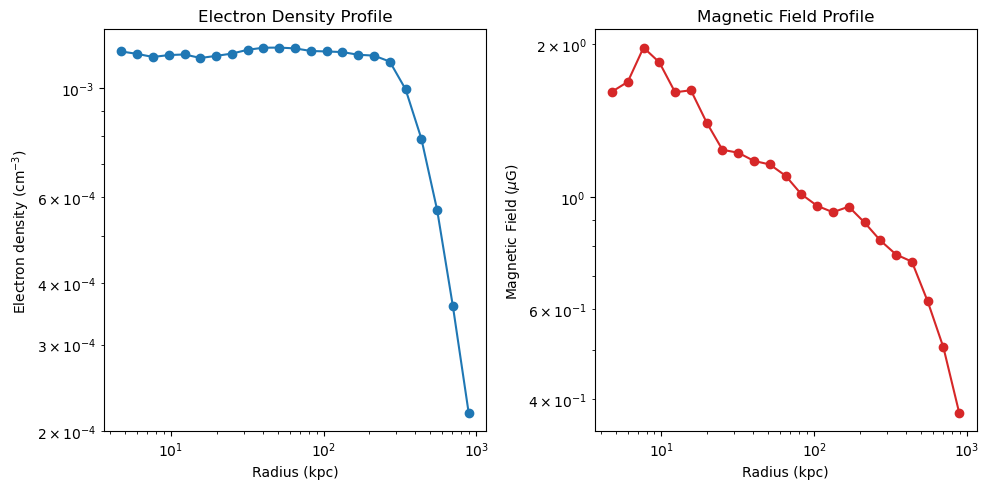

In [9]:
import sys
sys.path.append("/Users/Logan/illustris_python/")

import illustris_python as il
import h5py
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# USER INPUT
# ============================================================
filename = "/Users/Logan/Documents/cutout_42631.hdf5"
h = 0.6774

# ============================================================
# LOAD
# ============================================================
with h5py.File(filename, "r") as f:
    gas = f["PartType0"]

    coords = gas["Coordinates"][:]        # ckpc/h
    masses = gas["Masses"][:] * 1e10      # Msun  (convert early)
    rho_code = gas["Density"][:]          # 1e10 Msun/h / (ckpc/h)^3
    ne_frac = gas["ElectronAbundance"][:] # dimensionless
    B_code  = gas["MagneticField"][:]     # μG physical

    redshift = f["Header"].attrs["Redshift"]
    h        = f["Header"].attrs["HubbleParam"]

# ============================================================
# CENTER HALO
try:
    with h5py.File(filename, "r") as f:
        center = f["Subhalo"]["SubhaloPos"][:]  # ckpc/h
except:
    center = coords.mean(axis=0)

coords_centered = coords - center
r_comoving = np.linalg.norm(coords_centered, axis=1)

# physical radius in kpc
r_kpc = r_comoving / (1 + redshift) / h

# ============================================================
# PHYSICAL GAS DENSITY
rho_phys = rho_code * 1e10 * h**2 * (1 + redshift)**3 

#cell volumes V = m / ρ
V_kpc3 = masses / rho_phys 

# ============================================================
# RADIAL BINNING
# ============================================================
r_bins = np.logspace(0, 3, 30)      # 1–1000 kpc
r_centers = 0.5*(r_bins[:-1] + r_bins[1:])
digitized = np.digitize(r_kpc, r_bins)

# ============================================================
# VOLUME-WEIGHTED AVERAGE FUNCTION
# ============================================================
def radial_avg_volume_weighted(quantity):
    out = []
    for i in range(1, len(r_bins)):
        mask = digitized == i
        if mask.any():
            out.append(np.average(quantity[mask], weights=V_kpc3[mask]))
        else:
            out.append(np.nan)
    return np.array(out)

# ============================================================
# PROFILES
# ============================================================
rho_profile_Msun_kpc3 = radial_avg_volume_weighted(rho_phys)
nefrac_profile = radial_avg_volume_weighted(ne_frac)

# B-field mag
B_mag_uG = np.linalg.norm(B_code, axis=1)
B_profile_uG = radial_avg_volume_weighted(B_mag_uG)

# ============================================================
# ELECTRON DENSITY n_e [cm^-3]
# ============================================================
Msun   = 1.98847e33                   
kpc_cm = 3.0856775814913673e21         
mp     = 1.6726219e-24                 
X_H    = 0.76                         


rho_g_cm3 = rho_profile_Msun_kpc3 * Msun / (kpc_cm**3)
n_H = X_H * rho_g_cm3 / mp
n_e_profile_cm3 = nefrac_profile * n_H

# ============================================================
# PLOT
# ============================================================
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.loglog(r_centers, n_e_profile_cm3, "o-")
plt.xlabel("Radius (kpc)")
plt.ylabel(r"Electron density (cm$^{-3}$)")
plt.title("Electron Density Profile")

plt.subplot(1,2,2)
plt.loglog(r_centers, B_profile_uG, "o-", color="tab:red")
plt.xlabel("Radius (kpc)")
plt.ylabel(r"Magnetic Field ($\mu$G)")
plt.title("Magnetic Field Profile")

plt.tight_layout()
plt.show()

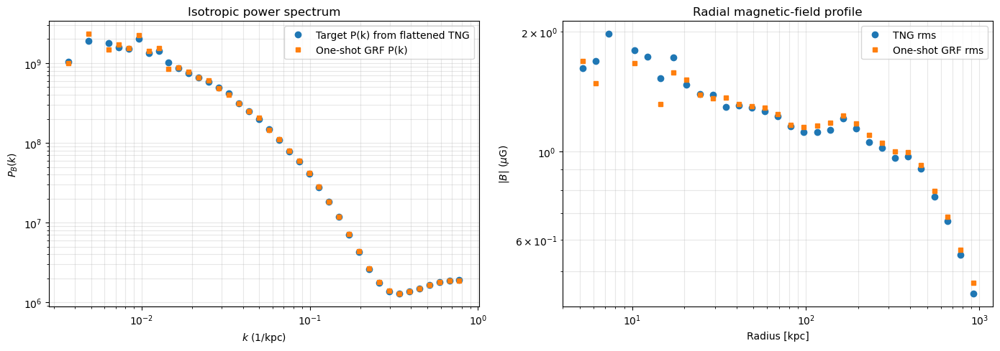

In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# USER INPUT
# ============================================================
filename = "/Users/Logan/Documents/cutout_42631.hdf5"

# Grid
GRID_N = 70 * 4
USE_PHYSICAL_GRID = True 

Rmax_kpc  = 1000.0
Nr_bins   = 40
r0_kpc    = 24
BENV_STAT = "rms"         # "mean" or "rms" radial envelope definition

# Power spectrum binning
N_K_BINS = 40
SEED = 1

APPLY_TNG_ENVELOPE = True

# ============================================================
# CONSTANTS
# ============================================================
kpc_cm = 3.08567758e21

# ============================================================
# Helpers
# ============================================================
def load_cutout(fname):
    with h5py.File(fname, "r") as f:
        gas = f["PartType0"]
        coords_ckpc_h = gas["Coordinates"][:]
        B_vec_uG      = gas["MagneticField"][:]  
        rho_code      = gas["Density"][:]
        masses_code   = gas["Masses"][:]
        z = float(f["Header"].attrs["Redshift"])
        h = float(f["Header"].attrs["HubbleParam"])
        try:
            center_ckpc_h = f["Subhalo"]["SubhaloPos"][:]
        except KeyError:
            center_ckpc_h = coords_ckpc_h.mean(axis=0)
    return coords_ckpc_h, center_ckpc_h, B_vec_uG, rho_code, masses_code, z, h


def physical_coords_kpc(coords_ckpc_h, center_ckpc_h, z, h):
    coords_rel_kpc = (coords_ckpc_h - center_ckpc_h) / h / (1.0 + z)
    r_kpc = np.sqrt(np.sum(coords_rel_kpc**2, axis=1))
    return coords_rel_kpc, r_kpc


def cell_volumes_cm3(rho_code, masses_code, z, h):
    rho_phys = rho_code * 1e10 * h**2 * (1.0 + z)**3 
    masses_Msun = masses_code * 1e10                  
    V_kpc3 = np.nan_to_num(masses_Msun / rho_phys, nan=0.0, posinf=0.0, neginf=0.0)
    return V_kpc3 * (kpc_cm**3)


def radial_envelope_from_cells(r_kpc, B_mag_uG, weights, Rmax_kpc, Nr_bins, stat="rms"):
    r_bins    = np.logspace(0, np.log10(Rmax_kpc), Nr_bins + 1)
    r_centers = 0.5 * (r_bins[:-1] + r_bins[1:])
    dig       = np.digitize(r_kpc, r_bins)

    B_env = np.full(Nr_bins, np.nan)
    ok    = np.zeros(Nr_bins, dtype=bool)

    for i in range(Nr_bins):
        m = (dig == (i + 1))
        if np.any(m):
            w = weights[m]
            if stat == "mean":
                B_env[i] = np.average(B_mag_uG[m], weights=w)
            elif stat == "rms":
                B_env[i] = np.sqrt(np.average(B_mag_uG[m] ** 2, weights=w))
            else:
                raise ValueError("stat must be 'mean' or 'rms'")
            ok[i] = np.isfinite(B_env[i]) and (B_env[i] > 0)

    m = ok & np.isfinite(B_env) & (B_env > 0)
    return r_centers[m], B_env[m]


def flatten_cells_by_envelope(r_kpc, B_vec_uG, r_env, B_env, r0_kpc):
    B_r0 = np.interp(r0_kpc, r_env, B_env)
    B_env_cell = np.interp(r_kpc, r_env, B_env, left=np.nan, right=np.nan)

    good = np.isfinite(B_env_cell) & (B_env_cell > 0) & np.isfinite(B_vec_uG).all(axis=1)

    corr = np.ones_like(B_env_cell)
    corr[good] = (B_r0 / B_env_cell[good])

    B_flat = np.zeros_like(B_vec_uG)
    B_flat[good] = B_vec_uG[good] * corr[good][:, None]
    return B_flat, good


def deposit_to_grid(coords, B_vec, GRID_N):
    mins = coords.min(axis=0)
    maxs = coords.max(axis=0)
    Lx, Ly, Lz = (maxs - mins)

    edges = [
        np.linspace(mins[0], maxs[0], GRID_N + 1),
        np.linspace(mins[1], maxs[1], GRID_N + 1),
        np.linspace(mins[2], maxs[2], GRID_N + 1),
    ]

    counts, _ = np.histogramdd(coords, bins=edges)

    Bx_sum, _ = np.histogramdd(coords, bins=edges, weights=B_vec[:, 0])
    By_sum, _ = np.histogramdd(coords, bins=edges, weights=B_vec[:, 1])
    Bz_sum, _ = np.histogramdd(coords, bins=edges, weights=B_vec[:, 2])

    counts = counts.astype(float)
    counts[counts == 0] = np.nan

    Bx = np.nan_to_num(Bx_sum / counts, nan=0.0)
    By = np.nan_to_num(By_sum / counts, nan=0.0)
    Bz = np.nan_to_num(Bz_sum / counts, nan=0.0)
    return (Bx, By, Bz), (Lx, Ly, Lz), edges


def voxel_center_radii(edges):
    xc = 0.5 * (edges[0][:-1] + edges[0][1:])
    yc = 0.5 * (edges[1][:-1] + edges[1][1:])
    zc = 0.5 * (edges[2][:-1] + edges[2][1:])
    xg, yg, zg = np.meshgrid(xc, yc, zc, indexing="ij")
    return np.sqrt(xg**2 + yg**2 + zg**2)


def k_grid(N, Lx, Ly, Lz):
    dx, dy, dz = Lx / N, Ly / N, Lz / N
    kx = 2 * np.pi * np.fft.fftfreq(N, d=dx)
    ky = 2 * np.pi * np.fft.fftfreq(N, d=dy)
    kz = 2 * np.pi * np.fft.fftfreq(N, d=dz)
    kxg, kyg, kzg = np.meshgrid(kx, ky, kz, indexing="ij")
    kmag = np.sqrt(kxg**2 + kyg**2 + kzg**2)
    return kxg, kyg, kzg, kmag


def project_div_free(Bx_k, By_k, Bz_k, kxg, kyg, kzg):
    k2 = kxg**2 + kyg**2 + kzg**2
    k2 = np.where(k2 > 0, k2, np.inf)

    k_dot_B = kxg * Bx_k + kyg * By_k + kzg * Bz_k
    Bx_k = Bx_k - kxg * k_dot_B / k2
    By_k = By_k - kyg * k_dot_B / k2
    Bz_k = Bz_k - kzg * k_dot_B / k2

    Bx_k[0, 0, 0] = 0.0
    By_k[0, 0, 0] = 0.0
    Bz_k[0, 0, 0] = 0.0
    return Bx_k, By_k, Bz_k


def isotropic_binned_Pk_from_grids(Bx, By, Bz, Lx, Ly, Lz, k_edges, demean=True):
    if demean:
        Bx = Bx - np.mean(Bx)
        By = By - np.mean(By)
        Bz = Bz - np.mean(Bz)

    Bx_k = np.fft.fftn(Bx)
    By_k = np.fft.fftn(By)
    Bz_k = np.fft.fftn(Bz)

    power_k = (np.abs(Bx_k)**2 + np.abs(By_k)**2 + np.abs(Bz_k)**2) / 3.0
    _, _, _, kmag = k_grid(Bx.shape[0], Lx, Ly, Lz)

    k_flat = kmag.ravel()
    P_flat = power_k.ravel()
    mpos   = k_flat > 0
    k_flat = k_flat[mpos]
    P_flat = P_flat[mpos]

    k_cent = 0.5 * (k_edges[:-1] + k_edges[1:])
    Pk = np.full_like(k_cent, np.nan, dtype=float)

    for i in range(len(k_cent)):
        m = (k_flat >= k_edges[i]) & (k_flat < k_edges[i + 1])
        if np.any(m):
            Pk[i] = np.mean(P_flat[m])

    return k_cent, Pk


def radial_envelope_on_grid(Bx, By, Bz, r_grid, r_edges, stat="rms"):
    Bmag = np.sqrt(Bx**2 + By**2 + Bz**2)
    vals = Bmag.ravel()
    rr   = r_grid.ravel()
    dig  = np.digitize(rr, r_edges)

    Nr = len(r_edges) - 1
    r_cent = 0.5 * (r_edges[:-1] + r_edges[1:])

    B_env = np.full(Nr, np.nan)
    ok    = np.zeros(Nr, dtype=bool)

    for i in range(Nr):
        m = (dig == (i + 1))
        if np.any(m):
            if stat == "mean":
                B_env[i] = np.mean(vals[m])
            elif stat == "rms":
                B_env[i] = np.sqrt(np.mean(vals[m]**2))
            else:
                raise ValueError("stat must be 'mean' or 'rms'")
            ok[i] = np.isfinite(B_env[i]) and (B_env[i] > 0)

    m = ok & np.isfinite(B_env) & (B_env > 0)
    return r_cent[m], B_env[m]


def make_loglog_interp(x, y):
    x = np.asarray(x); y = np.asarray(y)
    m = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0)
    x = x[m]; y = y[m]
    lx = np.log(x); ly = np.log(y)

    def f(z):
        z = np.asarray(z)
        out = np.zeros_like(z, dtype=float)
        mm = z > 0
        out[mm] = np.exp(np.interp(np.log(z[mm]), lx, ly, left=ly[0], right=ly[-1]))
        return out

    return f


def apply_radial_envelope_once(Bx, By, Bz, r_grid, r_env_target, B_env_target, r0_kpc):
    target = make_loglog_interp(r_env_target, B_env_target)
    tar_r0 = target(r0_kpc)

    s = np.ones_like(r_grid, dtype=float)
    m = r_grid > 0
    s[m] = target(r_grid[m]) / tar_r0

    return Bx * s, By * s, Bz * s


def synthesize_grf_from_binned_Pk(kmag, k_edges, Pk_bins, rng, eps=1e-30):
    N = kmag.shape[0]
    Bx_k = np.zeros((N, N, N), dtype=np.complex128)
    By_k = np.zeros((N, N, N), dtype=np.complex128)
    Bz_k = np.zeros((N, N, N), dtype=np.complex128)
    for i in range(len(Pk_bins)):
        Ptar = Pk_bins[i]
        if not (np.isfinite(Ptar) and Ptar > 0):
            continue

        kmin, kmax = k_edges[i], k_edges[i + 1]
        m = (kmag >= kmin) & (kmag < kmax) & (kmag > 0)

        if not np.any(m):
            continue
        Bx_k[m] = rng.normal(size=m.sum()) + 1j * rng.normal(size=m.sum())
        By_k[m] = rng.normal(size=m.sum()) + 1j * rng.normal(size=m.sum())
        Bz_k[m] = rng.normal(size=m.sum()) + 1j * rng.normal(size=m.sum())
        power_cur = (np.abs(Bx_k[m])**2 + np.abs(By_k[m])**2 + np.abs(Bz_k[m])**2) / 3.0
        Pcur = np.mean(power_cur)

        if Pcur > eps:
            s = np.sqrt(Ptar / Pcur)
            Bx_k[m] *= s
            By_k[m] *= s
            Bz_k[m] *= s

    # kill k=0
    Bx_k[0, 0, 0] = 0.0
    By_k[0, 0, 0] = 0.0
    Bz_k[0, 0, 0] = 0.0
    return Bx_k, By_k, Bz_k


# ============================================================
# 1)TNG envelope + turbulent spectrum
# ============================================================
coords_ckpc_h, center_ckpc_h, B_vec_uG, rho_code, masses_code, z, h = load_cutout(filename)
coords_rel_kpc, r_kpc = physical_coords_kpc(coords_ckpc_h, center_ckpc_h, z, h)

V_cm3     = cell_volumes_cm3(rho_code, masses_code, z, h)
B_mag_uG  = np.linalg.norm(B_vec_uG, axis=1)

# Radial envelope from TNG (volume-weighted)
r_env_tng, B_env_tng = radial_envelope_from_cells(
    r_kpc, B_mag_uG, V_cm3, Rmax_kpc, Nr_bins, stat=BENV_STAT
)
# Flatten cells by env to isolate turb and extract P(k)
B_vec_flat_uG, good = flatten_cells_by_envelope(r_kpc, B_vec_uG, r_env_tng, B_env_tng, r0_kpc)

if USE_PHYSICAL_GRID:
    coords_for_grid = coords_rel_kpc
    k_xlabel = r"$k$ (1/kpc)"
else:
    coords_for_grid = coords_ckpc_h
    k_xlabel = r"$k$ (1/(ckpc/h))"

#flattened field
(Bx_flat, By_flat, Bz_flat), (Lx, Ly, Lz), edges = deposit_to_grid(
    coords_for_grid[good], B_vec_flat_uG[good], GRID_N
)


kxg, kyg, kzg, kmag = k_grid(GRID_N, Lx, Ly, Lz)
kpos = kmag[kmag > 0]
k_edges = np.logspace(np.log10(kpos.min()), np.log10(kpos.max()), N_K_BINS + 1)
k_cent  = 0.5 * (k_edges[:-1] + k_edges[1:])

# binned P(k) from flattened TNG
k_cent_tng, Pk_tng = isotropic_binned_Pk_from_grids(
    Bx_flat, By_flat, Bz_flat, Lx, Ly, Lz, k_edges, demean=True
)
Pk_target_bins = Pk_tng.copy()
Pk_target_bins[~np.isfinite(Pk_target_bins) | (Pk_target_bins <= 0)] = np.nan


r_grid  = voxel_center_radii(edges)
r_edges = np.logspace(0, np.log10(Rmax_kpc), Nr_bins + 1)
r_cent_plot = 0.5 * (r_edges[:-1] + r_edges[1:])

# TNG radial profile on cells
dig_cells = np.digitize(r_kpc, r_edges)
Bprof_tng = np.full(len(r_cent_plot), np.nan)
for i in range(len(r_cent_plot)):
    m = (dig_cells == (i + 1))
    if np.any(m):
        w = V_cm3[m]
        if BENV_STAT == "mean":
            Bprof_tng[i] = np.average(B_mag_uG[m], weights=w)
        else:
            Bprof_tng[i] = np.sqrt(np.average(B_mag_uG[m] ** 2, weights=w))
m_tng_prof = np.isfinite(Bprof_tng) & (Bprof_tng > 0)
r_prof_tng = r_cent_plot[m_tng_prof]
Bprof_tng  = Bprof_tng[m_tng_prof]

# ============================================================
# 2) ONE-SHOT GRF SYNTHESIS FROM P(k) bins
# ============================================================
rng = np.random.default_rng(SEED)

# Build k-space GRF whose binned power matches Pk_target_bins
Bx_k, By_k, Bz_k = synthesize_grf_from_binned_Pk(kmag, k_edges, Pk_target_bins, rng)








# Enforce divergence-free in k-space
Bx_k, By_k, Bz_k = project_div_free(Bx_k, By_k, Bz_k, kxg, kyg, kzg)

# Project the field onto the divergence-free subspace in Fourier space by removing the component parallel to k:
#B_perp(k) = B(k) - k ([k.B(k)]/|k|^2)
# After this projection, k · B(k) = 0 for all k ≠ 0.







# Back to real space (homogeneous GRF)
Bx = np.fft.ifftn(Bx_k).real
By = np.fft.ifftn(By_k).real
Bz = np.fft.ifftn(Bz_k).real

if APPLY_TNG_ENVELOPE:
    Bx, By, Bz = apply_radial_envelope_once(Bx, By, Bz, r_grid, r_env_tng, B_env_tng, r0_kpc)

    Bx_k = np.fft.fftn(Bx); By_k = np.fft.fftn(By); Bz_k = np.fft.fftn(Bz)
    Bx_k, By_k, Bz_k = project_div_free(Bx_k, By_k, Bz_k, kxg, kyg, kzg)
    Bx = np.fft.ifftn(Bx_k).real
    By = np.fft.ifftn(By_k).real
    Bz = np.fft.ifftn(Bz_k).real

r_env_grf, B_env_grf = radial_envelope_on_grid(Bx, By, Bz, r_grid, r_edges, stat=BENV_STAT)
B_r0_grf = np.interp(r0_kpc, r_env_grf, B_env_grf)
B_r0_tng = np.interp(r0_kpc, r_env_tng, B_env_tng)
if np.isfinite(B_r0_grf) and (B_r0_grf > 0):
    scale = B_r0_tng / B_r0_grf
    Bx *= scale; By *= scale; Bz *= scale

# ============================================================
# 3)spectrum + radial comparison
# ============================================================
k_cent_grf, Pk_grf = isotropic_binned_Pk_from_grids(Bx, By, Bz, Lx, Ly, Lz, k_edges, demean=True)

Bmag_grf = np.sqrt(Bx**2 + By**2 + Bz**2)
dig_grid = np.digitize(r_grid.ravel(), r_edges)
Bprof_grf = np.full(len(r_cent_plot), np.nan)
vals = Bmag_grf.ravel()
for i in range(len(r_cent_plot)):
    m = (dig_grid == (i + 1))
    if np.any(m):
        if BENV_STAT == "mean":
            Bprof_grf[i] = np.mean(vals[m])
        else:
            Bprof_grf[i] = np.sqrt(np.mean(vals[m] ** 2))
m_grf_prof = np.isfinite(Bprof_grf) & (Bprof_grf > 0)
r_prof_grf = r_cent_plot[m_grf_prof]
Bprof_grf  = Bprof_grf[m_grf_prof]

# ============================================================
# 4) PLOTS
# ============================================================
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# ---- LEFT: Power spectrum ----
ax[0].loglog(k_cent_tng, Pk_tng, "o", label="Target P(k) from flattened TNG")
ax[0].loglog(k_cent_grf, Pk_grf, "s", ms=4, label="One-shot GRF P(k)")

ax[0].set_xlabel(k_xlabel)
ax[0].set_ylabel(r"$P_B(k)$")
ax[0].set_title("Isotropic power spectrum")
ax[0].grid(True, which="both", alpha=0.3)
ax[0].legend()

# ---- RIGHT: Radial profile GRF vs TNG ----
ax[1].loglog(r_prof_tng, Bprof_tng, "o", label=f"TNG {BENV_STAT}")
lab = f"One-shot GRF {BENV_STAT}"
if not APPLY_TNG_ENVELOPE:
    lab += " (no envelope applied)"
ax[1].loglog(r_prof_grf, Bprof_grf, "s", ms=4, label=lab)

ax[1].set_xlabel("Radius [kpc]")
ax[1].set_ylabel(r"$|B|$ ($\mu$G)")
ax[1].set_title("Radial magnetic-field profile")
ax[1].grid(True, which="both", alpha=0.3)
ax[1].legend()

plt.tight_layout()
plt.show()

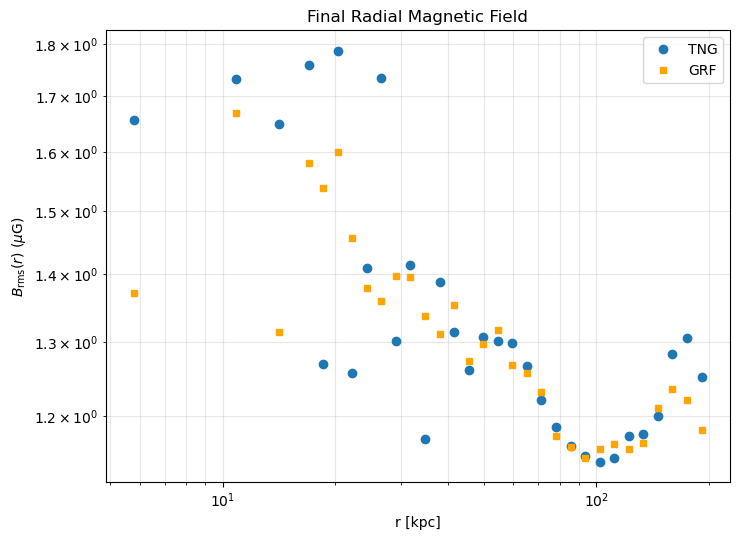

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import h5py

# ----------------------------
# Load TNG coord
# ----------------------------
def load_tng_coords_and_B(filename):
    """
    Returns:
      coords_kpc: (N,3) physical kpc centered on subhalo pos
      B_vec_raw : (N,3) MagneticField as stored in file (units NOT converted here)
      header    : dict with z, h
    """
    with h5py.File(filename, "r") as f:
        gas = f["PartType0"]
        coords_ckpc_h = gas["Coordinates"][:]
        B_vec_raw     = gas["MagneticField"][:] 

        z = float(f["Header"].attrs["Redshift"])
        h = float(f["Header"].attrs["HubbleParam"])
        try:
            center_ckpc_h = f["Subhalo"]["SubhaloPos"][:]
        except Exception:
            center_ckpc_h = coords_ckpc_h.mean(axis=0)

    coords_kpc = (coords_ckpc_h - center_ckpc_h) / h / (1.0 + z)
    header = {"z": z, "h": h}
    return coords_kpc, B_vec_raw, header

def convert_B_to_uG(B_vec_raw, convert="assume_uG_physical", factor_to_uG=None):
    if convert == "assume_uG_physical":
        return np.asarray(B_vec_raw, float)
    if convert == "factor":
        if factor_to_uG is None:
            raise ValueError("factor_to_uG must be provided when convert='factor'")
        return np.asarray(B_vec_raw, float) * float(factor_to_uG)
    raise ValueError(f"Unknown convert mode: {convert}")


# ----------------------------
# Deposit <B^2> to grid (FIXED)
# ----------------------------
def deposit_B2_to_grid(coords_kpc, B_vec_uG, edges, weights=None):
    coords_kpc = np.asarray(coords_kpc, float)
    B_vec_uG   = np.asarray(B_vec_uG, float)

    if weights is None:
        weights = np.ones(len(coords_kpc), float)
    else:
        weights = np.asarray(weights, float)
        if len(weights) != len(coords_kpc):
            raise ValueError("weights must have same length as coords_kpc")
    W, _ = np.histogramdd(coords_kpc, bins=edges, weights=weights)
    W = W.astype(float)
    W[W == 0] = np.nan
    B2 = (B_vec_uG[:, 0]**2 + B_vec_uG[:, 1]**2 + B_vec_uG[:, 2]**2)
    B2_sum, _ = np.histogramdd(coords_kpc, bins=edges, weights=weights * B2)
    B2_vox = B2_sum / W
    B2_vox = np.nan_to_num(B2_vox, nan=0.0)
    return B2_vox


# ----------------------------
# Radial RMS
# ----------------------------
def radial_rms_from_B2_grid(B2_vox_uG2, edges, Nr_bins=40, rmax_kpc=None):
    """
    Compute Brms(r) = sqrt( mean_shell( <B^2>_voxel ) )
    """
    x_edges, y_edges, z_edges = edges
    xc = 0.5*(x_edges[:-1] + x_edges[1:])
    yc = 0.5*(y_edges[:-1] + y_edges[1:])
    zc = 0.5*(z_edges[:-1] + z_edges[1:])
    x3, y3, z3 = np.meshgrid(xc, yc, zc, indexing="ij")
    r3 = np.sqrt(x3**2 + y3**2 + z3**2)

    r  = r3.ravel()
    B2 = np.asarray(B2_vox_uG2, float).ravel()
    mpos = np.isfinite(B2) & (B2 > 0) & np.isfinite(r) & (r > 0)
    if not np.any(mpos):
        raise RuntimeError("No positive B^2 voxels found. Check your inputs/units.")

    if rmax_kpc is None:
        rmax_kpc = float(np.max(r[mpos]))
    rmin_kpc = float(np.min(r[mpos]))

    r_edges = np.logspace(np.log10(rmin_kpc), np.log10(rmax_kpc), Nr_bins + 1)
    r_cent  = 0.5*(r_edges[:-1] + r_edges[1:])

    Brms = np.full(Nr_bins, np.nan)
    for i in range(Nr_bins):
        ms = (r >= r_edges[i]) & (r < r_edges[i+1]) & mpos
        if np.any(ms):
            Brms[i] = np.sqrt(np.mean(B2[ms]))

    good = np.isfinite(Brms) & (Brms > 0)
    return r_cent[good], Brms[good]

def print_rms_sanity(label, B_vec_uG=None, B2_vox_uG2=None):
    if B_vec_uG is not None:
        cell_rms = np.sqrt(np.mean(np.sum(B_vec_uG**2, axis=1)))
        print(f"{label}: cell RMS(|B|) = {cell_rms:.4g} μG")
    if B2_vox_uG2 is not None:
        v = B2_vox_uG2[B2_vox_uG2 > 0]
        vox_rms = np.sqrt(np.mean(v)) if len(v) else np.nan


# ============================================================
# RUN
# ============================================================
def main():
    global edges, Bx, By, Bz
    if "edges" not in globals():
        raise RuntimeError("Missing 'edges' in memory: edges=[x_edges,y_edges,z_edges] (kpc).")
    if any(k not in globals() for k in ("Bx", "By", "Bz")):
        raise RuntimeError("Missing GRF grid fields in memory: need Bx, By, Bz in μG on the grid.")

    tng_file = "/Users/Logan/Documents/cutout_42631.hdf5"

    # ----------------------------
    # GRF
    # ----------------------------
    B2_grf_vox = (np.asarray(Bx, float)**2 + np.asarray(By, float)**2 + np.asarray(Bz, float)**2)

    # ----------------------------
    # TNG
    coords_kpc, B_raw, _ = load_tng_coords_and_B(tng_file)
    B_uG = convert_B_to_uG(B_raw, convert="assume_uG_physical")

    B2_tng_vox = deposit_B2_to_grid(coords_kpc, B_uG, edges, weights=None)
    # ----------------------------
    # Radial RMS profiles
    # ----------------------------
    rmax = 200.0
    Nr_bins = 40
    r_grf, Brms_grf = radial_rms_from_B2_grid(B2_grf_vox, edges, Nr_bins=Nr_bins, rmax_kpc=rmax)
    r_tng, Brms_tng = radial_rms_from_B2_grid(B2_tng_vox, edges, Nr_bins=Nr_bins, rmax_kpc=rmax)

    # ----------------------------
    # Plot
    # ----------------------------
    plt.figure(figsize=(7.5, 5.5))
    plt.loglog(r_tng, Brms_tng, "o", color="tab:blue", label="TNG")
    plt.loglog(r_grf, Brms_grf, "s", ms=4, color="orange", label="GRF")
    plt.xlabel("r [kpc]")
    plt.ylabel(r"$B_{\rm rms}(r)$ ($\mu$G)")
    plt.title("Final Radial Magnetic Field")
    plt.grid(True, which="both", alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


if __name__ == "__main__":
    main()

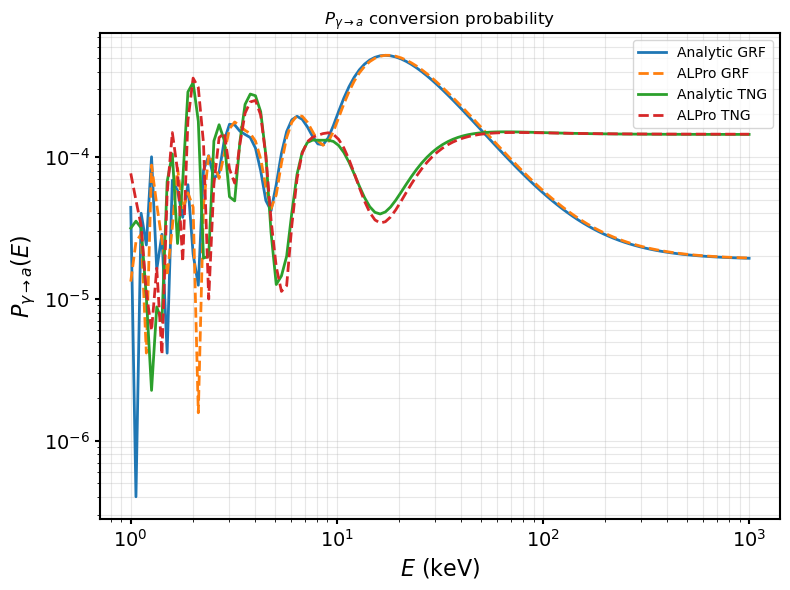

In [37]:
import sys
sys.path.append("/Users/Logan/illustris_python/")
sys.path.append("/Users/Logan/ALPro")

import h5py
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import alpro

os.environ["ALPRO_QUIET"] = "1"
sys.stdout = open(os.devnull, "w")  # silence chatter

# ============================================================
# Units
# ============================================================
kpc_to_eVinv = 1.5637e26
G_to_eV2     = 1.95e-2
m_p_gram     = 1.6726219e-24
Msun_gram    = 1.98847e33
kpc_cm       = 3.08567758e21

def omega_pl(ne_cm3):
    return 3.69e-11 * np.sqrt(ne_cm3)

# ============================================================
ALPRO_RETURNS_SURVIVAL = True

# ============================================================
# TNG: radial electron-density profile (volume-weighted)
# ============================================================
def get_tng_radial_ne_profile(filename, N_r_bins=40):
    with h5py.File(filename, "r") as f:
        gas = f["PartType0"]
        coords_ckpc_h = gas["Coordinates"][:]
        rho_code      = gas["Density"][:]
        ne_frac       = gas["ElectronAbundance"][:]
        masses_code   = gas["Masses"][:]
        redshift      = float(f["Header"].attrs["Redshift"])
        h             = float(f["Header"].attrs["HubbleParam"])

        try:
            center_ckpc_h = f["Subhalo"]["SubhaloPos"][:]
        except KeyError:
            center_ckpc_h = coords_ckpc_h.mean(axis=0)

    coords_rel_kpc = (coords_ckpc_h - center_ckpc_h) / h / (1 + redshift)
    r_kpc = np.linalg.norm(coords_rel_kpc, axis=1)

    rho_phys_Msun_kpc3 = rho_code * 1e10 * h**2 * (1 + redshift)**3
    rho_phys_g_cm3     = rho_phys_Msun_kpc3 * Msun_gram / (kpc_cm**3)

    masses_Msun = masses_code * 1e10
    V_kpc3      = masses_Msun / rho_phys_Msun_kpc3
    V_cm3       = V_kpc3 * (kpc_cm**3)

    ne_cell_cm3 = ne_frac * rho_phys_g_cm3 / m_p_gram

    r_min = max(1.0, np.min(r_kpc[r_kpc > 0]))
    r_max = np.max(r_kpc)
    r_bins = np.logspace(np.log10(r_min), np.log10(r_max), N_r_bins + 1)
    r_cent = 0.5*(r_bins[:-1] + r_bins[1:])

    ne_prof = np.full(N_r_bins, np.nan)
    for i in range(N_r_bins):
        m = (r_kpc >= r_bins[i]) & (r_kpc < r_bins[i+1])
        if np.any(m):
            ne_prof[i] = np.average(ne_cell_cm3[m], weights=V_cm3[m])

    valid = np.isfinite(ne_prof)
    if not np.all(valid):
        ne_prof = np.interp(r_cent, r_cent[valid], ne_prof[valid])

    return r_cent, ne_prof

# ============================================================
# TNG LOS (volume-weighted cylinder)
# ============================================================
def build_tng_los_volume_weighted(tng_filename, R_cyl_kpc=20.0, N_bins=500, smooth_window=7):
    with h5py.File(tng_filename, "r") as f:
        gas = f["PartType0"]

        coords_ckpc_h = gas["Coordinates"][:]
        rho_code      = gas["Density"][:]
        ne_frac       = gas["ElectronAbundance"][:]
        B_vec_uG      = gas["MagneticField"][:]
        masses_code   = gas["Masses"][:]

        redshift = float(f["Header"].attrs["Redshift"])
        h        = float(f["Header"].attrs["HubbleParam"])

        try:
            center_ckpc_h = f["Subhalo"]["SubhaloPos"][:]
        except KeyError:
            center_ckpc_h = coords_ckpc_h.mean(axis=0)

    coords_rel_kpc = (coords_ckpc_h - center_ckpc_h) / h / (1 + redshift)
    x_kpc = coords_rel_kpc[:, 0]
    y_kpc = coords_rel_kpc[:, 1]
    z_kpc = coords_rel_kpc[:, 2]

    rho_phys_Msun_kpc3 = rho_code * 1e10 * h**2 * (1 + redshift)**3
    rho_phys_g_cm3     = rho_phys_Msun_kpc3 * Msun_gram / (kpc_cm**3)

    masses_Msun = masses_code * 1e10
    V_kpc3      = masses_Msun / rho_phys_Msun_kpc3
    V_cm3       = V_kpc3 * (kpc_cm**3)

    ne_cell_cm3 = ne_frac * rho_phys_g_cm3 / m_p_gram

    R_perp_kpc = np.sqrt(x_kpc**2 + y_kpc**2)
    mask_los   = R_perp_kpc < R_cyl_kpc

    z_los      = z_kpc[mask_los]
    ne_los     = ne_cell_cm3[mask_los]
    By_los_uG  = B_vec_uG[mask_los][:, 1]
    V_los_cm3  = V_cm3[mask_los]

    order = np.argsort(z_los)
    z_los      = z_los[order]
    ne_los     = ne_los[order]
    By_los_uG  = By_los_uG[order]
    V_los_cm3  = V_los_cm3[order]

    z_edges = np.linspace(z_los.min(), z_los.max(), N_bins + 1)
    z_mid   = 0.5*(z_edges[:-1] + z_edges[1:])

    ne_grid  = np.full(N_bins, np.nan)
    By_grid  = np.full(N_bins, np.nan)
    valid    = np.zeros(N_bins, dtype=bool)

    for i in range(N_bins):
        m = (z_los >= z_edges[i]) & (z_los < z_edges[i+1])
        if np.any(m):
            w = V_los_cm3[m]
            ne_grid[i] = np.average(ne_los[m], weights=w)
            By_grid[i] = np.average(By_los_uG[m], weights=w)
            valid[i]   = True

    if not np.all(valid):
        ne_grid = np.interp(z_mid, z_mid[valid], ne_grid[valid])
        By_grid = np.interp(z_mid, z_mid[valid], By_grid[valid])

    if smooth_window > 1:
        kernel = np.ones(smooth_window)/smooth_window
        By_grid = np.convolve(By_grid, kernel, mode="same")

    dL_kpc     = z_mid[1] - z_mid[0]
    B_los_G    = By_grid * 1e-6
    ne_los_cm3 = ne_grid
    return z_mid, B_los_G, ne_los_cm3, dL_kpc
    
def build_constructed_grf_los_from_grid(
    Bx_uG, By_uG, Bz_uG,
    edges_xyz_kpc,
    r_prof_kpc, ne_prof_cm3,
    R_cyl_kpc=20.0,
    N_bins=500,
    smooth_window=7,
):
    x_edges, y_edges, z_edges = edges_xyz_kpc
    xc = 0.5 * (x_edges[:-1] + x_edges[1:])
    yc = 0.5 * (y_edges[:-1] + y_edges[1:])
    zc = 0.5 * (z_edges[:-1] + z_edges[1:])

    xg, yg, zg = np.meshgrid(xc, yc, zc, indexing="ij")
    r3 = np.sqrt(xg**2 + yg**2 + zg**2)
    Rperp = np.sqrt(xg**2 + yg**2)

    # ne(r) on grid from TNG radial profile
    r_clip = np.clip(r3, r_prof_kpc.min(), r_prof_kpc.max())
    ne_grid = np.interp(r_clip, r_prof_kpc, ne_prof_cm3)  # cm^-3

    mask = Rperp < R_cyl_kpc
    if np.count_nonzero(mask) == 0:
        dx = (x_edges[-1] - x_edges[0]) / (len(xc))
        raise RuntimeError(
            f"Constructed-GRF cylinder empty: R_cyl={R_cyl_kpc} kpc < grid spacing ~{dx:.2f} kpc. "
            f"Increase R_cyl or increase GRID_N."
        )
    z_sel  = zg[mask].ravel()
    ne_sel = ne_grid[mask].ravel()
    By_sel = By_uG[mask].ravel() * 1e-6

    order = np.argsort(z_sel)
    z_sel, ne_sel, By_sel = z_sel[order], ne_sel[order], By_sel[order]

    z_edges_1d = np.linspace(z_sel.min(), z_sel.max(), N_bins + 1)
    z_mid      = 0.5*(z_edges_1d[:-1] + z_edges_1d[1:])

    ne_1d = np.full(N_bins, np.nan)
    By_1d = np.full(N_bins, np.nan)
    ok    = np.zeros(N_bins, dtype=bool)

    for i in range(N_bins):
        m = (z_sel >= z_edges_1d[i]) & (z_sel < z_edges_1d[i+1])
        if np.any(m):
            ne_1d[i] = np.mean(ne_sel[m])
            By_1d[i] = np.mean(By_sel[m])
            ok[i] = True

    if not np.all(ok):
        ne_1d = np.interp(z_mid, z_mid[ok], ne_1d[ok])
        By_1d = np.interp(z_mid, z_mid[ok], By_1d[ok])

    if smooth_window > 1:
        kernel = np.ones(smooth_window)/smooth_window
        By_1d = np.convolve(By_1d, kernel, mode="same")

    dL_kpc = z_mid[1] - z_mid[0]
    return z_mid, By_1d, ne_1d, dL_kpc

# ============================================================
# Analytic weak-mixing P(E)
# ============================================================
def analytic_P_vs_E(energies_eV, B_G, ne_cm3, dL_kpc, g_GeVinv, m_a_eV):
    B_G    = np.asarray(B_G, dtype=float)
    ne_cm3 = np.asarray(ne_cm3, dtype=float)

    dz = dL_kpc * kpc_to_eVinv
    g_eVinv = g_GeVinv * 1e-9
    Delta_ag = 0.5 * g_eVinv * (B_G * G_to_eV2)

    wpl2 = omega_pl(ne_cm3)**2
    P = np.zeros_like(energies_eV, dtype=float)

    for iE, E in enumerate(energies_eV):
        meff2 = m_a_eV**2 - wpl2
        Delta_eff = -meff2 / (2.0 * E)

        phi_left = np.zeros_like(Delta_eff)
        phi_left[1:] = np.cumsum(Delta_eff[:-1]) * dz
        phi_center = phi_left + 0.5 * Delta_eff * dz

        A = np.sum(Delta_ag * np.exp(1j * phi_center) * dz)
        P[iE] = np.abs(A)**2

    return P

# ============================================================
# ALPro P(E)
# ============================================================
def alpro_P_vs_E(energies_eV, B_G, ne_cm3, dL_kpc, g_GeVinv, m_a_eV):
    B_G    = np.asarray(B_G, dtype=float)
    ne_cm3 = np.asarray(ne_cm3, dtype=float)
    n = len(B_G)

    s = alpro.Survival("custom")
    s.initialise_domain()

    s.domain.ne     = ne_cm3.copy()
    s.domain.deltaL = np.ones(n) * dL_kpc
    s.domain.B   = np.abs(B_G)
    s.domain.phi = np.where(B_G >= 0.0, 0.0, np.pi)

    s.set_params(g=g_GeVinv*1e-9, mass=m_a_eV)
    s.energies = energies_eV.copy()

    P_out, _ = s.propagate(pol="y")

    if ALPRO_RETURNS_SURVIVAL:
        return P_out
    return P_out

# ============================================================
# Main
# ============================================================
def main():
    tng_filename = "/Users/Logan/Documents/cutout_42631.hdf5"

    # --- ALP params ---
    g_GeVinv = 1e-13
    m_a_eV   = 1e-12
    energies_eV = np.logspace(3, 6, 120)  # 3 keV → 1 MeV
    E_keV = energies_eV / 1e3

    # ---LoS params ---
    R_cyl_kpc     = 20.0
    N_bins        = 500
    smooth_window = 7

    # --- 1) TNG radial ne(r) ---
    r_prof_kpc, ne_prof_cm3 = get_tng_radial_ne_profile(tng_filename, N_r_bins=40)

    # --- 2) Constructed GRF LOS 
    z_grf, B_grf_G, ne_grf_cm3, dL_grf_kpc = build_constructed_grf_los_from_grid(
        Bx_uG=Bx, By_uG=By, Bz_uG=Bz,
        edges_xyz_kpc=edges,
        r_prof_kpc=r_prof_kpc, ne_prof_cm3=ne_prof_cm3,
        R_cyl_kpc=R_cyl_kpc, N_bins=N_bins, smooth_window=smooth_window
    )

    P_grf_ana  = analytic_P_vs_E(energies_eV, B_grf_G, ne_grf_cm3, dL_grf_kpc, g_GeVinv, m_a_eV)
    P_grf_alpr = alpro_P_vs_E(energies_eV, B_grf_G, ne_grf_cm3, dL_grf_kpc, g_GeVinv, m_a_eV)

    # --- 3) TNG LOS ---
    z_tng, B_tng_G, ne_tng_cm3, dL_tng_kpc = build_tng_los_volume_weighted(
        tng_filename,
        R_cyl_kpc=R_cyl_kpc,
        N_bins=N_bins,
        smooth_window=smooth_window
    )

    P_tng_ana  = analytic_P_vs_E(energies_eV, B_tng_G, ne_tng_cm3, dL_tng_kpc, g_GeVinv, m_a_eV)
    P_tng_alpr = alpro_P_vs_E(energies_eV, B_tng_G, ne_tng_cm3, dL_tng_kpc, g_GeVinv, m_a_eV)

    # --- 4) Plot conv prob ---
    plt.figure(figsize=(8, 6))
    plt.loglog(E_keV, P_grf_ana,    label="Analytic GRF", lw=2)
    plt.loglog(E_keV, P_grf_alpr,  "--", label="ALPro GRF", lw=2)
    plt.loglog(E_keV, P_tng_ana,    label="Analytic TNG", lw=2)
    plt.loglog(E_keV, P_tng_alpr,  "--", label="ALPro TNG", lw=2)

    plt.xlabel(r"$E$ (keV)")
    plt.ylabel(r"$P_{\gamma\to a}(E)$")
    plt.title(r"$P_{\gamma\to a}$ conversion probability")
    plt.grid(True, which="both", alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

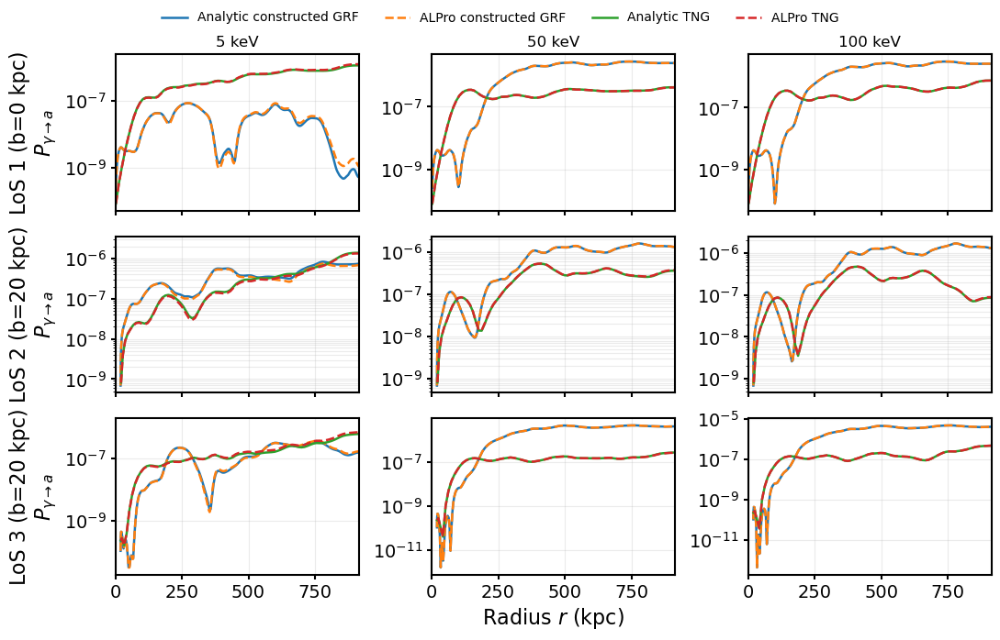

In [39]:
import sys
sys.path.append("/Users/Logan/illustris_python/")
sys.path.append("/Users/Logan/ALPro")

import h5py
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import alpro

os.environ["ALPRO_QUIET"] = "1"
sys.stdout = open(os.devnull, "w")  # silence chatter

# ============================================================
# Units
# ============================================================
kpc_to_eVinv = 1.5637e26
G_to_eV2     = 1.95e-2
m_p_gram     = 1.6726219e-24
Msun_gram    = 1.98847e33
kpc_cm       = 3.08567758e21

def omega_pl(ne_cm3):
    return 3.69e-11 * np.sqrt(ne_cm3)

# ALPro convention
ALPRO_RETURNS_SURVIVAL = True

# ============================================================
# Extract TNG radial electron density (volume-weighted)
# ============================================================
def get_tng_radial_ne(filename, N_bins=40):
    with h5py.File(filename, "r") as f:
        gas = f["PartType0"]

        coords   = gas["Coordinates"][:] 
        rho_code = gas["Density"][:] 
        ne_frac  = gas["ElectronAbundance"][:]
        masses   = gas["Masses"][:] * 1e10

        redshift = float(f["Header"].attrs["Redshift"])
        h        = float(f["Header"].attrs["HubbleParam"])

        try:
            center = f["Subhalo"]["SubhaloPos"][:]
        except Exception:
            center = coords.mean(axis=0)

    coords = (coords - center) / (h * (1 + redshift))
    r_kpc  = np.linalg.norm(coords, axis=1)

    rho_phys  = rho_code * 1e10 * h**2 * (1 + redshift)**3 
    rho_g_cm3 = rho_phys * Msun_gram / (kpc_cm**3)

    V_kpc3 = masses / rho_phys
    V_cm3  = V_kpc3 * kpc_cm**3

    ne_cell = ne_frac * rho_g_cm3 / m_p_gram

    r_min = max(1, np.min(r_kpc[r_kpc > 0]))
    r_max = np.max(r_kpc)
    r_bins = np.logspace(np.log10(r_min), np.log10(r_max), N_bins + 1)
    r_centers = 0.5 * (r_bins[:-1] + r_bins[1:])

    ne_prof = np.full(N_bins, np.nan)
    for i in range(N_bins):
        mask = (r_kpc >= r_bins[i]) & (r_kpc < r_bins[i+1])
        if np.any(mask):
            ne_prof[i] = np.average(ne_cell[mask], weights=V_cm3[mask])

    good = np.isfinite(ne_prof)
    ne_prof = np.interp(r_centers, r_centers[good], ne_prof[good])
    return r_centers, ne_prof


# ============================================================
# NEW: Constructed GRF LOS
def build_constructed_grf_los_cylinder_avg_along_z(
    Bx_uG, By_uG, Bz_uG, edges_xyz_kpc,
    filename_for_ne_profile,
    x0_kpc=0.0,
    y0_kpc=0.0,
    R_cyl=80.0,
    N_bins=250,
    smooth_window=7,
):
    # TNG ne(r) profile
    r_prof, ne_prof = get_tng_radial_ne(filename_for_ne_profile, N_bins=40)
    x_edges, y_edges, z_edges = edges_xyz_kpc
    xc = 0.5 * (x_edges[:-1] + x_edges[1:])
    yc = 0.5 * (y_edges[:-1] + y_edges[1:])
    zc = 0.5 * (z_edges[:-1] + z_edges[1:])

    x3, y3, z3 = np.meshgrid(xc, yc, zc, indexing="ij")
    r3 = np.sqrt(x3**2 + y3**2 + z3**2)

    r_clip = np.clip(r3, r_prof.min(), r_prof.max())
    ne_grid = np.interp(r_clip, r_prof, ne_prof)
    R_perp = np.sqrt((x3 - x0_kpc)**2 + (y3 - y0_kpc)**2)
    mask = R_perp < R_cyl
    ncell = np.count_nonzero(mask)
    if ncell < 20:
        dx = (x_edges[-1] - x_edges[0]) / (len(xc))
        raise RuntimeError(
            f"Constructed-GRF cylinder too thin: {ncell} voxels. "
            f"Increase R_cyl or GRID_N. Current dx ~ {dx:.2f} kpc."
        )

    z_sel  = z3[mask].ravel()
    B_sel  = By_uG[mask].ravel() * 1e-6
    ne_sel = ne_grid[mask].ravel()

    z_min, z_max = z_sel.min(), z_sel.max()
    z_edges_1d = np.linspace(z_min, z_max, N_bins + 1)
    z_mid      = 0.5*(z_edges_1d[:-1] + z_edges_1d[1:])

    ne_bin = np.full(N_bins, np.nan)
    B_bin  = np.full(N_bins, np.nan)
    ok     = np.zeros(N_bins, bool)

    for i in range(N_bins):
        mb = (z_sel >= z_edges_1d[i]) & (z_sel < z_edges_1d[i+1])
        if np.any(mb):
            ne_bin[i] = np.mean(ne_sel[mb])
            B_bin[i]  = np.mean(B_sel[mb])
            ok[i] = True

    if not np.all(ok):
        ne_bin = np.interp(z_mid, z_mid[ok], ne_bin[ok])
        B_bin  = np.interp(z_mid, z_mid[ok],  B_bin[ok])

    if smooth_window and smooth_window > 1:
        kernel = np.ones(smooth_window)/smooth_window
        B_bin = np.convolve(B_bin, kernel, mode="same")
    mpos = z_mid >= 0
    z_pos  = z_mid[mpos]
    ne_out = ne_bin[mpos]
    B_out  = B_bin[mpos]

    dL_kpc = z_pos[1] - z_pos[0]
    b = np.sqrt(x0_kpc**2 + y0_kpc**2)
    r_los = np.sqrt(b*b + z_pos*z_pos)

    return r_los, B_out, ne_out, dL_kpc


# ============================================================
# TNG LOS
# ============================================================
def build_tng_los(filename, R_cyl=20, N_bins=500, smooth_window=7, x0=0.0, y0=0.0):
    with h5py.File(filename, "r") as f:
        gas = f["PartType0"]
        coords   = gas["Coordinates"][:]
        rho_code = gas["Density"][:]
        ne_frac  = gas["ElectronAbundance"][:]
        masses   = gas["Masses"][:] * 1e10
        B_vec    = gas["MagneticField"][:]

        redshift = float(f["Header"].attrs["Redshift"])
        h        = float(f["Header"].attrs["HubbleParam"])

        try:
            center = f["Subhalo"]["SubhaloPos"][:]
        except Exception:
            center = coords.mean(axis=0)

    coords = (coords - center) / (h * (1 + redshift))
    x, y, z = coords.T

    R_perp = np.sqrt((x - x0)**2 + (y - y0)**2)

    rho_phys  = rho_code * 1e10 * h**2 * (1 + redshift)**3
    rho_g_cm3 = rho_phys * Msun_gram / (kpc_cm**3)
    V_kpc3 = masses / rho_phys
    V_cm3  = V_kpc3 * kpc_cm**3

    ne_cell = ne_frac * rho_g_cm3 / m_p_gram
    By      = B_vec[:, 1] * 1e-6

    mask = R_perp < R_cyl
    z_los  = z[mask]
    ne_los = ne_cell[mask]
    By_los = By[mask]
    V_los  = V_cm3[mask]

    order = np.argsort(z_los)
    z_los, ne_los, By_los, V_los = [arr[order] for arr in (z_los, ne_los, By_los, V_los)]

    z_min, z_max = z_los.min(), z_los.max()
    z_edges = np.linspace(z_min, z_max, N_bins + 1)
    z_mid   = 0.5*(z_edges[:-1] + z_edges[1:])

    ne_grid = np.full(N_bins, np.nan)
    By_grid = np.full(N_bins, np.nan)
    ok      = np.zeros(N_bins, bool)

    for i in range(N_bins):
        mb = (z_los >= z_edges[i]) & (z_los < z_edges[i+1])
        if np.any(mb):
            w = V_los[mb]
            ne_grid[i] = np.average(ne_los[mb], weights=w)
            By_grid[i] = np.average(By_los[mb], weights=w)
            ok[i] = True

    if not np.all(ok):
        ne_grid = np.interp(z_mid, z_mid[ok], ne_grid[ok])
        By_grid = np.interp(z_mid, z_mid[ok], By_grid[ok])

    if smooth_window and smooth_window > 1:
        kernel = np.ones(smooth_window)/smooth_window
        By_grid = np.convolve(By_grid, kernel, mode="same")

    mpos = z_mid >= 0
    z_pos  = z_mid[mpos]
    ne_out = ne_grid[mpos]
    B_out  = By_grid[mpos]

    dL_kpc = z_pos[1] - z_pos[0]
    b = np.sqrt(x0**2 + y0**2)
    r_los = np.sqrt(b*b + z_pos*z_pos)

    return r_los, B_out, ne_out, dL_kpc


# ============================================================
# Analytic cumulative P(r)
# ============================================================
def analytic_P_vs_r(B_G, ne_cm3, dL_kpc, g_GeVinv, m_a_eV, E_eV):
    B_G    = np.asarray(B_G, dtype=float)
    ne_cm3 = np.asarray(ne_cm3, dtype=float)

    dz = dL_kpc * kpc_to_eVinv
    g_eVinv = g_GeVinv * 1e-9

    Delta_ag = 0.5 * g_eVinv * (B_G * G_to_eV2)

    wpl2 = omega_pl(ne_cm3)**2
    meff2 = m_a_eV**2 - wpl2
    Delta_eff = -meff2 / (2.0 * E_eV)

    phi_left = np.zeros_like(Delta_eff)
    phi_left[1:] = np.cumsum(Delta_eff[:-1]) * dz
    phi_center = phi_left + 0.5 * Delta_eff * dz

    dA = Delta_ag * np.exp(1j * phi_center) * dz
    A_cum = np.cumsum(dA)
    return np.abs(A_cum)**2


# ============================================================
# ALPro
# ============================================================
def alpro_P_vs_r(B_G, ne_cm3, dL_kpc, g_GeVinv, m_a_eV, E_eV):
    n = len(B_G)
    P_cum = np.zeros(n)
    E_arr = np.array([E_eV])

    for j in range(1, n + 1):
        s = alpro.Survival("custom")
        s.initialise_domain()

        segB = B_G[:j]
        s.domain.B = np.abs(segB)
        s.domain.phi = np.where(segB >= 0, 0.0, np.pi)
        s.domain.ne = ne_cm3[:j].copy()
        s.domain.deltaL = np.ones(j) * dL_kpc

        s.set_params(g=g_GeVinv*1e-9, mass=m_a_eV)
        s.energies = E_arr

        P_surv, _ = s.propagate(pol="y")
        if ALPRO_RETURNS_SURVIVAL:
            P_cum[j - 1] = P_surv[0]
        else:
            P_cum[j - 1] = P_surv[0]

    return P_cum


# ============================================================
# Main
# ============================================================
def main():
    filename = "/Users/Logan/Documents/cutout_42631.hdf5"
    global Bx, By, Bz, edges
    if "Bx" not in globals() or "By" not in globals() or "Bz" not in globals() or "edges" not in globals():
        raise RuntimeError(
            "Missing constructed GRF grid in memory.\n"
            "Expected variables: Bx, By, Bz (μG) and edges=[x_edges,y_edges,z_edges] (kpc).\n"
            "If variables are named differently, alias them before running:\n"
            "  Bx,By,Bz = Bx_syn,By_syn,Bz_syn\n"
            "  edges = edges_syn"
        )

    g   = 1e-14
    m_a = 1e-13

    energies_keV = [5, 50, 100]
    energies_eV  = [E * 1e3 for E in energies_keV]
    los_specs = [
        {"x0": 0.0,  "y0": 0.0},
        {"x0": 20.0, "y0": 0.0},
        {"x0": 0.0,  "y0": 20.0},
    ]

    #cylinder
    R_cyl = 20.0
    N_bins = 500
    smooth_window = 7

    # Build LoS
    grf_los = [
        build_constructed_grf_los_cylinder_avg_along_z(
            Bx_uG=Bx, By_uG=By, Bz_uG=Bz,
            edges_xyz_kpc=edges,
            filename_for_ne_profile=filename,
            x0_kpc=spec["x0"],
            y0_kpc=spec["y0"],
            R_cyl=R_cyl,
            N_bins=N_bins,
            smooth_window=smooth_window,
        )
        for spec in los_specs
    ]

    tng_los = [
        build_tng_los(
            filename,
            R_cyl=R_cyl,
            N_bins=N_bins,
            smooth_window=smooth_window,
            x0=spec["x0"],
            y0=spec["y0"],
        )
        for spec in los_specs
    ]

    fig, axs = plt.subplots(3, 3, figsize=(11, 7), sharex=True, sharey=False)

    for i_los in range(3):
        r_grf, B_grf, ne_grf, dL_grf = grf_los[i_los]
        r_tng, B_tng, ne_tng, dL_tng = tng_los[i_los]

        rmax_common = min(r_grf.max(), r_tng.max())

        for jE, (E_keV, E_eV) in enumerate(zip(energies_keV, energies_eV)):
            ax = axs[i_los, jE]

            P_grf_ana  = analytic_P_vs_r(B_grf, ne_grf, dL_grf, g, m_a, E_eV)
            P_grf_alpr = alpro_P_vs_r(B_grf, ne_grf, dL_grf, g, m_a, E_eV)

            P_tng_ana  = analytic_P_vs_r(B_tng, ne_tng, dL_tng, g, m_a, E_eV)
            P_tng_alpr = alpro_P_vs_r(B_tng, ne_tng, dL_tng, g, m_a, E_eV)

            ax.semilogy(r_grf, P_grf_ana,   lw=1.8, label="Analytic constructed GRF")
            ax.semilogy(r_grf, P_grf_alpr, "--", lw=1.8, label="ALPro constructed GRF")
            ax.semilogy(r_tng, P_tng_ana,   lw=1.8, label="Analytic TNG")
            ax.semilogy(r_tng, P_tng_alpr, "--", lw=1.8, label="ALPro TNG")

            if i_los == 0:
                ax.set_title(f"{E_keV} keV")
            if jE == 0:
                b = np.sqrt(los_specs[i_los]["x0"]**2 + los_specs[i_los]["y0"]**2)
                ax.set_ylabel(f"LoS {i_los+1} (b={b:.0f} kpc)\n$P_{{\\gamma\\to a}}$")

            ax.grid(True, which="both", alpha=0.25)
            ax.set_xlim(0, rmax_common)

    axs[-1, 1].set_xlabel(r"Radius $r$ (kpc)")

    handles, labels = axs[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper center", ncol=4, frameon=False)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()


if __name__ == "__main__":
    main()

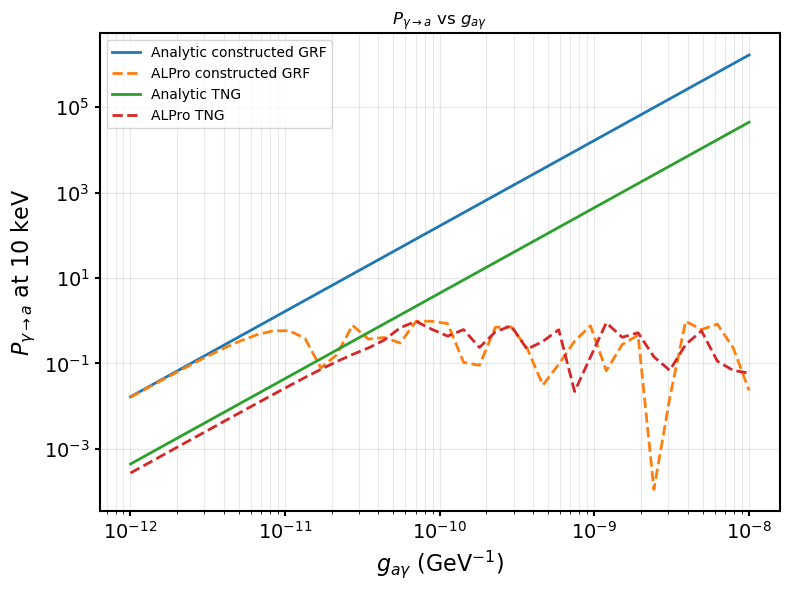

In [41]:
import sys
sys.path.append("/Users/Logan/illustris_python/")
sys.path.append("/Users/Logan/ALPro")

import h5py
import numpy as np
import matplotlib.pyplot as plt
import warnings, os
import alpro

os.environ["ALPRO_QUIET"] = "1"
sys.stdout = open(os.devnull, "w")  # silence chatter

# ============================================================
# Units
# ============================================================
kpc_to_eVinv = 1.5637e26
G_to_eV2     = 1.95e-2
m_p_gram     = 1.6726219e-24
Msun_gram    = 1.98847e33
kpc_cm       = 3.08567758e21

def omega_pl(ne_cm3):
    return 3.69e-11 * np.sqrt(ne_cm3)

ALPRO_RETURNS_SURVIVAL = True

# ============================================================
# 1) TNG radial electron density (volume-weighted)
# ============================================================
def get_tng_radial_ne_profile(filename, N_r_bins=40):
    with h5py.File(filename, "r") as f:
        gas = f["PartType0"]
        coords = gas["Coordinates"][:]          # ckpc/h
        rho_code = gas["Density"][:]            # 1e10 Msun/h / (ckpc/h)^3
        ne_frac  = gas["ElectronAbundance"][:]  # dimless
        masses   = gas["Masses"][:] * 1e10      # Msun

        redshift = float(f["Header"].attrs["Redshift"])
        h        = float(f["Header"].attrs["HubbleParam"])

        try:
            center = f["Subhalo"]["SubhaloPos"][:]   # ckpc/h
        except KeyError:
            center = coords.mean(axis=0)

    coords_kpc = (coords - center) / h / (1 + redshift)
    r_kpc = np.linalg.norm(coords_kpc, axis=1)

    rho_phys  = rho_code * 1e10 * h**2 * (1 + redshift)**3
    rho_g_cm3 = rho_phys * Msun_gram / (kpc_cm**3)
    V_kpc3    = masses / rho_phys
    V_cm3     = V_kpc3 * (kpc_cm**3)

    ne_cell = ne_frac * rho_g_cm3 / m_p_gram     # cm^-3

    r_min = np.min(r_kpc[r_kpc > 0])
    r_max = np.max(r_kpc)
    r_bins = np.logspace(np.log10(r_min), np.log10(r_max), N_r_bins + 1)
    r_centers = 0.5*(r_bins[:-1] + r_bins[1:])

    ne_profile = np.full(N_r_bins, np.nan)
    for i in range(N_r_bins):
        m = (r_kpc >= r_bins[i]) & (r_kpc < r_bins[i+1])
        if np.any(m):
            ne_profile[i] = np.average(ne_cell[m], weights=V_cm3[m])

    valid = np.isfinite(ne_profile)
    if not np.all(valid):
        ne_profile = np.interp(r_centers, r_centers[valid], ne_profile[valid])

    return r_centers, ne_profile

# ============================================================
# 2) Constructed GRF LOS
# ============================================================
def build_constructed_grf_los_cylinder_avg_from_grid(
    filename_for_ne,
    Bx_uG, By_uG, Bz_uG, edges_xyz_kpc,
    x0_kpc=0.0,
    y0_kpc=0.0,
    R_cyl=20.0,
    N_bins=300,
    smooth_window=7,
    keep_only_zpos=True,
):
    r_prof, ne_prof = get_tng_radial_ne_profile(filename_for_ne)

    x_edges, y_edges, z_edges = edges_xyz_kpc
    xc = 0.5 * (x_edges[:-1] + x_edges[1:])
    yc = 0.5 * (y_edges[:-1] + y_edges[1:])
    zc = 0.5 * (z_edges[:-1] + z_edges[1:])

    x3, y3, z3 = np.meshgrid(xc, yc, zc, indexing="ij")
    r3 = np.sqrt(x3**2 + y3**2 + z3**2)
    r_clip = np.clip(r3, r_prof.min(), r_prof.max())
    ne_grid = np.interp(r_clip, r_prof, ne_prof)
    rperp = np.sqrt((x3 - x0_kpc)**2 + (y3 - y0_kpc)**2)
    mask = rperp < R_cyl
    ncell = np.count_nonzero(mask)
    if ncell < 20:
        dx = (x_edges[-1] - x_edges[0]) / len(xc)
        raise RuntimeError(
            f"Constructed-GRF cylinder too thin: {ncell} voxels. "
            f"Increase R_cyl or GRID_N. Current dx ~ {dx:.2f} kpc."
        )

    z_sel  = z3[mask].ravel()
    B_sel  = (By_uG[mask].ravel()) * 1e-6 
    ne_sel = (ne_grid[mask].ravel())    

    # bin in z
    zmin, zmax = z_sel.min(), z_sel.max()
    z_edges_1d = np.linspace(zmin, zmax, N_bins + 1)
    zmid = 0.5 * (z_edges_1d[:-1] + z_edges_1d[1:])

    B_grid  = np.full(N_bins, np.nan)
    ne_out  = np.full(N_bins, np.nan)
    ok      = np.zeros(N_bins, dtype=bool)

    for i in range(N_bins):
        m = (z_sel >= z_edges_1d[i]) & (z_sel < z_edges_1d[i+1])
        if np.any(m):
            B_grid[i] = np.mean(B_sel[m])     # equal-volume weights
            ne_out[i] = np.mean(ne_sel[m])
            ok[i] = True

    if not np.all(ok):
        B_grid = np.interp(zmid, zmid[ok], B_grid[ok])
        ne_out = np.interp(zmid, zmid[ok], ne_out[ok])

    if smooth_window and smooth_window > 1:
        kernel = np.ones(smooth_window)/smooth_window
        B_grid = np.convolve(B_grid, kernel, mode="same")

    if keep_only_zpos:
        mp = zmid >= 0
        zmid = zmid[mp]
        B_grid = B_grid[mp]
        ne_out = ne_out[mp]

    dL_kpc = zmid[1] - zmid[0]
    return zmid, B_grid, ne_out, dL_kpc

# ============================================================
# 3) TNG LOS (volume-weighted cylinder)
# ============================================================
def build_tng_los(filename, R_cyl=20.0, N_bins=300, smooth_window=7):
    with h5py.File(filename,"r") as f:
        gas = f["PartType0"]
        coords = gas["Coordinates"][:]
        rho_code = gas["Density"][:]
        ne_frac  = gas["ElectronAbundance"][:]
        Bvec_uG  = gas["MagneticField"][:]
        masses   = gas["Masses"][:] * 1e10

        redshift = float(f["Header"].attrs["Redshift"])
        h        = float(f["Header"].attrs["HubbleParam"])

        try:
            center = f["Subhalo"]["SubhaloPos"][:]
        except Exception:
            center = coords.mean(axis=0)

    coords_kpc = (coords - center) / (h * (1 + redshift))
    x, y, z = coords_kpc.T
    rperp = np.sqrt(x**2 + y**2)

    rho_phys  = rho_code * 1e10 * h**2 * (1 + redshift)**3
    rho_g_cm3 = rho_phys * Msun_gram / (kpc_cm**3)
    V_kpc3 = masses / rho_phys
    V_cm3 = V_kpc3 * (kpc_cm**3)
    ne_cell = ne_frac * rho_g_cm3 / m_p_gram

    mask = rperp < R_cyl
    z_los  = z[mask]
    ne_los = ne_cell[mask]
    By_los = Bvec_uG[mask][:, 1] * 1e-6
    V_los  = V_cm3[mask]

    order = np.argsort(z_los)
    z_los, ne_los, By_los, V_los = (z_los[order], ne_los[order], By_los[order], V_los[order])

    zmin, zmax = z_los.min(), z_los.max()
    z_edges = np.linspace(zmin, zmax, N_bins + 1)
    zmid = 0.5 * (z_edges[:-1] + z_edges[1:])

    ne_grid = np.full(N_bins, np.nan)
    By_grid = np.full(N_bins, np.nan)
    ok = np.zeros(N_bins, dtype=bool)

    for i in range(N_bins):
        m = (z_los >= z_edges[i]) & (z_los < z_edges[i+1])
        if np.any(m):
            w = V_los[m]
            ne_grid[i] = np.average(ne_los[m], weights=w)
            By_grid[i] = np.average(By_los[m], weights=w)
            ok[i] = True

    if not np.all(ok):
        ne_grid = np.interp(zmid, zmid[ok], ne_grid[ok])
        By_grid = np.interp(zmid, zmid[ok], By_grid[ok])

    if smooth_window and smooth_window > 1:
        kernel = np.ones(smooth_window)/smooth_window
        By_grid = np.convolve(By_grid, kernel, mode="same")

    mp = zmid >= 0
    zpos = zmid[mp]
    nepos = ne_grid[mp]
    B_G = By_grid[mp]

    dL = zpos[1] - zpos[0]
    return zpos, B_G, nepos, dL

# ============================================================
# 4) Analytic P(g) + ALPro P(g)
# ============================================================
def analytic_P_vs_g(garr, B_G, ne_cm3, dL_kpc, m_a, E_eV):
    B_G    = np.asarray(B_G, dtype=float)
    ne_cm3 = np.asarray(ne_cm3, dtype=float)

    dz = dL_kpc * kpc_to_eVinv

    B_eV2 = B_G * G_to_eV2
    Delta_unit = 0.5 * B_eV2

    wpl2 = omega_pl(ne_cm3)**2
    Delta_eff = -(m_a**2 - wpl2) / (2.0 * E_eV)

    phi_left = np.zeros_like(Delta_eff)
    phi_left[1:] = np.cumsum(Delta_eff[:-1]) * dz
    phi_center = phi_left + 0.5 * Delta_eff * dz

    A1 = np.sum(Delta_unit * np.exp(1j * phi_center) * dz)
    C = np.abs(A1)**2

    g_eVinv = garr * 1e-9
    return C * (g_eVinv**2)

def alpro_P_vs_g(garr, B_G, ne_cm3, dL_kpc, m_a, E_eV):
    n = len(B_G)
    Earr = np.array([E_eV])
    out = np.zeros_like(garr)

    for i, g in enumerate(garr):
        s = alpro.Survival("custom")
        s.initialise_domain()

        s.domain.ne = ne_cm3.copy()
        s.domain.deltaL = np.ones(n) * dL_kpc
        s.domain.B = np.abs(B_G)
        s.domain.phi = np.where(B_G >= 0, 0.0, np.pi)

        s.set_params(g=g*1e-9, mass=m_a)
        s.energies = Earr

        P_surv, _ = s.propagate(pol="y")
        if ALPRO_RETURNS_SURVIVAL:
            out[i] = P_surv[0]
        else:
            out[i] = P_surv[0]
    return out

# ============================================================
# 5) Main
# ============================================================
def main():
    filename = "/Users/Logan/Documents/cutout_42631.hdf5"
    global Bx, By, Bz, edges
    if "Bx" not in globals() or "By" not in globals() or "Bz" not in globals() or "edges" not in globals():
        raise RuntimeError(
            "Missing constructed GRF grid in memory.\n"
            "Expected variables: Bx, By, Bz (μG) and edges=[x_edges,y_edges,z_edges] (kpc).\n"
            "If your variables are named differently, alias them before running:\n"
            "  Bx,By,Bz = Bx_syn,By_syn,Bz_syn\n"
            "  edges = edges_syn"
        )

    #parameters
    E_eV = 1e4   # 10 keV
    m_a  = 1e-12
    garr = np.logspace(-12, -8, 40)

    #LoS
    R_cyl = 20.0
    N_bins = 300
    smooth_window = 7

    # ---------------- Constructed GRF -----------------
    z_grf, B_grf, ne_grf, dL_grf = build_constructed_grf_los_cylinder_avg_from_grid(
        filename_for_ne=filename,
        Bx_uG=Bx, By_uG=By, Bz_uG=Bz,
        edges_xyz_kpc=edges,
        x0_kpc=0.0, y0_kpc=0.0,
        R_cyl=R_cyl,
        N_bins=N_bins,
        smooth_window=smooth_window,
        keep_only_zpos=True,
    )

    P_grf_ana  = analytic_P_vs_g(garr, B_grf, ne_grf, dL_grf, m_a, E_eV)
    P_grf_alpr = alpro_P_vs_g(garr, B_grf, ne_grf, dL_grf, m_a, E_eV)

    # ----------------- TNG MHD LOS ---------------------------
    z_tng, B_tng, ne_tng, dL_tng = build_tng_los(
        filename, R_cyl=R_cyl, N_bins=N_bins, smooth_window=smooth_window
    )

    P_tng_ana  = analytic_P_vs_g(garr, B_tng, ne_tng, dL_tng, m_a, E_eV)
    P_tng_alpr = alpro_P_vs_g(garr, B_tng, ne_tng, dL_tng, m_a, E_eV)
    plt.figure(figsize=(8, 6))
    plt.loglog(garr, P_grf_ana,   label="Analytic constructed GRF", lw=2)
    plt.loglog(garr, P_grf_alpr, "--", label="ALPro constructed GRF", lw=2)

    plt.loglog(garr, P_tng_ana,   label="Analytic TNG", lw=2)
    plt.loglog(garr, P_tng_alpr, "--", label="ALPro TNG", lw=2)

    plt.xlabel(r"$g_{a\gamma}$ (GeV$^{-1}$)")
    plt.ylabel(rf"$P_{{\gamma\to a}}$ at {E_eV/1e3:.0f} keV")
    plt.title(r"$P_{\gamma\to a}$ vs $g_{a\gamma}$")
    plt.grid(True, which="both", alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

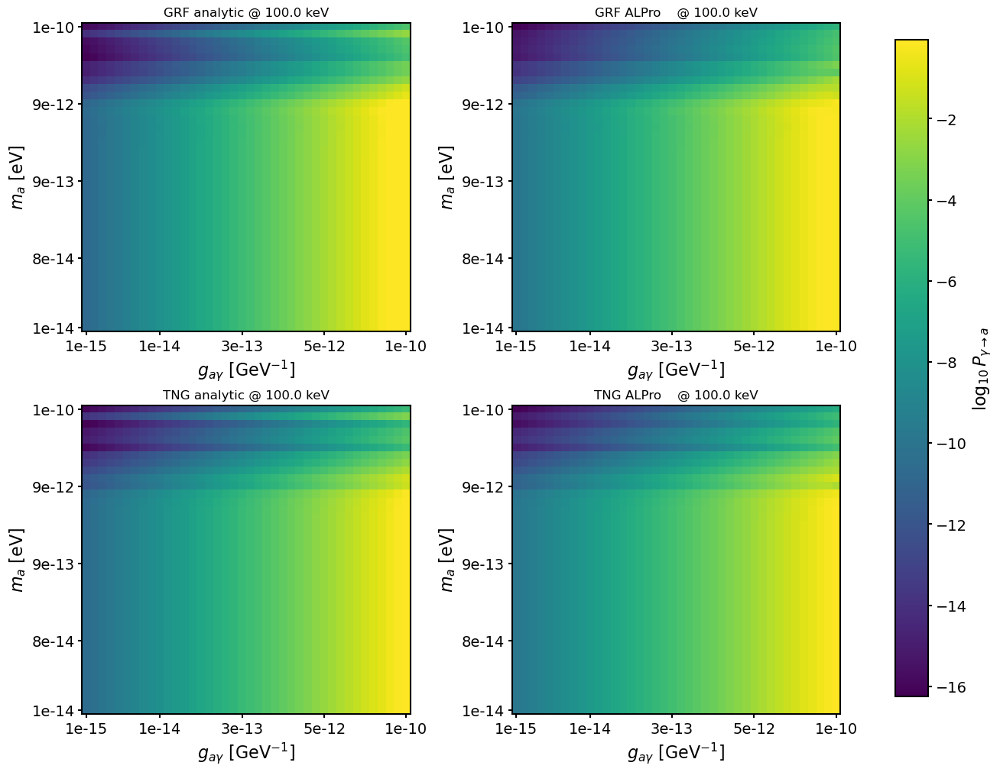

In [43]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import alpro
os.environ["ALPRO_QUIET"] = "1"
sys.stdout = open(os.devnull, "w")  # silence chatter
tng_filename = "/Users/Logan/Documents/cutout_42631.hdf5"

E_keV = 100.0
E_eV  = E_keV * 1e3

N_ma = 40
N_g  = 40
ma_grid_eV = np.logspace(-14, -10, N_ma)   # eV
g_grid_GeV = np.logspace(-15, -10, N_g)    # GeV^-1

#LoS geometry
x0_kpc = 0.0
y0_kpc = 0.0
R_cyl  = 80.0
R_max  = 150.0
N_bins = 250
smooth_window = 7

ALPRO_RETURNS_SURVIVAL = True

# ============================================================
# Units / constants
# ============================================================
kpc_to_eVinv = 1.5637e26
G_to_eV2     = 1.95e-2
m_p_gram     = 1.6726219e-24
Msun_gram    = 1.98847e33
kpc_cm       = 3.08567758e21

def omega_pl(ne_cm3):
    return 3.69e-11 * np.sqrt(ne_cm3)
need = ["Bx", "By", "Bz", "edges"]
missing = [k for k in need if k not in globals()]
if missing:
    raise RuntimeError(
        f"Missing {missing} in memory.\n"
        "Expected: Bx, By, Bz (μG) and edges=[x_edges,y_edges,z_edges] (kpc) from the IAAFT cell."
    )

Bx = np.asarray(Bx, float)
By = np.asarray(By, float)
Bz = np.asarray(Bz, float)
x_edges, y_edges, z_edges = edges

xc = 0.5*(x_edges[:-1] + x_edges[1:])
yc = 0.5*(y_edges[:-1] + y_edges[1:])
zc = 0.5*(z_edges[:-1] + z_edges[1:])

x3, y3, z3 = np.meshgrid(xc, yc, zc, indexing="ij")

# ============================================================
# Load TNG and By to the same grid
#       , build ne(z) by cylinder-avg in z bins (volume-weighted)
# ============================================================
def load_tng_arrays_for_ne_and_B(filename, XH_default=0.76):
    with h5py.File(filename, "r") as f:
        gas = f["PartType0"]
        coords_ckpc_h = gas["Coordinates"][:]
        rho_code      = gas["Density"][:]
        ne_frac       = gas["ElectronAbundance"][:]
        masses_code   = gas["Masses"][:]
        B_vec_uG      = gas["MagneticField"][:]

        if "GFM_Metals" in gas:
            XH = gas["GFM_Metals"][:, 0]
        else:
            XH = np.full_like(ne_frac, float(XH_default))

        z = float(f["Header"].attrs["Redshift"])
        h = float(f["Header"].attrs["HubbleParam"])
        try:
            center_ckpc_h = f["Subhalo"]["SubhaloPos"][:]
        except Exception:
            center_ckpc_h = coords_ckpc_h.mean(axis=0)

    coords_kpc = (coords_ckpc_h - center_ckpc_h) / h / (1.0 + z)
    x, y, zz = coords_kpc.T
    rho_phys = rho_code * 1e10 * h**2 * (1.0 + z)**3
    rho_g_cm3 = rho_phys * Msun_gram / (kpc_cm**3)
    masses_Msun = masses_code * 1e10
    V_kpc3 = masses_Msun / rho_phys
    V_cm3  = V_kpc3 * (kpc_cm**3)
    ne_cm3 = ne_frac * XH * rho_g_cm3 / m_p_gram

    By_uG = B_vec_uG[:, 1]
    return x, y, zz, ne_cm3, By_uG, V_cm3

def deposit_scalar_to_grid(coords_kpc, values, edges):
    counts, _ = np.histogramdd(coords_kpc, bins=edges)
    sums, _   = np.histogramdd(coords_kpc, bins=edges, weights=values)
    counts = counts.astype(float)
    counts[counts == 0] = np.nan
    grid = np.nan_to_num(sums / counts, nan=0.0)
    return grid, np.nan_to_num(counts, nan=0.0)

xt, yt, zt, ne_tng_cell, By_tng_cell_uG, V_tng = load_tng_arrays_for_ne_and_B(tng_filename)
coords_tng = np.vstack([xt, yt, zt]).T

By_tng_grid_uG, _ = deposit_scalar_to_grid(coords_tng, By_tng_cell_uG, edges)

# ============================================================
# Build matched cylinder-avg LoS B(z)
# ============================================================
def build_los_B_from_grid(By_uG, x3, y3, z3, x0, y0, R_cyl, R_max, N_bins, smooth_window):
    R_perp = np.sqrt((x3 - x0)**2 + (y3 - y0)**2)
    m = (R_perp < R_cyl) & (np.abs(z3) <= R_max)
    if np.count_nonzero(m) < 50:
        raise RuntimeError("Grid cylinder mask too empty. Increase R_cyl or GRID_N.")

    z_sel = z3[m].ravel()
    B_sel = (By_uG[m].ravel()) * 1e-6

    z_edges = np.linspace(-R_max, R_max, N_bins + 1)
    z_mid   = 0.5*(z_edges[:-1] + z_edges[1:])

    B_bin = np.full(N_bins, np.nan)
    ok    = np.zeros(N_bins, bool)

    for i in range(N_bins):
        mb = (z_sel >= z_edges[i]) & (z_sel < z_edges[i+1])
        if np.any(mb):
            B_bin[i] = np.mean(B_sel[mb])
            ok[i] = True

    if np.count_nonzero(ok) < 10:
        raise RuntimeError("Too few populated z bins. Increase R_cyl or reduce N_bins.")

    if not np.all(ok):
        B_bin = np.interp(z_mid, z_mid[ok], B_bin[ok])

    if smooth_window and smooth_window > 1:
        ker = np.ones(smooth_window)/smooth_window
        B_bin = np.convolve(B_bin, ker, mode="same")

    mp = z_mid >= 0
    z_pos = z_mid[mp]
    B_pos = B_bin[mp]
    dL_kpc = z_pos[1] - z_pos[0]
    return z_pos, B_pos, dL_kpc

# ============================================================
# Build cylinder-avg LoS ne(z) from TNG CELLS
# (volume-weighted)
# ============================================================
def build_los_ne_from_tng_cells(xt, yt, zt, ne_cell, V_cm3, x0, y0, R_cyl, R_max, N_bins):
    R_perp = np.sqrt((xt - x0)**2 + (yt - y0)**2)
    m = (R_perp < R_cyl) & (np.abs(zt) <= R_max)
    if np.count_nonzero(m) < 100:
        raise RuntimeError("TNG cylinder too empty. Increase R_cyl or reduce R_max.")

    z_sel  = zt[m]
    ne_sel = ne_cell[m]
    w_sel  = V_cm3[m]

    z_edges = np.linspace(-R_max, R_max, N_bins + 1)
    z_mid   = 0.5*(z_edges[:-1] + z_edges[1:])

    ne_bin = np.full(N_bins, np.nan)
    ok     = np.zeros(N_bins, bool)

    for i in range(N_bins):
        mb = (z_sel >= z_edges[i]) & (z_sel < z_edges[i+1])
        if np.any(mb):
            ne_bin[i] = np.average(ne_sel[mb], weights=w_sel[mb])
            ok[i] = True

    if np.count_nonzero(ok) < 10:
        raise RuntimeError("Too few populated ne(z) bins. Increase R_cyl or reduce N_bins.")

    if not np.all(ok):
        ne_bin = np.interp(z_mid, z_mid[ok], ne_bin[ok])

    mp = z_mid >= 0
    z_pos  = z_mid[mp]
    ne_pos = ne_bin[mp]
    return z_pos, ne_pos

# Build LoS arrays
z_grf, B_grf_G, dL_kpc = build_los_B_from_grid(By, x3, y3, z3, x0_kpc, y0_kpc, R_cyl, R_max, N_bins, smooth_window)
z_tng, B_tng_G, _      = build_los_B_from_grid(By_tng_grid_uG, x3, y3, z3, x0_kpc, y0_kpc, R_cyl, R_max, N_bins, smooth_window)

z_ne, ne_los_cm3 = build_los_ne_from_tng_cells(xt, yt, zt, ne_tng_cell, V_tng, x0_kpc, y0_kpc, R_cyl, R_max, N_bins)

#ensure same length
n = min(len(B_grf_G), len(B_tng_G), len(ne_los_cm3))
B_grf_G = B_grf_G[:n]
B_tng_G = B_tng_G[:n]
ne_los_cm3 = ne_los_cm3[:n]

# ============================================================
# Probabilities
# ============================================================
def analytic_P_final(B_G, ne_cm3, dL_kpc, g_GeVinv, m_a_eV, E_eV):
    dz = dL_kpc * kpc_to_eVinv
    g_eVinv = g_GeVinv * 1e-9

    B_G    = np.asarray(B_G, float)
    ne_cm3 = np.asarray(ne_cm3, float)

    Delta_ag = 0.5 * g_eVinv * (B_G * G_to_eV2)
    wpl2 = omega_pl(ne_cm3)**2
    Delta_eff = -(m_a_eV**2 - wpl2) / (2.0 * E_eV)

    phi_left = np.zeros_like(Delta_eff)
    phi_left[1:] = np.cumsum(Delta_eff[:-1]) * dz
    phi_center = phi_left + 0.5 * Delta_eff * dz

    A = np.sum(Delta_ag * np.exp(1j * phi_center) * dz)
    return np.abs(A)**2

def alpro_P_final(B_G, ne_cm3, dL_kpc, g_GeVinv, m_a_eV, E_eV):
    B_G    = np.asarray(B_G, float)
    ne_cm3 = np.asarray(ne_cm3, float)

    s = alpro.Survival("custom")
    s.initialise_domain()

    s.domain.ne     = ne_cm3.copy()
    s.domain.deltaL = np.ones(len(B_G)) * dL_kpc

    s.domain.B   = np.abs(B_G)
    s.domain.phi = np.where(B_G >= 0.0, 0.0, np.pi)

    s.set_params(g=g_GeVinv * 1e-9, mass=m_a_eV)
    s.energies = np.array([E_eV], dtype=float)

    P_out, _ = s.propagate(pol="y")
    P_surv = float(P_out[0])
    return (P_surv) if ALPRO_RETURNS_SURVIVAL else P_surv

def compute_maps(B_G):
    P_ana = np.zeros((len(ma_grid_eV), len(g_grid_GeV)))
    P_alp = np.zeros_like(P_ana)

    for i, m_a in enumerate(ma_grid_eV):
        for j, g in enumerate(g_grid_GeV):
            P_ana[i, j] = analytic_P_final(B_G, ne_los_cm3, dL_kpc, g, m_a, E_eV)
            P_alp[i, j] = alpro_P_final  (B_G, ne_los_cm3, dL_kpc, g, m_a, E_eV)
    return P_ana, P_alp

print(f"Computing heatmaps at E={E_keV:.1f} keV (4 maps of {N_ma}x{N_g}) ...")
P_grf_ana, P_grf_alp = compute_maps(B_grf_G)
P_tng_ana, P_tng_alp = compute_maps(B_tng_G)

# ============================================================
# Plot
# ============================================================
def plot_heat(ax, P, title):
    Pp = np.clip(P, 1e-60, 1.0)
    im = ax.imshow(np.log10(Pp), origin="lower", aspect="auto", interpolation="nearest")
    ax.set_title(title)
    return im

def set_log_ticks(ax, x_arr, y_arr, n=5):
    ix = np.linspace(0, len(x_arr)-1, n).astype(int)
    iy = np.linspace(0, len(y_arr)-1, n).astype(int)
    ax.set_xticks(ix); ax.set_xticklabels([f"{x_arr[i]:.0e}" for i in ix])
    ax.set_yticks(iy); ax.set_yticklabels([f"{y_arr[i]:.0e}" for i in iy])
    ax.set_xlabel(r"$g_{a\gamma}$ [GeV$^{-1}$]")
    ax.set_ylabel(r"$m_a$ [eV]")

fig, axs = plt.subplots(2, 2, figsize=(13, 10), constrained_layout=True)

im00 = plot_heat(axs[0,0], P_grf_ana, f"GRF analytic @ {E_keV:.1f} keV")
im01 = plot_heat(axs[0,1], P_grf_alp, f"GRF ALPro    @ {E_keV:.1f} keV")
im10 = plot_heat(axs[1,0], P_tng_ana, f"TNG analytic @ {E_keV:.1f} keV")
im11 = plot_heat(axs[1,1], P_tng_alp, f"TNG ALPro    @ {E_keV:.1f} keV")

for ax in axs.ravel():
    set_log_ticks(ax, g_grid_GeV, ma_grid_eV, n=5)

cbar = fig.colorbar(im11, ax=axs.ravel().tolist(), shrink=0.95)
cbar.set_label(r"$\log_{10} P_{\gamma\to a}$")
plt.show()

print("LoS sanity:")
print("  n =", n, " dL_kpc =", dL_kpc)
print("  Brms GRF (G) =", float(np.sqrt(np.mean(B_grf_G**2))))
print("  Brms TNG (G) =", float(np.sqrt(np.mean(B_tng_G**2))))
print("  ne range (cm^-3) =", (float(np.min(ne_los_cm3)), float(np.max(ne_los_cm3))))

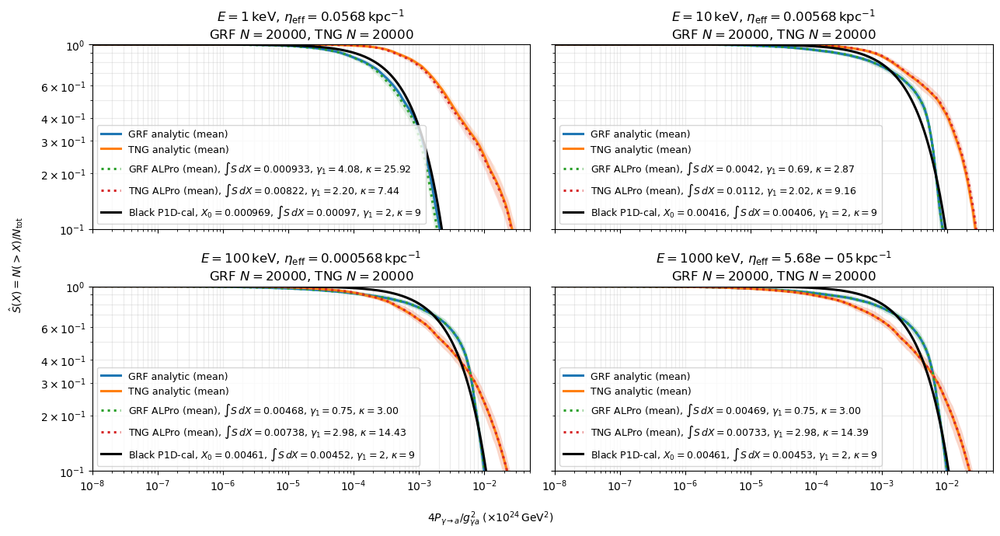

In [31]:
import sys
sys.path.append("/Users/Logan/illustris_python/")
sys.path.append("/Users/Logan/ALPro")

import os
import numpy as np
import h5py
import matplotlib.pyplot as plt
import alpro

os.environ["ALPRO_QUIET"] = "1"
sys.stdout = open(os.devnull, "w")  # silence chatter

# ----------------------------
# Constants / float64
# ----------------------------
kpc_to_eVinv = np.float64(1.5637e26)
G_to_eV2     = np.float64(1.95e-2)
m_p_gram     = np.float64(1.6726219e-24)
Msun_gram    = np.float64(1.98847e33)
kpc_cm       = np.float64(3.08567758e21)
P_MAX_WEAK = 0.1

def omega_pl(ne_cm3):
    ne_cm3 = np.asarray(ne_cm3, dtype=np.float64)
    return np.float64(3.69e-11) * np.sqrt(ne_cm3)
FILENAME = "/Users/Logan/Documents/cutout_42631.hdf5"
GRID_N   = 70 * 4
N_K_BINS = 40
SEED     = 1
R0_KPC   = 24.0
ENERGIES_KEV = [1, 10, 100, 1000]

# LoS geometry
R_max         = np.float64(200.0)
b_max         = np.float64(80.0)
N_bins_los    = 200
smooth_window = 5

# Monte-Carlo batches
N_batches         = 100
N_grf_per_batch   = 200
N_tng_per_batch   = 200
base_seed         = 12345
MAX_ATTEMPTS_MULT = 200  # grid LoS is cheaper; we can be stricter if needed
XMIN_PLOT = 1e-8
XMAX_PLOT = 5e-2
N_GRID    = 200
# ALP parameters
g   = np.float64(1e-14)
m_a = np.float64(1e-12)
# ============================================================
# TNG
# ============================================================
def get_center(f, coords):
    try:
        c = f["Subhalo"]["SubhaloPos"][:]
        c = np.asarray(c, dtype=np.float64).squeeze()
        if c.size == 3:
            return c
    except Exception:
        pass
    return np.asarray(coords, dtype=np.float64).mean(axis=0)

def get_header_units_cgs(f):
    a = f["Header"].attrs
    keys = ("UnitLength_in_cm", "UnitMass_in_g", "UnitVelocity_in_cm_per_s")
    if all(k in a for k in keys):
        return np.float64(a[keys[0]]), np.float64(a[keys[1]]), np.float64(a[keys[2]])
    return None

def B_code_to_G_factor(f, assume_B_is_comoving=True, include_sqrt4pi=False):
    units = get_header_units_cgs(f)
    if units is None:
        raise RuntimeError("Missing Header unit attrs for B conversion.")
    l_unit, m_unit, v_unit = units
    B_unit = v_unit * np.sqrt(m_unit) / (l_unit ** np.float64(1.5))
    if include_sqrt4pi:
        B_unit *= np.sqrt(np.float64(4.0) * np.pi)

    z = np.float64(f["Header"].attrs["Redshift"])
    a = np.float64(1.0) / (np.float64(1.0) + z)
    if assume_B_is_comoving:
        B_unit *= (np.float64(1.0) / (a*a))  # (1+z)^2
    return np.float64(B_unit)

def load_tng_particles(filename, XH_default=0.76,
                       assume_B_is_comoving=True, include_sqrt4pi=False):
    with h5py.File(filename, "r") as f:
        gas = f["PartType0"]
        coords   = np.asarray(gas["Coordinates"][:], dtype=np.float64)  # ckpc/h
        rho_code = np.asarray(gas["Density"][:], dtype=np.float64)
        ne_frac  = np.asarray(gas["ElectronAbundance"][:], dtype=np.float64)
        masses   = np.asarray(gas["Masses"][:], dtype=np.float64)
        B_vec    = np.asarray(gas["MagneticField"][:], dtype=np.float64)

        if "GFM_Metals" in gas:
            XH = np.asarray(gas["GFM_Metals"][:, 0], dtype=np.float64)
        else:
            XH = np.full_like(ne_frac, np.float64(XH_default))

        z = np.float64(f["Header"].attrs["Redshift"])
        h = np.float64(f["Header"].attrs["HubbleParam"])
        center = get_center(f, coords)

        B_unit_G = B_code_to_G_factor(
            f, assume_B_is_comoving=assume_B_is_comoving, include_sqrt4pi=include_sqrt4pi
        )
    coords_kpc = (coords - center) / (h * (np.float64(1.0) + z))
    x, y, zz = coords_kpc.T
    r_kpc = np.sqrt(x*x + y*y + zz*zz)
    rho_phys  = rho_code * np.float64(1e10) * (h*h) * ((np.float64(1.0) + z)**3)  # Msun/kpc^3
    rho_phys  = np.clip(rho_phys, np.float64(0.0), np.float64(1e300))
    rho_g_cm3 = rho_phys * Msun_gram / (kpc_cm**3)
    masses_Msun = masses * np.float64(1e10) / h
    rho_phys_safe = np.maximum(rho_phys, np.float64(1e-300))
    V_kpc3 = masses_Msun / rho_phys_safe
    V_kpc3 = np.clip(V_kpc3, np.float64(0.0), np.float64(1e300))
    V_cm3  = V_kpc3 * (kpc_cm**3)
    ne_cm3 = ne_frac * XH * rho_g_cm3 / m_p_gram
    By_G   = (B_vec[:, 1] * B_unit_G).astype(np.float64)
    return coords_kpc.astype(np.float64), r_kpc.astype(np.float64), ne_cm3.astype(np.float64), By_G, V_cm3.astype(np.float64)
# ============================================================
# Env flattening: rms(By) in radial bins
# ============================================================
def radial_envelope_rms_By(r_kpc, By_G, weights_cm3, Rmax_kpc, Nr_bins=40):
    r_kpc = np.asarray(r_kpc, np.float64)
    By_G  = np.asarray(By_G,  np.float64)
    w     = np.asarray(weights_cm3, np.float64)
    Rmax_kpc = np.float64(Rmax_kpc)
    rmin = np.float64(1.0)
    r_bins = np.logspace(np.log10(rmin), np.log10(Rmax_kpc), int(Nr_bins) + 1)
    r_cent = np.float64(0.5) * (r_bins[:-1] + r_bins[1:])
    dig = np.digitize(r_kpc, r_bins)
    env = np.full(int(Nr_bins), np.nan, dtype=np.float64)
    ok  = np.zeros(int(Nr_bins), dtype=bool)

    for i in range(int(Nr_bins)):
        m = (dig == (i + 1))
        if np.any(m):
            ww = w[m]
            # rms(By) = sqrt( <By^2>_w )
            env[i] = np.sqrt(np.average(By_G[m]**2, weights=ww))
            ok[i] = np.isfinite(env[i]) and (env[i] > 0)
    m = ok & np.isfinite(env) & (env > 0)
    if np.count_nonzero(m) < 5:
        raise RuntimeError("Too few valid bins in rms(By) envelope.")
    return r_cent[m], env[m]

def flatten_By_by_envelope(r_kpc, By_G, r_env, env_rms_By, r0_kpc):
    r_kpc = np.asarray(r_kpc, np.float64)
    By_G  = np.asarray(By_G,  np.float64)
    ref = np.interp(np.float64(r0_kpc), r_env, env_rms_By)
    env_cell = np.interp(r_kpc, r_env, env_rms_By, left=np.nan, right=np.nan)
    good = np.isfinite(env_cell) & (env_cell > 0) & np.isfinite(By_G)
    corr = np.ones_like(env_cell, dtype=np.float64)
    corr[good] = (np.float64(ref) / env_cell[good])
    By_flat = np.zeros_like(By_G)
    By_flat[good] = By_G[good] * corr[good]
    return By_flat.astype(np.float64), good
# ============================================================
# Grid (volume-weighted)
# ============================================================
def make_uniform_edges(coords_kpc, N):
    mins = coords_kpc.min(axis=0).astype(np.float64)
    maxs = coords_kpc.max(axis=0).astype(np.float64)
    edges = [
        np.linspace(mins[0], maxs[0], int(N)+1, dtype=np.float64),
        np.linspace(mins[1], maxs[1], int(N)+1, dtype=np.float64),
        np.linspace(mins[2], maxs[2], int(N)+1, dtype=np.float64),
    ]
    L = (maxs - mins).astype(np.float64)
    return edges, L

def deposit_weighted_scalar(coords_kpc, vals, weights, edges):
    coords_kpc = np.asarray(coords_kpc, np.float64)
    vals       = np.asarray(vals, np.float64)
    weights    = np.asarray(weights, np.float64)
    wsum, _ = np.histogramdd(coords_kpc, bins=edges, weights=weights)
    vsum, _ = np.histogramdd(coords_kpc, bins=edges, weights=weights * vals)
    wsum = wsum.astype(np.float64)
    wsum[wsum == 0] = np.nan
    grid = np.nan_to_num(vsum / wsum, nan=0.0).astype(np.float64)
    return grid

def voxel_centers(edges):
    xc = np.float64(0.5) * (edges[0][:-1] + edges[0][1:])
    yc = np.float64(0.5) * (edges[1][:-1] + edges[1][1:])
    zc = np.float64(0.5) * (edges[2][:-1] + edges[2][1:])
    return xc, yc, zc
# ============================================================
# k-grid + spectrum + GRF building to get SCALAR By
# ============================================================
def k_grid(N, Lx, Ly, Lz):
    dx, dy, dz = np.float64(Lx)/N, np.float64(Ly)/N, np.float64(Lz)/N
    kx = np.float64(2.0*np.pi) * np.fft.fftfreq(N, d=float(dx))
    ky = np.float64(2.0*np.pi) * np.fft.fftfreq(N, d=float(dy))
    kz = np.float64(2.0*np.pi) * np.fft.fftfreq(N, d=float(dz))
    kxg, kyg, kzg = np.meshgrid(kx, ky, kz, indexing="ij")
    kmag = np.sqrt(kxg**2 + kyg**2 + kzg**2).astype(np.float64)
    return kxg.astype(np.float64), kyg.astype(np.float64), kzg.astype(np.float64), kmag
def isotropic_binned_Pk_scalar(field, Lx, Ly, Lz, k_edges, demean=True):
    f = np.asarray(field, np.float64)
    if demean:
        f = f - np.mean(f)
    fk = np.fft.fftn(f)
    power = np.abs(fk)**2
    _, _, _, kmag = k_grid(f.shape[0], Lx, Ly, Lz)
    k_flat = kmag.ravel()
    p_flat = power.ravel()
    mpos = k_flat > 0
    k_flat = k_flat[mpos]
    p_flat = p_flat[mpos]
    k_cent = np.float64(0.5) * (k_edges[:-1] + k_edges[1:])
    Pk = np.full_like(k_cent, np.nan, dtype=np.float64)
    for i in range(len(k_cent)):
        m = (k_flat >= k_edges[i]) & (k_flat < k_edges[i+1])
        if np.any(m):
            Pk[i] = np.mean(p_flat[m])

    return k_cent, Pk

def synthesize_scalar_grf_from_binned_Pk(kmag, k_edges, Pk_bins, rng, eps=1e-30):
    N = kmag.shape[0]
    fk = np.zeros((N, N, N), dtype=np.complex128)

    for i in range(len(Pk_bins)):
        Ptar = Pk_bins[i]
        if not (np.isfinite(Ptar) and Ptar > 0):
            continue
        kmin, kmax = k_edges[i], k_edges[i+1]
        m = (kmag >= kmin) & (kmag < kmax) & (kmag > 0)
        if not np.any(m):
            continue

        fk[m] = rng.normal(size=m.sum()) + 1j * rng.normal(size=m.sum())
        Pcur = np.mean(np.abs(fk[m])**2)
        if Pcur > eps:
            fk[m] *= np.sqrt(Ptar / Pcur)

    fk[0,0,0] = 0.0
    return fk
# ============================================================
#LoS from grid
# ============================================================
def trilinear_sample(grid, edges, x, y, z):
    x_edges, y_edges, z_edges = edges
    Nx, Ny, Nz = grid.shape
    x = np.asarray(x, np.float64)
    y = np.asarray(y, np.float64)
    z = np.asarray(z, np.float64)
    x0, x1 = x_edges[0], x_edges[-1]
    y0, y1 = y_edges[0], y_edges[-1]
    z0, z1 = z_edges[0], z_edges[-1]
    out = (x < x0) | (x > x1) | (y < y0) | (y > y1) | (z < z0) | (z > z1)
    vals = np.full_like(x, np.nan, dtype=np.float64)
    if np.all(out):
        return vals
    dx = np.float64((x_edges[-1] - x_edges[0]) / Nx)
    dy = np.float64((y_edges[-1] - y_edges[0]) / Ny)
    dz = np.float64((z_edges[-1] - z_edges[0]) / Nz)
    fx = (x - x_edges[0]) / dx
    fy = (y - y_edges[0]) / dy
    fz = (z - z_edges[0]) / dz
    ix = np.floor(fx).astype(int)
    iy = np.floor(fy).astype(int)
    iz = np.floor(fz).astype(int)
    ix = np.clip(ix, 0, Nx-2)
    iy = np.clip(iy, 0, Ny-2)
    iz = np.clip(iz, 0, Nz-2)
    tx = fx - ix
    ty = fy - iy
    tz = fz - iz
    c000 = grid[ix,   iy,   iz  ]
    c100 = grid[ix+1, iy,   iz  ]
    c010 = grid[ix,   iy+1, iz  ]
    c110 = grid[ix+1, iy+1, iz  ]
    c001 = grid[ix,   iy,   iz+1]
    c101 = grid[ix+1, iy,   iz+1]
    c011 = grid[ix,   iy+1, iz+1]
    c111 = grid[ix+1, iy+1, iz+1]
    c00 = c000*(1-tx) + c100*tx
    c10 = c010*(1-tx) + c110*tx
    c01 = c001*(1-tx) + c101*tx
    c11 = c011*(1-tx) + c111*tx
    c0 = c00*(1-ty) + c10*ty
    c1 = c01*(1-ty) + c11*ty
    v = c0*(1-tz) + c1*tz
    v = v.astype(np.float64)
    v[out] = np.nan
    return v

def build_los_from_grids(By_G_grid, ne_cm3_grid, edges,
                         x0, y0, R_max, N_bins, smooth_window=0, min_valid=0.7):
    z_edges = np.linspace(-float(R_max), float(R_max), int(N_bins) + 1, dtype=np.float64)
    z_mid   = np.float64(0.5) * (z_edges[:-1] + z_edges[1:])

    x = np.full_like(z_mid, np.float64(x0))
    y = np.full_like(z_mid, np.float64(y0))
    z = z_mid

    B = trilinear_sample(By_G_grid, edges, x, y, z)
    ne = trilinear_sample(ne_cm3_grid, edges, x, y, z)

    ok = np.isfinite(B) & np.isfinite(ne)
    if np.mean(ok) < np.float64(min_valid):
        return None
    if not np.all(ok):
        ii = np.arange(z_mid.size)
        B  = np.interp(ii, ii[ok], B[ok]).astype(np.float64)
        ne = np.interp(ii, ii[ok], ne[ok]).astype(np.float64)
    if smooth_window and smooth_window > 1:
        ker = np.ones(int(smooth_window), dtype=np.float64) / np.float64(smooth_window)
        B = np.convolve(B, ker, mode="same").astype(np.float64)
    mp = z_mid >= 0
    r_pos  = z_mid[mp]
    B_pos  = B[mp]
    ne_pos = ne[mp]
    if r_pos.size < 5:
        return None
    dL_kpc = np.float64(r_pos[1] - r_pos[0])
    return r_pos, B_pos, ne_pos, dL_kpc

def sample_impact_parameter(rng, b_max):
    b  = np.float64(b_max) * np.sqrt(rng.random())
    th = np.float64(2.0*np.pi) * rng.random()
    return b*np.cos(th), b*np.sin(th)


# ============================================================
# Conv Probabilities
# ============================================================
def analytic_P_final(By_G, ne_cm3, dL_kpc, g_GeVinv, m_a_eV, E_eV):
    dz = np.float64(dL_kpc) * kpc_to_eVinv
    g_eVinv = np.float64(g_GeVinv) * np.float64(1e-9)

    By_G  = np.asarray(By_G,  np.float64)
    ne_cm3 = np.asarray(ne_cm3, np.float64)

    Delta_ag  = np.float64(0.5) * g_eVinv * (By_G * G_to_eV2)
    wpl2      = omega_pl(ne_cm3)**2
    Delta_eff = -(np.float64(m_a_eV)**2 - wpl2) / (np.float64(2.0) * np.float64(E_eV))

    phi_left = np.zeros_like(Delta_eff)
    phi_left[1:] = np.cumsum(Delta_eff[:-1]) * dz
    phi_center = phi_left + np.float64(0.5) * Delta_eff * dz

    A = np.sum(Delta_ag * np.exp(1j*phi_center) * dz)
    return np.abs(A)**2

def alpro_P_final_conversion(By_G, ne_cm3, dL_kpc, g_GeVinv, m_a_eV, E_eV):
    """
    ALPro with signed By encoded as phi=0 or pi and B=|By|.
    """
    s = alpro.Survival("custom")
    s.initialise_domain()
    By_G  = np.asarray(By_G,  np.float64)
    ne_cm3 = np.asarray(ne_cm3, np.float64)
    s.domain.B      = np.abs(By_G)
    s.domain.phi    = np.where(By_G >= 0, 0.0, np.pi)
    s.domain.ne     = ne_cm3.copy()
    s.domain.deltaL = np.ones(len(By_G), dtype=np.float64) * np.float64(dL_kpc)
    s.set_params(g=np.float64(g_GeVinv)*np.float64(1e-9), mass=np.float64(m_a_eV))
    s.energies = np.array([np.float64(E_eV)], dtype=np.float64)
    P_conv, _ = s.propagate(pol="y")
    return np.float64(P_conv[0])
# ============================================================
# Tail curves and mean
# ============================================================
def tail_curve_frac(X):
    X = np.asarray(X, np.float64)
    X = X[np.isfinite(X) & (X > 0)]
    Xs = np.sort(X)
    N  = Xs.size
    if N == 0:
        return Xs, Xs
    Sf = np.arange(N, 0, -1, dtype=np.float64) / np.float64(N)
    return Xs, Sf

def mean_tail_curve(curves_XS, x_min, x_max, n_grid=260):
    x_grid = np.logspace(np.log10(x_min), np.log10(x_max), int(n_grid))
    S_stack = []

    for X, S in curves_XS:
        X = np.asarray(X, np.float64)
        S = np.asarray(S, np.float64)
        m = np.isfinite(X) & np.isfinite(S) & (X > 0)
        X = X[m]; S = S[m]
        if X.size < 2:
            continue
        o = np.argsort(X)
        X = X[o]; S = S[o]
        Sg = np.interp(x_grid, X, S, left=1.0, right=np.nan)  # Option 1
        S_stack.append(Sg)
    if len(S_stack) == 0:
        raise RuntimeError("No valid curves in mean_tail_curve().")
    S_stack = np.vstack(S_stack)
    keep = ~np.all(np.isnan(S_stack), axis=0)
    x_grid = x_grid[keep]
    S_stack = S_stack[:, keep]
    S_mean = np.nanmean(S_stack, axis=0)
    S_p16  = np.nanpercentile(S_stack, 16, axis=0)
    S_p84  = np.nanpercentile(S_stack, 84, axis=0)
    return x_grid, S_mean, S_p16, S_p84

def integral_on_range(x, y, xmin, xmax):
    x = np.asarray(x, np.float64)
    y = np.asarray(y, np.float64)
    m = np.isfinite(x) & np.isfinite(y) & (x >= xmin) & (x <= xmax)
    x = x[m]; y = y[m]
    if x.size < 2:
        return np.nan
    return np.float64(np.trapz(y, x))

def skewness_kurtosis(x):
    x = np.asarray(x, np.float64)
    x = x[np.isfinite(x)]
    if x.size < 5:
        return np.nan, np.nan, np.nan
    mu = np.mean(x)
    sig = np.std(x, ddof=0)
    if sig == 0:
        return np.nan, np.nan, np.nan
    z = (x - mu) / sig
    skew = np.mean(z**3)
    kurt = np.mean(z**4)
    return float(skew), float(kurt), float(kurt - 3.0)
# ============================================================
# Black curve (P1D-cal) from GRF grid
# ============================================================
def eta_eff_kpcinv(E_eV, m_a_eV, ne_cm3):
    ne_cm3 = np.asarray(ne_cm3, np.float64)
    wpl2 = omega_pl(ne_cm3)**2
    Delta_eff_eV = np.abs(-(np.float64(m_a_eV)**2 - wpl2) / (np.float64(2.0) * np.float64(E_eV)))
    return np.float64(np.mean(Delta_eff_eV) * kpc_to_eVinv)

def p1d_from_grid_component_along_z(By_uG_grid, edges_xyz_kpc, subtract_mean_each_los=True):
    By = np.asarray(By_uG_grid, np.float64)
    Nx, Ny, Nz = By.shape
    z_edges = np.asarray(edges_xyz_kpc[2], np.float64)
    Lz = np.float64(z_edges[-1] - z_edges[0])
    dz = Lz / np.float64(Nz)
    lines = By.reshape(-1, Nz)
    if subtract_mean_each_los:
        lines = lines - lines.mean(axis=1, keepdims=True)
    Bk = dz * np.fft.rfft(lines, axis=1)
    kz = np.float64(2.0*np.pi) * np.fft.rfftfreq(Nz, d=float(dz))
    P1D = np.mean(np.abs(Bk)**2, axis=0) / Lz
    if Nz % 2 == 0:
        P1D[1:-1] *= np.float64(2.0)
    else:
        P1D[1:] *= np.float64(2.0)
    return kz.astype(np.float64), P1D.astype(np.float64)

def p0_from_P1D(kz, P1D_uG2_kpc, eta_kpcinv, g_GeVinv, L_kpc):
    P_eta_uG2_kpc = np.interp(np.float64(eta_kpcinv), kz, P1D_uG2_kpc)
    P_eta_G2_kpc  = P_eta_uG2_kpc * (np.float64(1e-6)**2)
    P_eta_eV4_kpc = P_eta_G2_kpc * (G_to_eV2**2)
    P_eta_eV3     = P_eta_eV4_kpc * kpc_to_eVinv
    g_eVinv = np.float64(g_GeVinv) * np.float64(1e-9)
    L_eVinv = np.float64(L_kpc) * kpc_to_eVinv
    p0 = (g_eVinv**2 / np.float64(4.0)) * (L_eVinv / (np.float64(2.0)*np.pi)) * P_eta_eV3
    return np.float64(p0)
def black_tail_curve_X(x_grid, X0):
    return np.exp(-np.asarray(x_grid, np.float64) / np.float64(X0))


# ============================================================
# MAIN
# ============================================================
def main():
    # --------------------------------------------------------
    # (A) Load TNG
    # --------------------------------------------------------
    coords_kpc, r_kpc, ne_tng_cm3, By_tng_G, V_tng_cm3 = load_tng_particles(
        FILENAME, assume_B_is_comoving=True, include_sqrt4pi=False
    )
    # --------------------------------------------------------
    # (B) Flatten By using rms(By) radial envelope
    # --------------------------------------------------------
    r_env, env_rms = radial_envelope_rms_By(
        r_kpc, By_tng_G, V_tng_cm3,
        Rmax_kpc=float(np.nanmax(r_kpc)),
        Nr_bins=40
    )
    By_flat_G, good = flatten_By_by_envelope(r_kpc, By_tng_G, r_env, env_rms, R0_KPC)
    coords_f = coords_kpc[good]
    By_flat_f_G = By_flat_G[good]
    ne_f_cm3    = ne_tng_cm3[good]
    V_f_cm3     = V_tng_cm3[good]
    # --------------------------------------------------------
    # (C)FLATTENED TNG
    # --------------------------------------------------------
    edges, (Lx, Ly, Lz) = make_uniform_edges(coords_f, GRID_N)
    # TNG 
    By_tng_flat_grid_G = deposit_weighted_scalar(coords_f, By_flat_f_G, V_f_cm3, edges)
    ne_grid_cm3        = deposit_weighted_scalar(coords_f, ne_f_cm3,    V_f_cm3, edges)
    # --------------------------------------------------------
    #(D) Build homogeneous GRF By grid from the 3D spectrum of TNG By_flat_grid
    # --------------------------------------------------------
    By_tng_flat_grid_uG = (By_tng_flat_grid_G * np.float64(1e6)).astype(np.float64)
    kxg, kyg, kzg, kmag = k_grid(int(GRID_N), Lx, Ly, Lz)
    kpos = kmag[kmag > 0]
    k_edges = np.logspace(np.log10(kpos.min()), np.log10(kpos.max()), int(N_K_BINS) + 1).astype(np.float64)
    k_cent, Pk_tng = isotropic_binned_Pk_scalar(By_tng_flat_grid_uG, Lx, Ly, Lz, k_edges, demean=True)
    Pk_target = Pk_tng.copy()
    Pk_target[~np.isfinite(Pk_target) | (Pk_target <= 0)] = np.nan
    rng = np.random.default_rng(int(SEED))
    fk = synthesize_scalar_grf_from_binned_Pk(kmag, k_edges, Pk_target, rng)
    By_grf_uG = np.fft.ifftn(fk).real.astype(np.float64)
    By_grf_grid_G = (By_grf_uG * np.float64(1e-6)).astype(np.float64)
    # --------------------------------------------------------
    # (E) Black curve P1D from SAME GRF
    # --------------------------------------------------------
    kz, P1D_uG2_kpc = p1d_from_grid_component_along_z(By_grf_uG, edges, subtract_mean_each_los=True)
    L_for_black_kpc = float(R_max)
    # --------------------------------------------------------
    # (F) 4-panel S(X): LoS sampled from grids for alpro and analytical
    # --------------------------------------------------------
    energies_eV = [np.float64(E)*np.float64(1e3) for E in ENERGIES_KEV]
    panels = []
    for E_keV, E_eV in zip(ENERGIES_KEV, energies_eV):
        curves = []
        X_grf_alpro_all = []
        X_tng_alpro_all = []
        P_grf_ana_weak_all = []
        ne_los_all = []
        for ib in range(N_batches):
            rngb = np.random.default_rng(int(base_seed + ib))
            # GRF
            P_grf_alp, P_grf_ana = [], []
            attempts = 0
            MAX_ATTEMPTS = int(MAX_ATTEMPTS_MULT * N_grf_per_batch)
            while len(P_grf_alp) < N_grf_per_batch and attempts < MAX_ATTEMPTS:
                attempts += 1
                x0, y0 = sample_impact_parameter(rngb, b_max)
                los = build_los_from_grids(
                    By_grf_grid_G, ne_grid_cm3, edges,
                    x0=x0, y0=y0, R_max=R_max, N_bins=N_bins_los,
                    smooth_window=smooth_window, min_valid=0.85
                )
                if los is None:
                    continue
                _, B_los, ne_los, dL = los
                Palp = alpro_P_final_conversion(B_los, ne_los, dL, g, m_a, E_eV)
                Pana = analytic_P_final(B_los, ne_los, dL, g, m_a, E_eV)
                if not (np.isfinite(Palp) and np.isfinite(Pana)):
                    continue
                P_grf_alp.append(Palp)
                P_grf_ana.append(Pana)
                ne_los_all.append(ne_los)
            if len(P_grf_alp) == 0:
                raise RuntimeError(f"No GRF LOS accepted at E={E_keV} keV. Increase attempts or relax min_valid.")
            # TNG
            P_tng_alp, P_tng_ana = [], []
            attempts = 0
            MAX_ATTEMPTS = int(MAX_ATTEMPTS_MULT * N_tng_per_batch)
            while len(P_tng_alp) < N_tng_per_batch and attempts < MAX_ATTEMPTS:
                attempts += 1
                x0, y0 = sample_impact_parameter(rngb, b_max)

                los = build_los_from_grids(
                    By_tng_flat_grid_G, ne_grid_cm3, edges,
                    x0=x0, y0=y0, R_max=R_max, N_bins=N_bins_los,
                    smooth_window=smooth_window, min_valid=0.85
                )
                if los is None:
                    continue
                _, B_los, ne_los, dL = los
                Palp = alpro_P_final_conversion(B_los, ne_los, dL, g, m_a, E_eV)
                Pana = analytic_P_final(B_los, ne_los, dL, g, m_a, E_eV)
                if not (np.isfinite(Palp) and np.isfinite(Pana)):
                    continue
                P_tng_alp.append(Palp)
                P_tng_ana.append(Pana)
            if len(P_tng_alp) == 0:
                raise RuntimeError(f"No TNG LOS accepted at E={E_keV} keV. Increase attempts or relax min_valid.")
            # Convert to X
            P_grf_alp = np.asarray(P_grf_alp, np.float64)
            P_grf_ana = np.asarray(P_grf_ana, np.float64)
            P_tng_alp = np.asarray(P_tng_alp, np.float64)
            P_tng_ana = np.asarray(P_tng_ana, np.float64)
            X_grf_alp = np.float64(4.0) * P_grf_alp / (g*g) * np.float64(1e-24)
            X_grf_ana = np.float64(4.0) * P_grf_ana / (g*g) * np.float64(1e-24)
            X_tng_alp = np.float64(4.0) * P_tng_alp / (g*g) * np.float64(1e-24)
            X_tng_ana = np.float64(4.0) * P_tng_ana / (g*g) * np.float64(1e-24)
            # Weak-mixing analytic
            mask_grf = (P_grf_ana <= np.float64(P_MAX_WEAK))
            mask_tng = (P_tng_ana <= np.float64(P_MAX_WEAK))
            X_grf_alp_w = X_grf_alp[mask_grf]
            X_grf_ana_w = X_grf_ana[mask_grf]
            X_tng_alp_w = X_tng_alp[mask_tng]
            X_tng_ana_w = X_tng_ana[mask_tng]
            X_grf_alpro_all.append(X_grf_alp_w)
            X_tng_alpro_all.append(X_tng_alp_w)
            P_grf_ana_weak_all.append(P_grf_ana[mask_grf])
            #tail curves per-batch
            Xc_a, Sc_a = tail_curve_frac(X_grf_ana_w)
            Xt_a, St_a = tail_curve_frac(X_tng_ana_w)
            Xc_p, Sc_p = tail_curve_frac(X_grf_alp_w)
            Xt_p, St_p = tail_curve_frac(X_tng_alp_w)
            curves.append(dict(Xc_a=Xc_a, Sc_a=Sc_a, Xt_a=Xt_a, St_a=St_a,
                               Xc_p=Xc_p, Sc_p=Sc_p, Xt_p=Xt_p, St_p=St_p))
        # Mean
        grf_ana_list = [(c["Xc_a"], c["Sc_a"]) for c in curves]
        tng_ana_list = [(c["Xt_a"], c["St_a"]) for c in curves]
        grf_alp_list = [(c["Xc_p"], c["Sc_p"]) for c in curves]
        tng_alp_list = [(c["Xt_p"], c["St_p"]) for c in curves]
        xgrid_grf,  S_grf_ana, S_grf_ana_p16, S_grf_ana_p84 = mean_tail_curve(grf_ana_list, XMIN_PLOT, XMAX_PLOT, N_GRID)
        xgrid_tng,  S_tng_ana, S_tng_ana_p16, S_tng_ana_p84 = mean_tail_curve(tng_ana_list, XMIN_PLOT, XMAX_PLOT, N_GRID)
        xgrid_grf2, S_grf_alp, S_grf_alp_p16, S_grf_alp_p84 = mean_tail_curve(grf_alp_list, XMIN_PLOT, XMAX_PLOT, N_GRID)
        xgrid_tng2, S_tng_alp, S_tng_alp_p16, S_tng_alp_p84 = mean_tail_curve(tng_alp_list, XMIN_PLOT, XMAX_PLOT, N_GRID)
        # stats
        Xg_pool = np.concatenate([a for a in X_grf_alpro_all if len(a) > 0])
        Xt_pool = np.concatenate([a for a in X_tng_alpro_all if len(a) > 0])
        I_grf_alp = integral_on_range(xgrid_grf2, S_grf_alp, XMIN_PLOT, XMAX_PLOT)
        I_tng_alp = integral_on_range(xgrid_tng2, S_tng_alp, XMIN_PLOT, XMAX_PLOT)
        skew_grf, kurt_grf, _ = skewness_kurtosis(Xg_pool)
        skew_tng, kurt_tng, _ = skewness_kurtosis(Xt_pool)
        # black curve BC
        ne_pool = np.concatenate([np.asarray(a, np.float64) for a in ne_los_all])
        eta_eff = eta_eff_kpcinv(E_eV, m_a, ne_pool)
        p0_raw = p0_from_P1D(kz, P1D_uG2_kpc, eta_eff, g_GeVinv=g, L_kpc=L_for_black_kpc)
        X0_raw = np.float64(4.0) * p0_raw / (g*g) * np.float64(1e-24)
        # calibration of BC from GRF analytic weak-mixing mean X_0
        Pana_pool = np.concatenate([a for a in P_grf_ana_weak_all if len(a) > 0])
        p0_emp = np.float64(np.mean(Pana_pool))
        X0_black = X0_raw * (p0_emp / p0_raw)
        S_black  = black_tail_curve_X(xgrid_grf, X0_black)
        I_black  = float(integral_on_range(xgrid_grf, S_black, XMIN_PLOT, XMAX_PLOT))
        panels.append(dict(
            E_keV=float(E_keV), eta_eff=float(eta_eff),
            xg=xgrid_grf, xt=xgrid_tng,
            xg_alp=xgrid_grf2, xt_alp=xgrid_tng2,
            S_grf_ana=S_grf_ana, S_tng_ana=S_tng_ana,
            S_grf_alp=S_grf_alp, S_tng_alp=S_tng_alp,
            S_black=S_black,
            bands=dict(
                grf_ana=(S_grf_ana_p16, S_grf_ana_p84),
                tng_ana=(S_tng_ana_p16, S_tng_ana_p84),
                grf_alp=(S_grf_alp_p16, S_grf_alp_p84),
                tng_alp=(S_tng_alp_p16, S_tng_alp_p84),
            ),
            stats=dict(
                N_grf=int(Xg_pool.size), N_tng=int(Xt_pool.size),
                I_grf_alp=float(I_grf_alp), I_tng_alp=float(I_tng_alp),
                skew_grf=float(skew_grf), kurt_grf=float(kurt_grf),
                skew_tng=float(skew_tng), kurt_tng=float(kurt_tng),
                X0_black=float(X0_black),
                I_black=float(I_black),
                skew_black=2.0, kurt_black=9.0
            )
        ))
    fig, axs = plt.subplots(2, 2, figsize=(13.5, 7.2), sharex=True, sharey=True)
    axs = axs.ravel()

    for ax, res in zip(axs, panels):
        st = res["stats"]

        ax.plot(res["xg"], res["S_grf_ana"], lw=2.2, label="GRF analytic (mean)")
        ax.plot(res["xt"], res["S_tng_ana"], lw=2.2, label="TNG analytic (mean)")

        ax.plot(
            res["xg_alp"], res["S_grf_alp"], lw=2.2, ls=":",
            label=(r"GRF ALPro (mean), "
                   rf"$\int S\,dX={st['I_grf_alp']:.3g}$, "
                   rf"$\gamma_1={st['skew_grf']:.2f}$, "
                   rf"$\kappa={st['kurt_grf']:.2f}$")
        )
        ax.plot(
            res["xt_alp"], res["S_tng_alp"], lw=2.2, ls=":",
            label=(r"TNG ALPro (mean), "
                   rf"$\int S\,dX={st['I_tng_alp']:.3g}$, "
                   rf"$\gamma_1={st['skew_tng']:.2f}$, "
                   rf"$\kappa={st['kurt_tng']:.2f}$")
        )

        ax.plot(
            res["xg"], res["S_black"], "k-", lw=2.2,
            label=(r"Black P1D-cal, "
                   rf"$X_0={st['X0_black']:.3g}$, "
                   rf"$\int S\,dX={st['I_black']:.3g}$, "
                   rf"$\gamma_1={st['skew_black']:.0f}$, "
                   rf"$\kappa={st['kurt_black']:.0f}$")
        )

        (p16, p84) = res["bands"]["grf_ana"]; ax.fill_between(res["xg"], p16, p84, alpha=0.12)
        (p16, p84) = res["bands"]["tng_ana"]; ax.fill_between(res["xt"], p16, p84, alpha=0.12)
        (p16, p84) = res["bands"]["grf_alp"]; ax.fill_between(res["xg_alp"], p16, p84, alpha=0.12)
        (p16, p84) = res["bands"]["tng_alp"]; ax.fill_between(res["xt_alp"], p16, p84, alpha=0.12)

        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_xlim(XMIN_PLOT, XMAX_PLOT)
        ax.set_ylim(1e-1, 1)
        ax.grid(True, which="both", alpha=0.25)

        ax.set_title(
            rf"$E={res['E_keV']:g}\,\mathrm{{keV}}$, $\eta_\mathrm{{eff}}={res['eta_eff']:.3g}\,\mathrm{{kpc^{{-1}}}}$"
            "\n"
            rf"GRF $N={st['N_grf']}$, TNG $N={st['N_tng']}$"
        )

        ax.legend(loc="lower left", fontsize=9, frameon=True)

    fig.text(0.5, 0.04, r"$4P_{\gamma\to a}/g_{\gamma a}^2\;(\times10^{24}\,\mathrm{GeV}^2)$", ha="center")
    fig.text(0.04, 0.5, r"$\hat S(X)=N(>X)/N_{\rm tot}$", va="center", rotation="vertical")

    global ETA_KEV, ETA_EFF, SKEW_GRF, KURT_GRF, SKEW_TNG, KURT_TNG

    ETA_KEV  = np.array([p["E_keV"] for p in panels], dtype=float)
    ETA_EFF  = np.array([p["eta_eff"] for p in panels], dtype=float)

    SKEW_GRF = np.array([p["stats"]["skew_grf"] for p in panels], dtype=float)
    KURT_GRF = np.array([p["stats"]["kurt_grf"] for p in panels], dtype=float)

    SKEW_TNG = np.array([p["stats"]["skew_tng"] for p in panels], dtype=float)
    KURT_TNG = np.array([p["stats"]["kurt_tng"] for p in panels], dtype=float)

    plt.tight_layout(rect=[0.06, 0.07, 0.99, 0.98])
    plt.show()
if __name__ == "__main__":
    main()

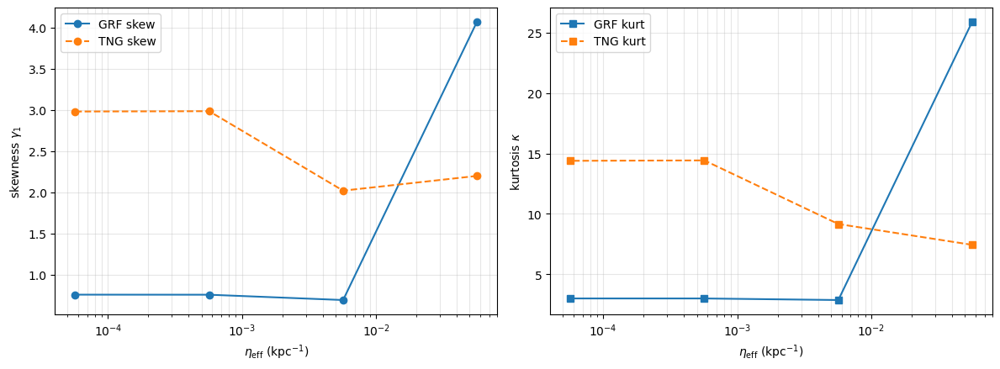

In [32]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(12, 4.5), sharex=True)

# --- Skewness panel
axs[0].plot(ETA_EFF, SKEW_GRF, marker="o", label="GRF skew")
axs[0].plot(ETA_EFF, SKEW_TNG, marker="o", ls="--", label="TNG skew")
axs[0].set_xscale("log")
axs[0].set_xlabel(r"$\eta_{\rm eff}$ (kpc$^{-1}$)")
axs[0].set_ylabel(r"skewness $\gamma_1$")
axs[0].grid(True, which="both", alpha=0.3)
axs[0].legend()

# --- Kurtosis panel (Pearson kurtosis)
axs[1].plot(ETA_EFF, KURT_GRF, marker="s", label="GRF kurt")
axs[1].plot(ETA_EFF, KURT_TNG, marker="s", ls="--", label="TNG kurt")
axs[1].set_xscale("log")
axs[1].set_xlabel(r"$\eta_{\rm eff}$ (kpc$^{-1}$)")
axs[1].set_ylabel(r"kurtosis $\kappa$")
axs[1].grid(True, which="both", alpha=0.3)
axs[1].legend()

plt.tight_layout()
plt.show()